In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

## Reproduce ETV Result for KIC 6525196 

- also known asTIC 1377577768
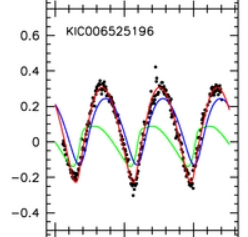

(x, time-span: ~1300 d ; y, O-C in kilosecs)

Source:  `2013ApJ...768...33R` [Triple-star Candidates among the Kepler Binaries](https://ui.adsabs.harvard.edu/abs/2013ApJ...768...33R/abstract) 


In [6]:
# define the plotting parameters

figsize = (8,4)

In [9]:
# import the data

# choose a TIC ID to analyze
ticid = 137757776
kicid = 6525196  # ETV amplitude ~300sec
# reference: 2013ApJ
# 
# TODO: consider to include Kepler data

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')  
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../
import astropy.units as u



sr = lk.search_lightcurve('KIC{}'.format(kicid))
sr = sr[sr.exptime == 1800 * u.s]  # exclude 1 quarter that has both 30min and 1min cadence data
sr = lke._sort_chronologically(sr)
display(sr)
lcc_kplr = sr.download_all()
lc_kplr = lcc_kplr[:].stitch()
lc_kplr.time.format = "mjd"  # to be consistent with the paper result, also for ease of combining with TESS data
lc_kplr = lc_kplr.truncate(None, 55800)  # test with ~1 ETV cycle based on reference plot

sr = lk.search_lightcurve('TIC {}'.format(ticid), author="SPOC")  # all available TESS sectors has short cadence data
# sr = lke.filter_by_priority(sr, author_priority=['SPOC', 'TESS-SPOC'], exptime_priority=['short', 'long', 'fast'])
# sr = sr[np.isin(sr.author, ['SPOC', 'TESS-SPOC'])]  # exclude QLP to ensure for uniformity in the data
# sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
display(sr)
lc_tess = sr.download_all().stitch()
lc_tess.time.format = "mjd"

search_result = lk.LightCurveCollection([
    lc_kplr,
    lc_tess,
]).stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,Kepler Quarter 00,2009,Kepler,1800,kplr006525196,0.0,EX
1,Kepler Quarter 01,2009,Kepler,1800,kplr006525196,0.0,EX
2,Kepler Quarter 02,2009,Kepler,1800,kplr006525196,0.0,EX
3,Kepler Quarter 03,2009,Kepler,1800,kplr006525196,0.0,EX
4,Kepler Quarter 04,2010,Kepler,1800,kplr006525196,0.0,EX
5,Kepler Quarter 05,2010,Kepler,1800,kplr006525196,0.0,EX
6,Kepler Quarter 06,2010,Kepler,1800,kplr006525196,0.0,EX
7,Kepler Quarter 07,2010,Kepler,1800,kplr006525196,0.0,EX
8,Kepler Quarter 08,2011,Kepler,1800,kplr006525196,0.0,EX


#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 40,2021,SPOC,120,137757776,0.0,N/A
1,TESS Sector 41,2021,SPOC,120,137757776,0.0,N/A
2,TESS Sector 54,2022,SPOC,120,137757776,0.0,N/A
3,TESS Sector 55,2022,SPOC,120,137757776,0.0,N/A


112769

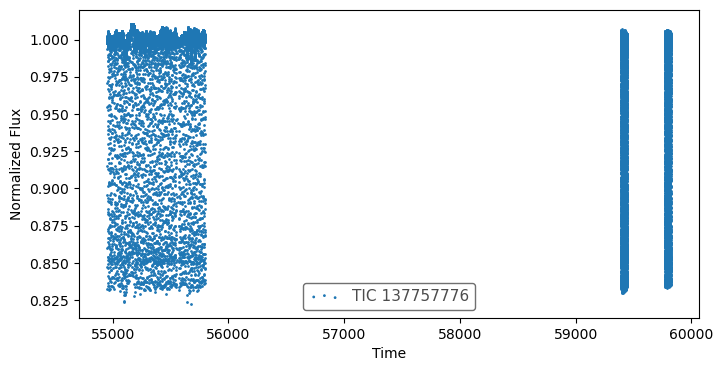

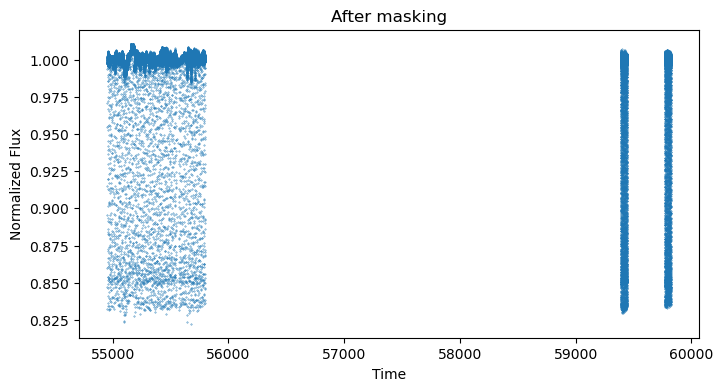

In [10]:
%matplotlib inline
# %matplotlib widget

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)


mask = time < 0 #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data  

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,            
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

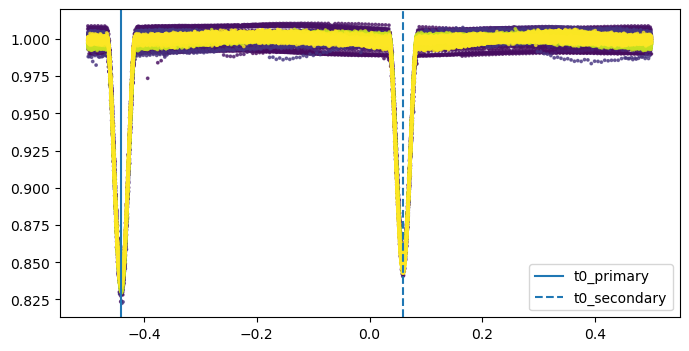

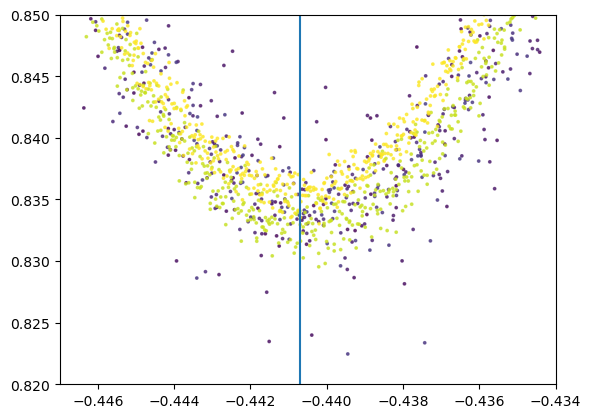

In [17]:
%matplotlib inline
# %matplotlib widget

from astropy.time import Time

# define the orbital period and the t0 

# FILL-IN THE eclipse epoch / period, 
# period = 3.4206042  # Kepler EB Period
period = 3.42060  # 2013ApJ Period


t0_primary = 54954.352139 - 0.5  # Kepler EB, the MJD there seems to be off by 0.5
t0_secondary = t0_primary + period * 0.5001


# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

duration_hr_primary = 0.0418 * period * 24  # used for the window to cut the lighcurve around eclipses in later cells
duration_hr_secondary = 0.0409 * period * 24  

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.xlim(-0.447, -0.434);
plt.ylim(0.82, 0.85);
plt.show()

### Now that the data is ready we can start 

In [18]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,54953.039027,0.997616,0.000022,0.321589
1,54953.059462,0.997515,0.000022,0.327563
2,54953.079896,0.997531,0.000022,0.333537
3,54953.100331,0.997538,0.000022,0.339511
4,54953.120766,0.997538,0.000022,0.345485
...,...,...,...,...
112708,59823.759877,1.001665,0.000885,0.259158
112709,59823.761266,0.999780,0.000885,0.259564
112710,59823.762655,0.999874,0.000885,0.259970
112711,59823.764044,0.999171,0.000885,0.260376


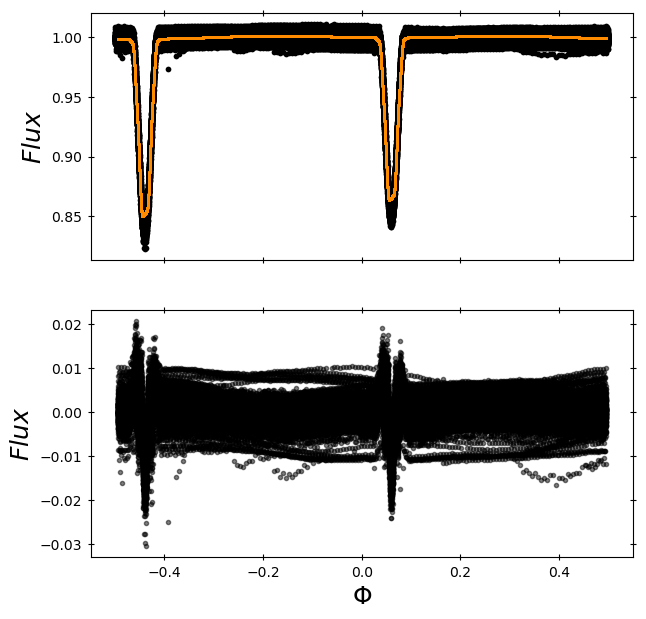

,time,flux,err,phase,flux_sub_binary,binary_model
0,54953.039027,0.997616,0.000022,0.321589,-0.003387,1.001003
1,54953.059462,0.997515,0.000022,0.327563,-0.003484,1.001000
2,54953.079896,0.997531,0.000022,0.333537,-0.003470,1.001001
3,54953.100331,0.997538,0.000022,0.339511,-0.003410,1.000948
4,54953.120766,0.997538,0.000022,0.345485,-0.003303,1.000841
...,...,...,...,...,...,...
112708,59823.759877,1.001665,0.000885,0.259158,0.000686,1.000979
112709,59823.761266,0.999780,0.000885,0.259564,-0.001201,1.000981
112710,59823.762655,0.999874,0.000885,0.259970,-0.001108,1.000982
112711,59823.764044,0.999171,0.000885,0.260376,-0.001813,1.000984


In [19]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 111528 901
reached the end
10 103682 901
reached the end
10 102268 901
reached the end
10 101769 901
reached the end
10 101545 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,54953.039027,0.997616,0.000022,0.321589,-0.003387,1.001003,1.000917
1,54953.059462,0.997515,0.000022,0.327563,-0.003484,1.001000,1.000808
2,54953.079896,0.997531,0.000022,0.333537,-0.003470,1.001001,1.000817
3,54953.100331,0.997538,0.000022,0.339511,-0.003410,1.000948,1.000816
4,54953.120766,0.997538,0.000022,0.345485,-0.003303,1.000841,1.000809
...,...,...,...,...,...,...,...
112708,59823.759877,1.001665,0.000885,0.259158,0.000686,1.000979,1.002245
112709,59823.761266,0.999780,0.000885,0.259564,-0.001201,1.000981,1.000361
112710,59823.762655,0.999874,0.000885,0.259970,-0.001108,1.000982,1.000456
112711,59823.764044,0.999171,0.000885,0.260376,-0.001813,1.000984,0.999755


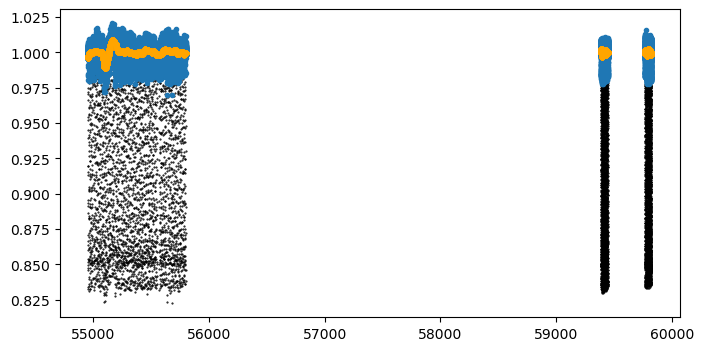

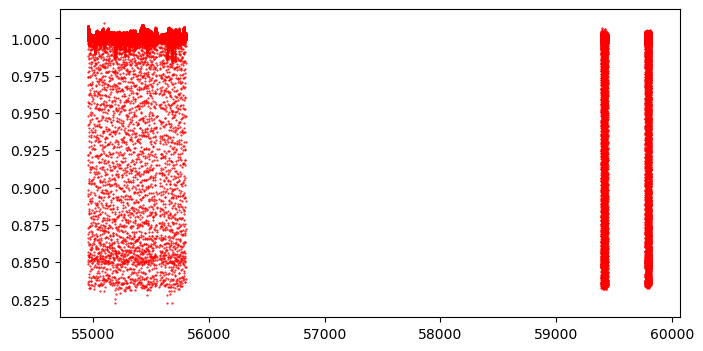

In [20]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

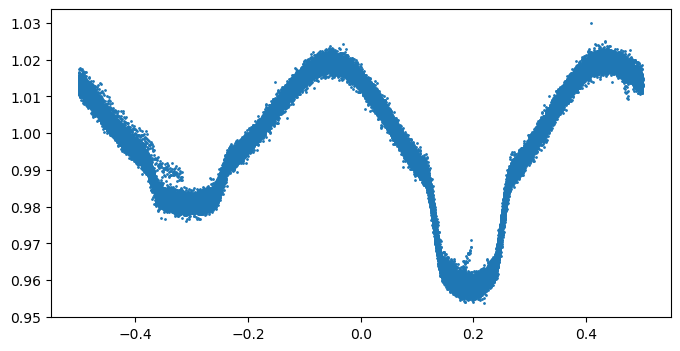

In [30]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   54953.852139 -0.44070075425196403
window_width_p (phase): 0.031349999999999996
Secondary: 54955.562781060005 0.059399245748916085
window_width_s (phase): 0.030674999999999994


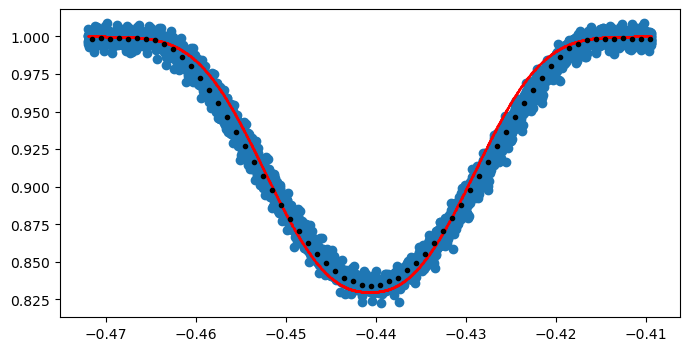

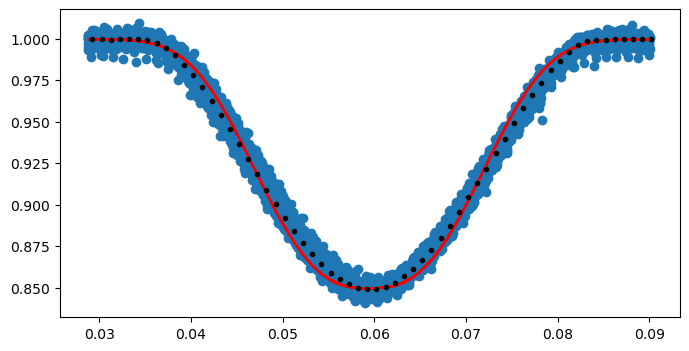

In [45]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.75 * duration_hr_primary / 24 / period
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p) & (data['phase'] < midpoint_p + window_width_p) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)
    
    window_width_s = 0.75 * duration_hr_secondary / 24 / period
    # window_width_s = window_width_p
    print("window_width_s (phase):", window_width_s)
    
    data_secondary = data[(data['phase'] > midpoint_s - window_width_s) & (data['phase'] < midpoint_s + window_width_s) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1, -0.17, midpoint_p, 0.01, 1.2]
start_vals_s = [1, -0.15, midpoint_s, 0.01, 1.4]
    
# -- -- -- -- -- -- -- -- -- 
etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)    

100%|██████████████████████████████████████████████████████████| 1000/1000 [03:23<00:00,  4.90it/s]


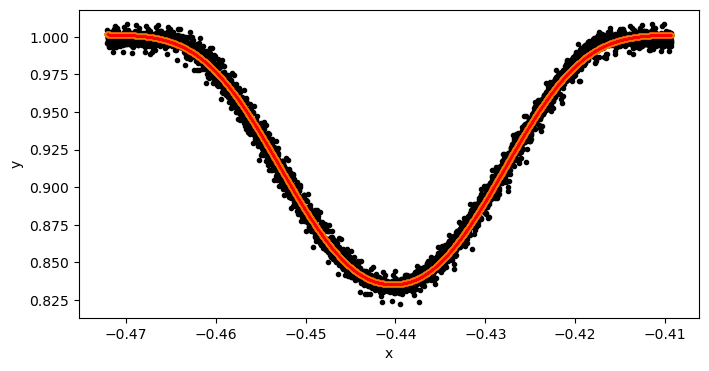

100%|██████████████████████████████████████████████████████████| 1000/1000 [03:19<00:00,  5.02it/s]


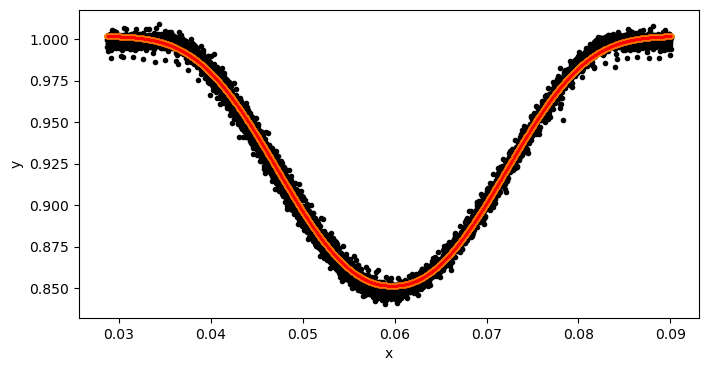

In [46]:
# run the initial model fit using MCMC for the primary and secondary eclipses 
run_init_fit = True

if run_init_fit:
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
    !$NOTIFY_CMD "Initial fit done"

In [33]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")

    # initial fit params from Kepler data (<MJD 55800) & TESS data, 2013Apj Period
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0017153523557514, -0.16632481838880414, -0.440316816736789, 0.011207103071227714, 1.091155868421973
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0020415726999536, -0.15060591856147404, 0.05970930768129202, 0.011219368528233093, 1.0925047933621692

    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])    

In [47]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0017153523557514, -0.16632481838880414, -0.440316816736789, 0.011207103071227714, 1.091155868421973
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0020415726999536, -0.15060591856147404, 0.05970930768129202, 0.011219368528233093, 1.0925047933621692


1423

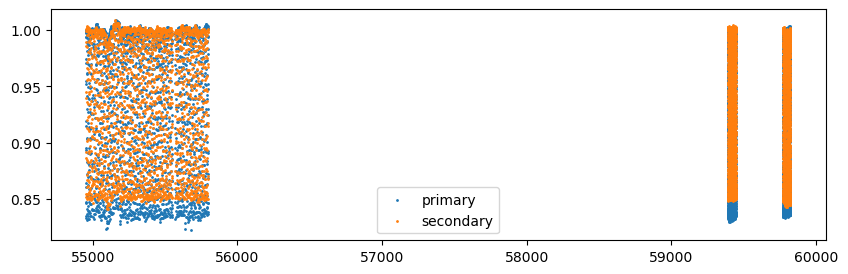

In [48]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

54953.852139 3.4206 54953.852139


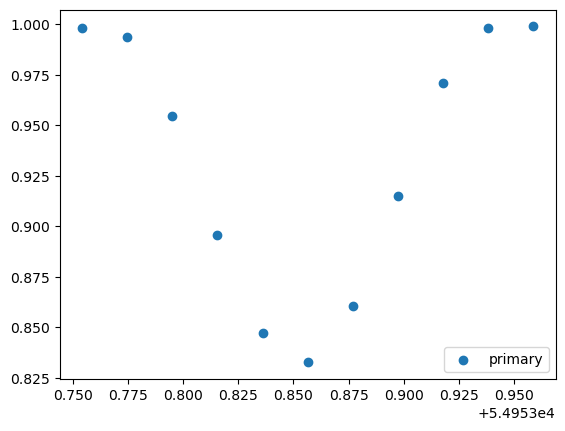

54953.852139 3.4206 54957.272739


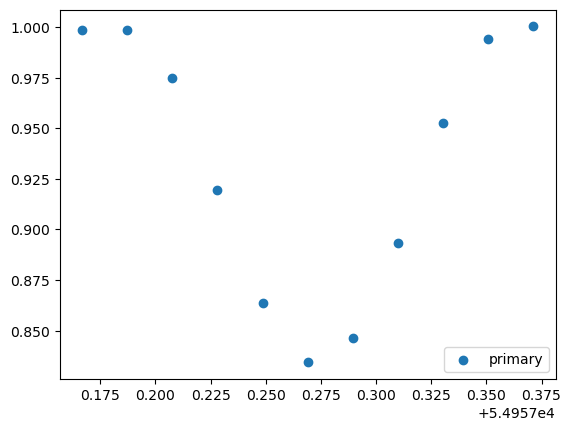

54953.852139 3.4206 54960.693339000005


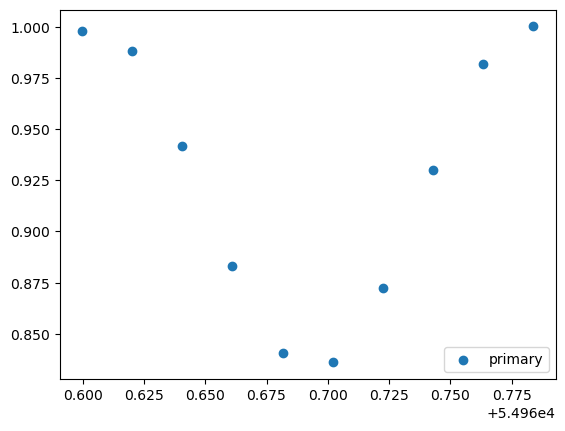

54955.562781060005 3.4206 54955.562781060005


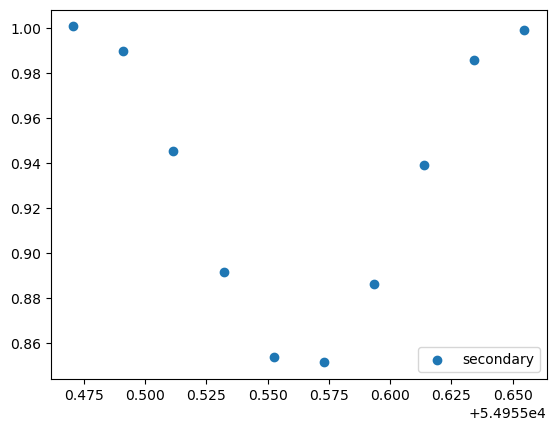

54955.562781060005 3.4206 54958.98338106


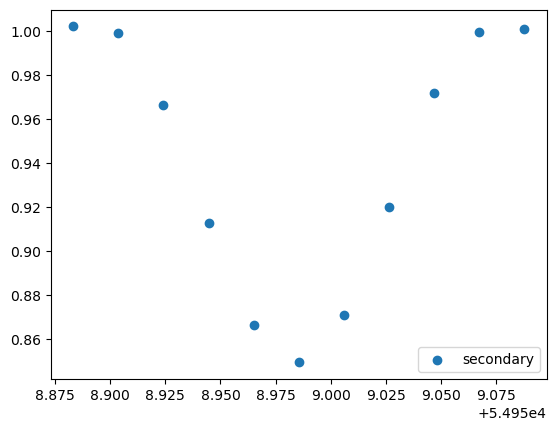

54955.562781060005 3.4206 54962.40398106001


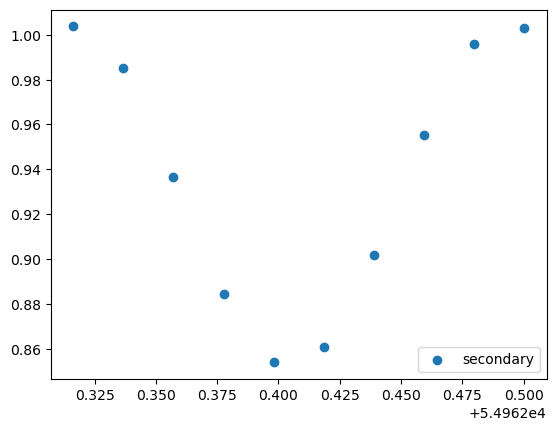

In [62]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

if t0_secondary is not None:
    for i in tr_index[0:3]:        
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux) 
        yerr = np.array(data_secondary.err)
        
        print (t0_secondary, period, transit_time)
        
        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
        
        x = np.array(x[mask])
        y = np.array(y[mask]) 
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
Number 4 has already been completed -- skip
Number 5 has already been completed -- skip
Number 6 has already been completed -- skip
Number 7 has already been completed -- skip
54981.216939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1274.11it/s]


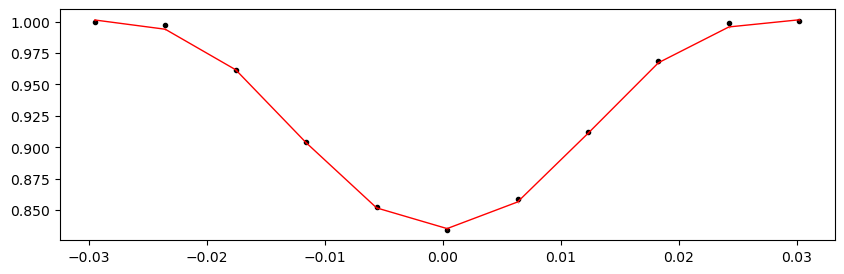

54984.637539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1296.75it/s]


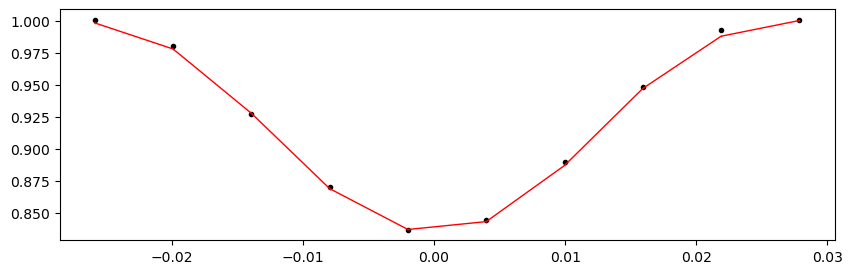

Time 54988.058139 does not have enough data points: 9
54991.478739000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1269.28it/s]


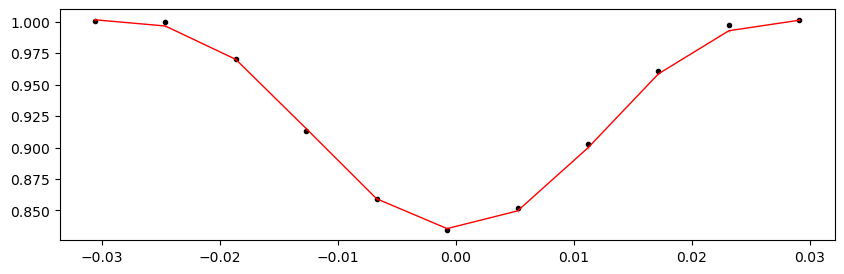

54994.899339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1278.27it/s]


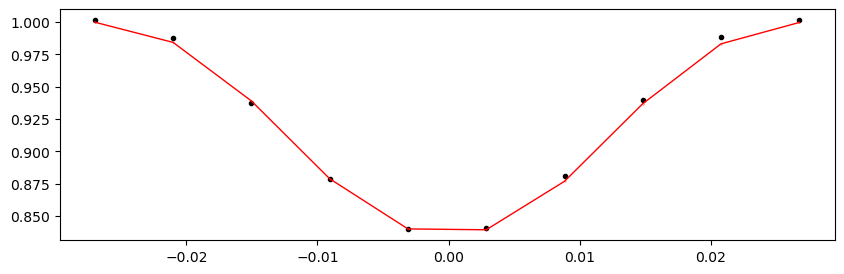

55005.161139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1174.10it/s]


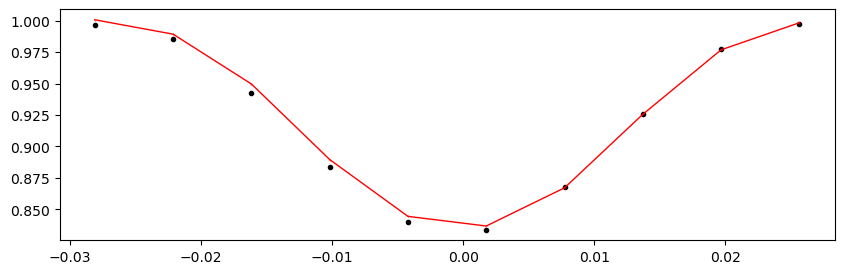

55008.581739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1122.15it/s]


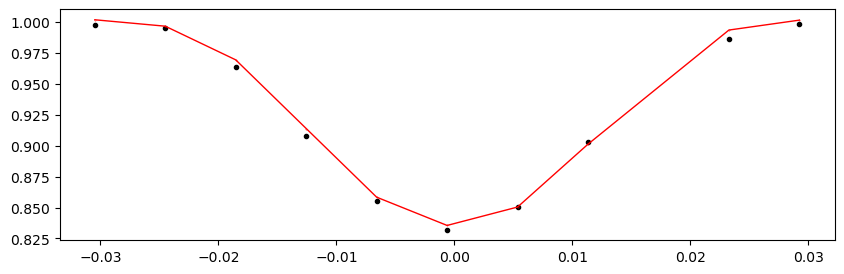

55012.002339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1220.59it/s]


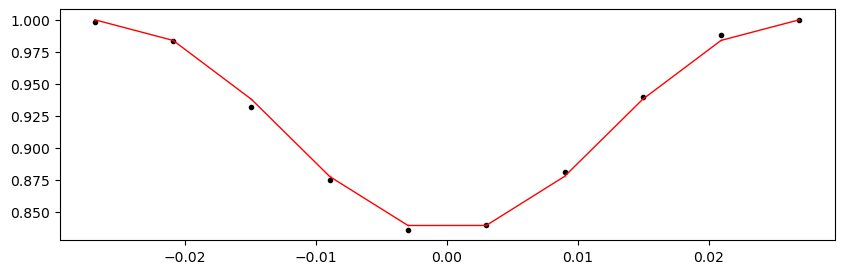

55018.843539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.18it/s]


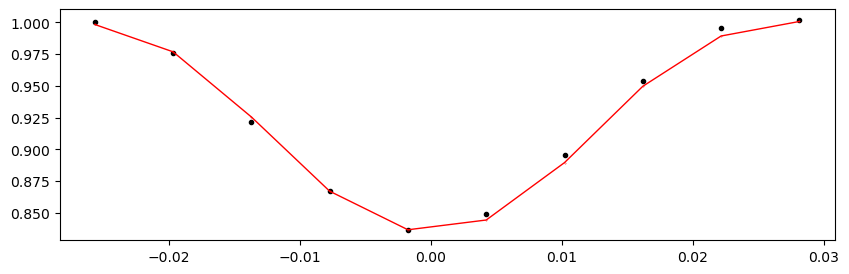

55022.264139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.50it/s]


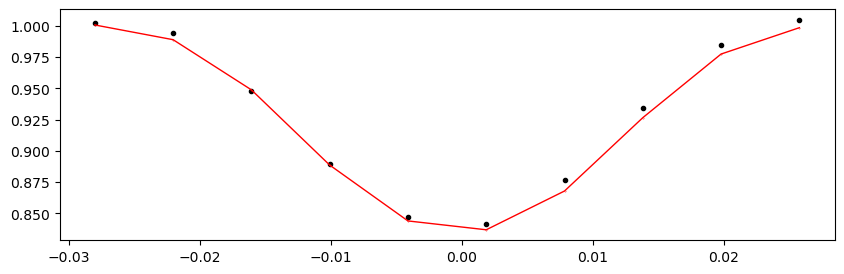

55025.684739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.29it/s]


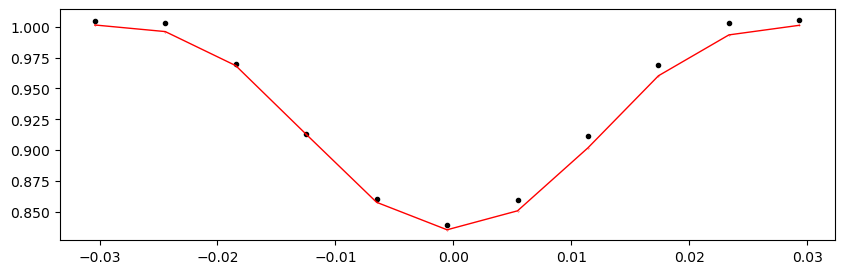

55029.105339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.63it/s]


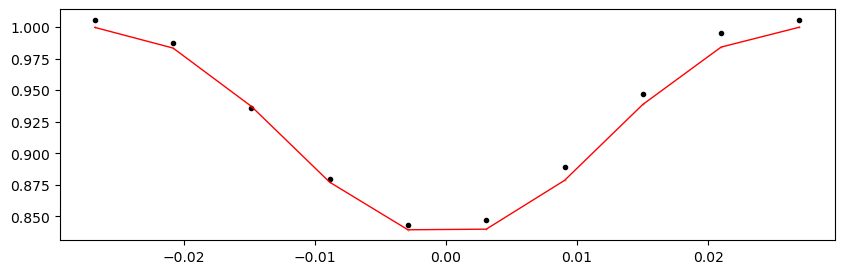

55032.525939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.95it/s]


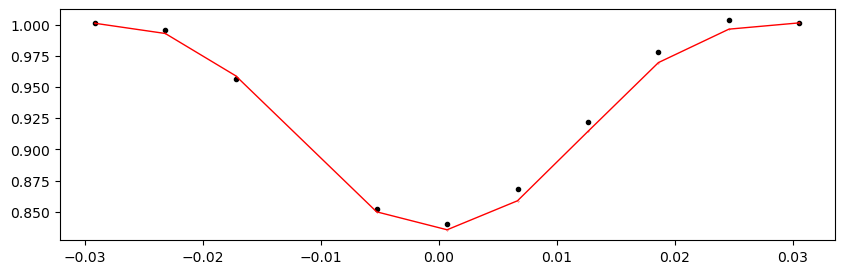

55035.946539000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.19it/s]


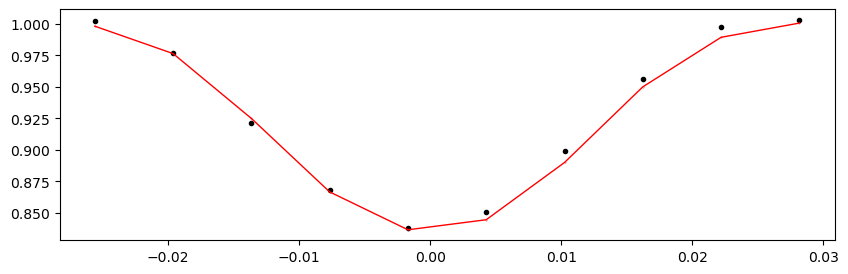

55039.367139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.01it/s]


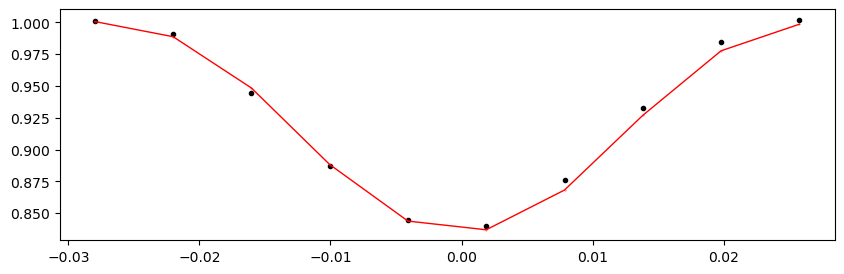

55042.787739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.12it/s]


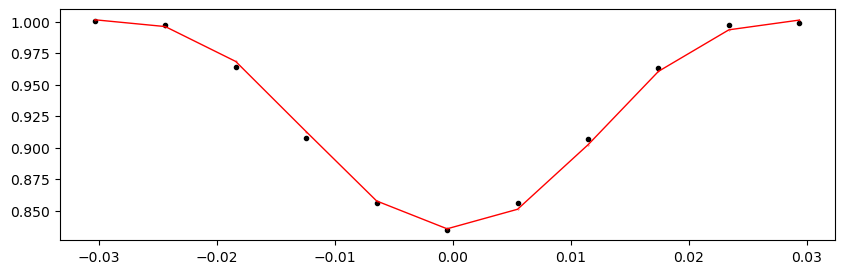

55046.208339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:09<00:00, 1049.85it/s]


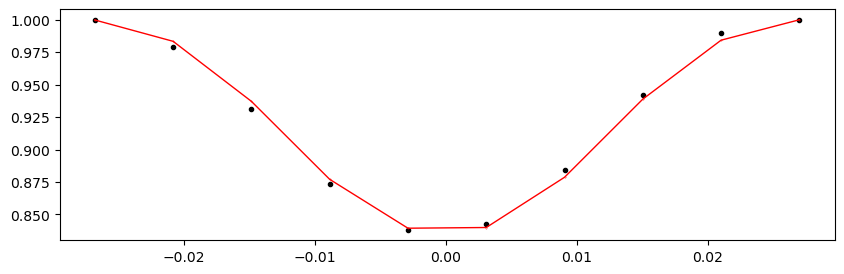

55049.628939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1162.43it/s]


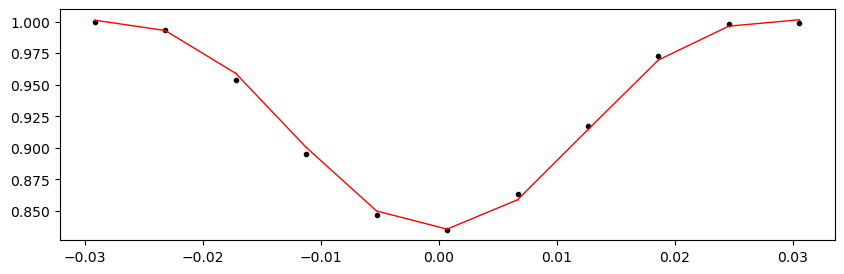

55053.049539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.23it/s]


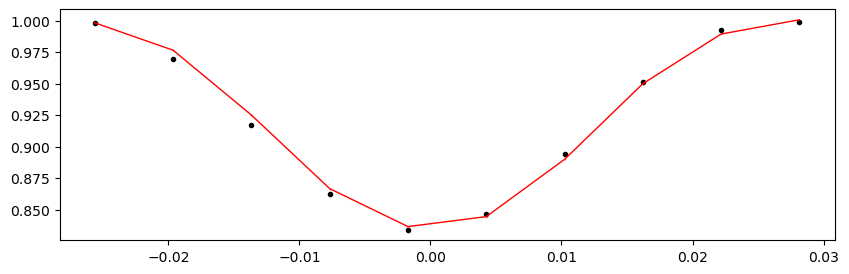

55056.470139000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.22it/s]


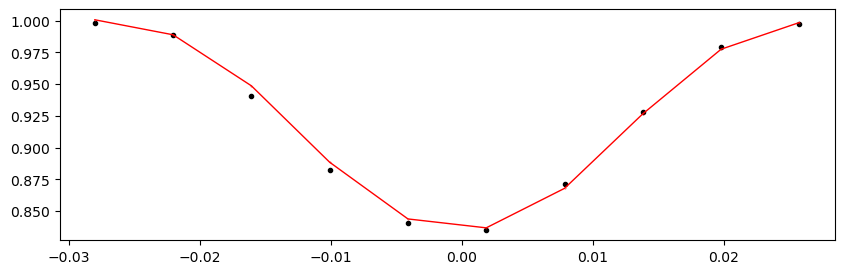

55059.890739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.27it/s]


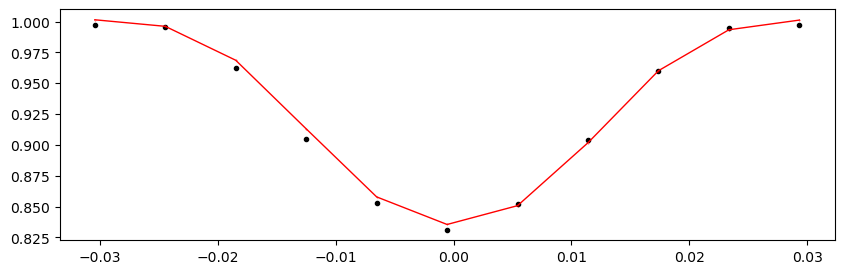

55066.731939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.55it/s]


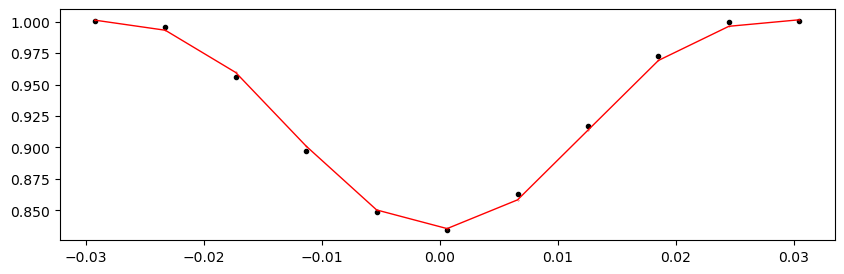

55070.152539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.22it/s]


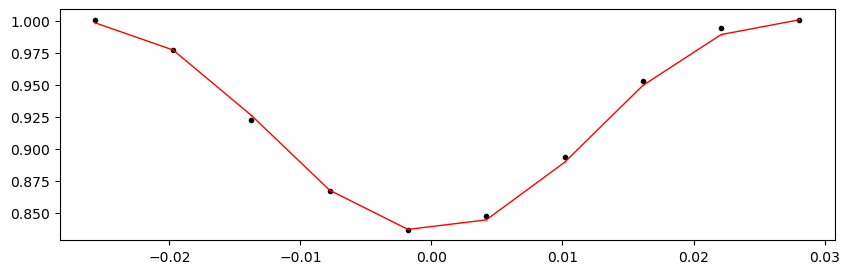

55073.573139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.34it/s]


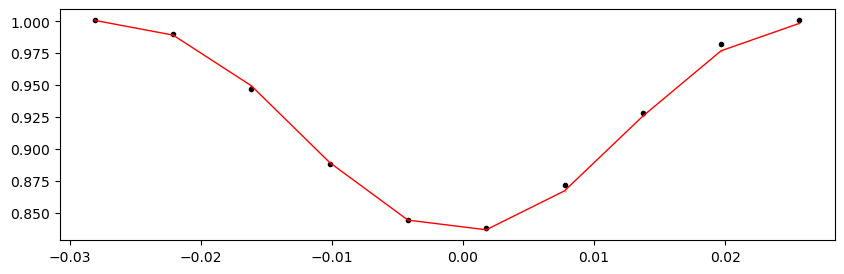

55076.993739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.97it/s]


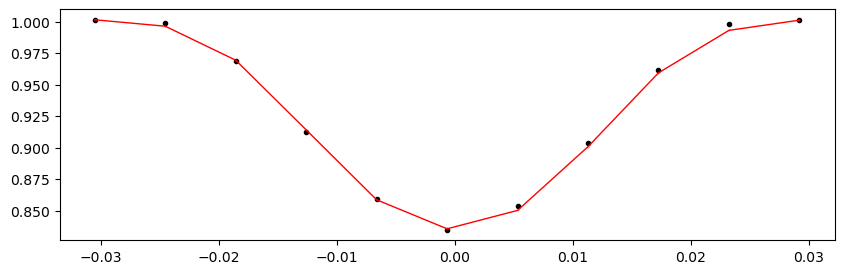

Time 55080.414339 does not have enough data points: 9
55083.834939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.12it/s]


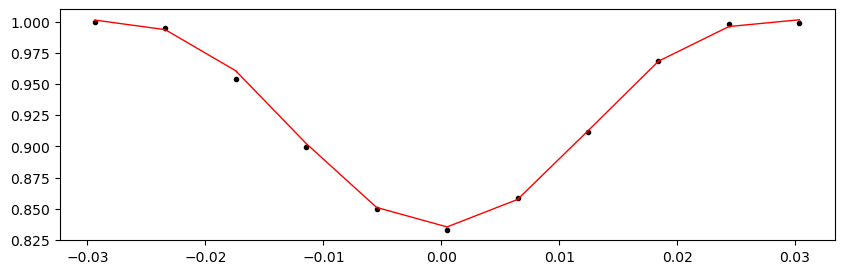

55087.255539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.37it/s]


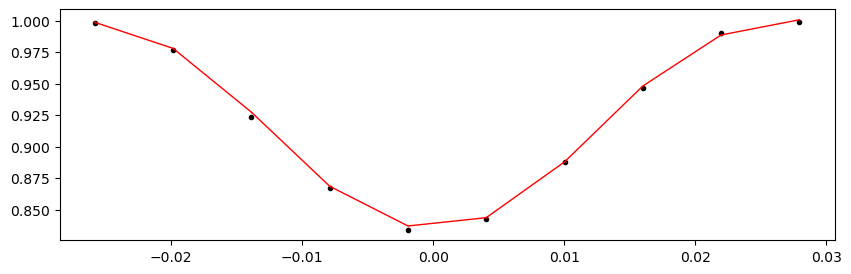

55090.676139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.37it/s]


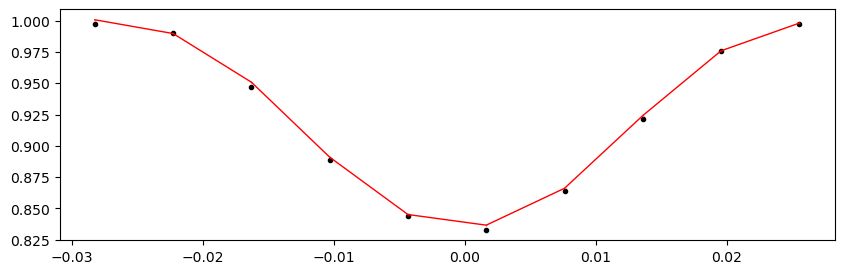

55094.096739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.00it/s]


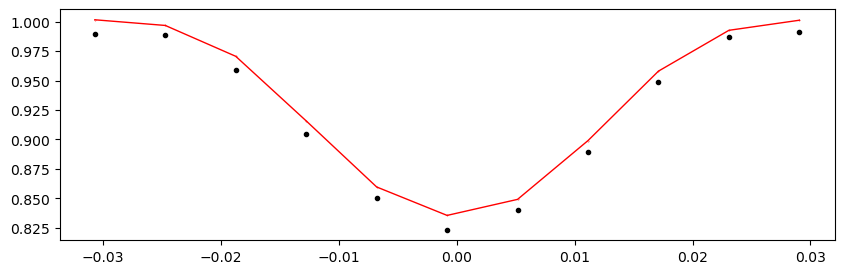

55097.517339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.18it/s]


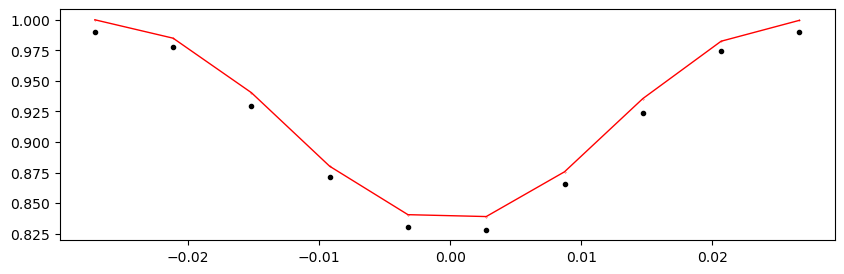

55100.937939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.80it/s]


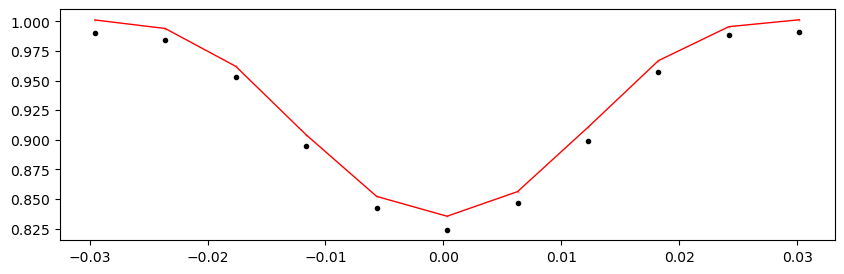

55104.358539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.67it/s]


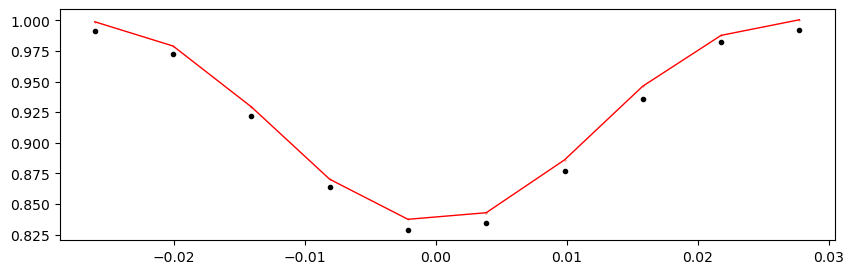

55107.779139000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.51it/s]


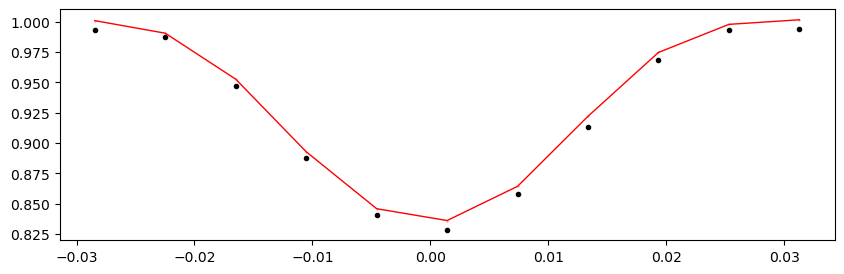

55111.199739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.14it/s]


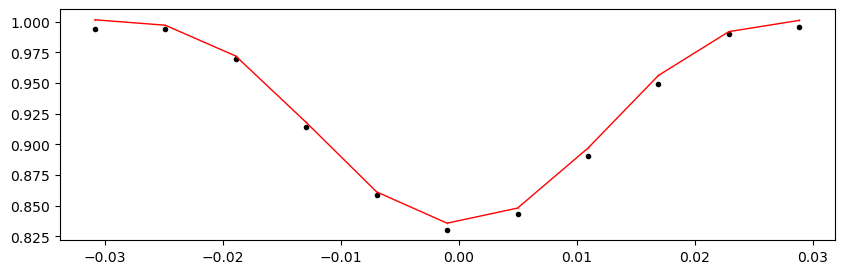

55114.620339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.29it/s]


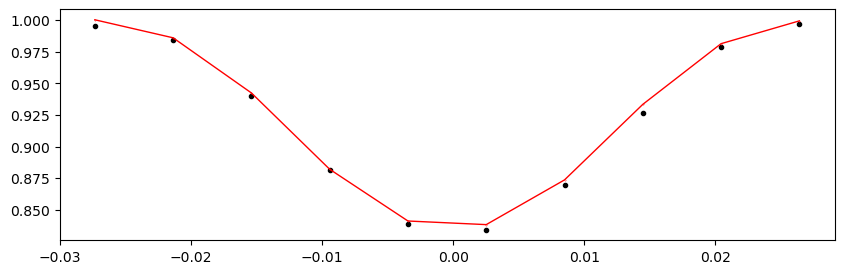

55118.040939000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.56it/s]


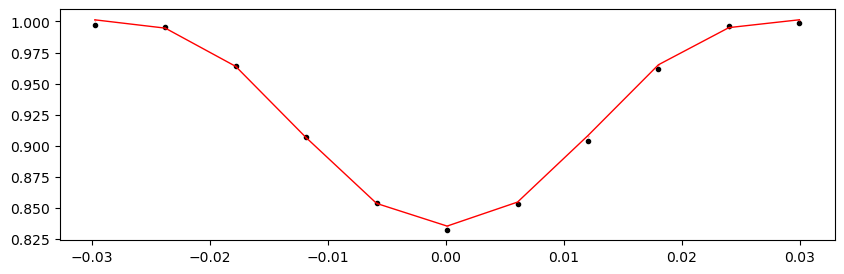

55121.461539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.88it/s]


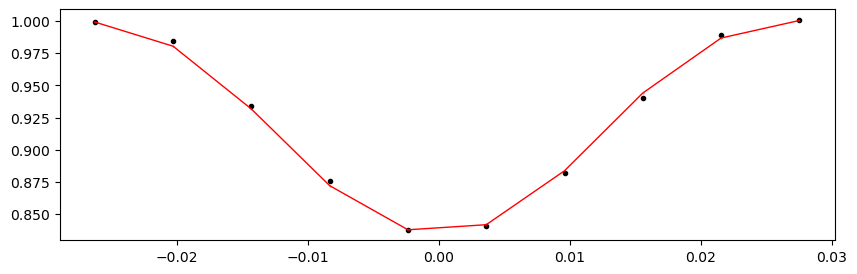

55124.882139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.77it/s]


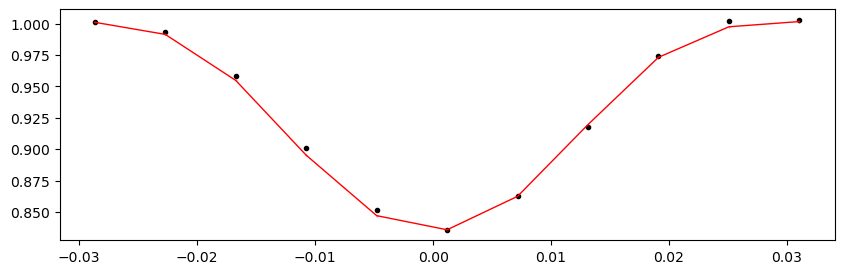

55128.302739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.91it/s]


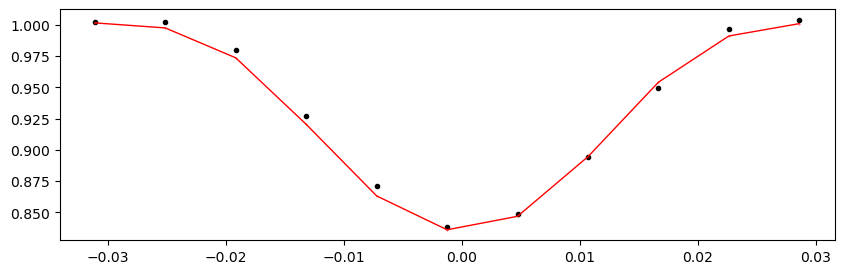

55131.723339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.52it/s]


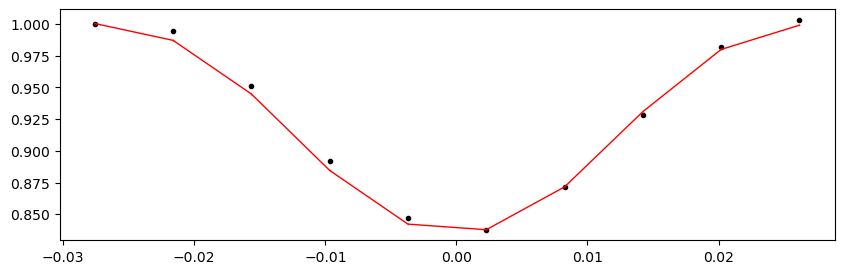

55135.143939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.72it/s]


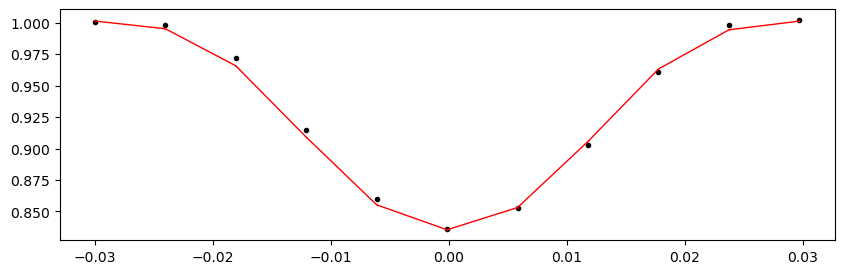

55138.564539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.67it/s]


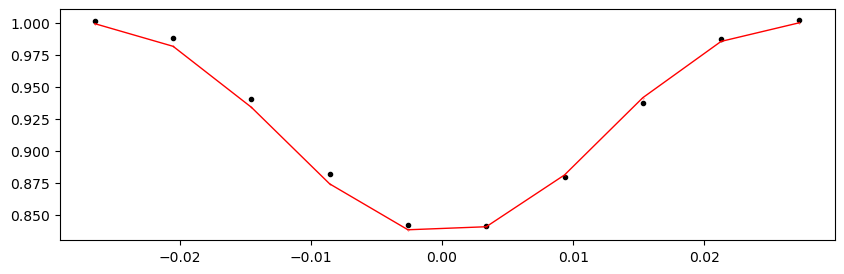

55141.985139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.53it/s]


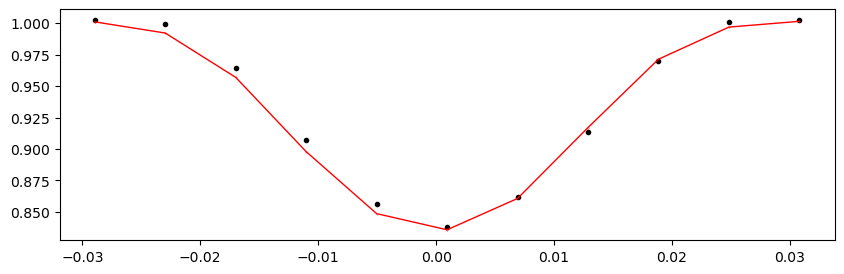

55145.405739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.23it/s]


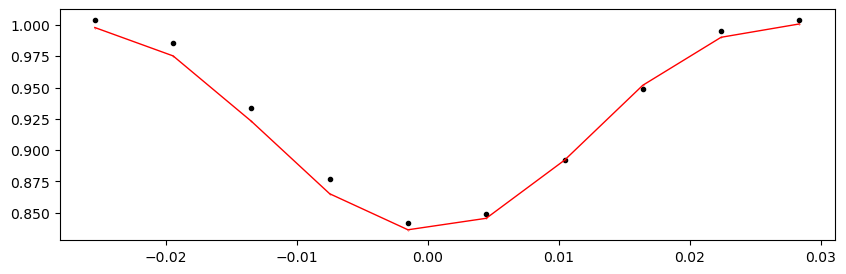

55148.826339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.05it/s]


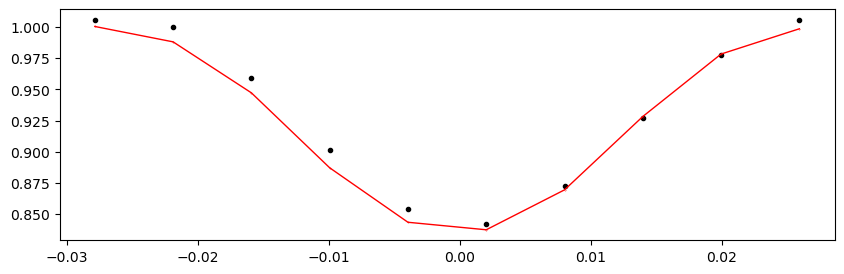

55152.246939000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.15it/s]


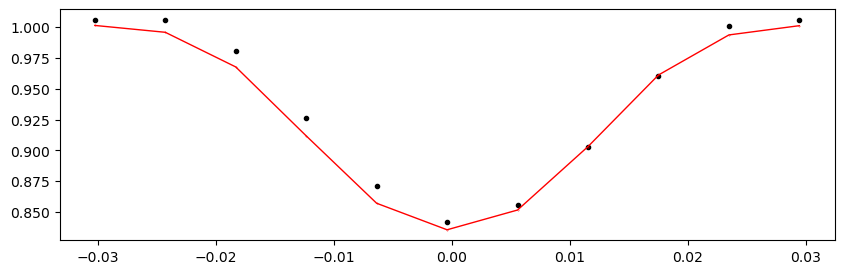

55159.088139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.40it/s]


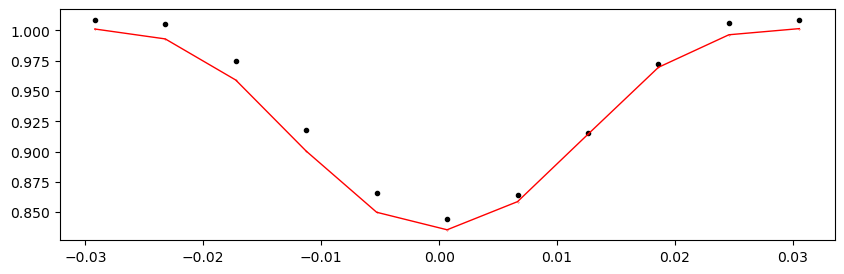

55162.508739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.46it/s]


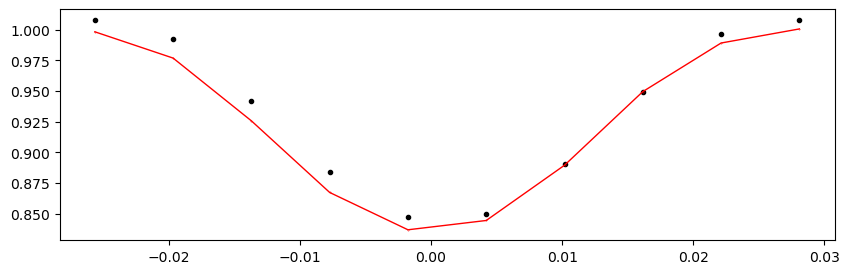

Time 55165.929339 does not have enough data points: 9
55169.349939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.57it/s]


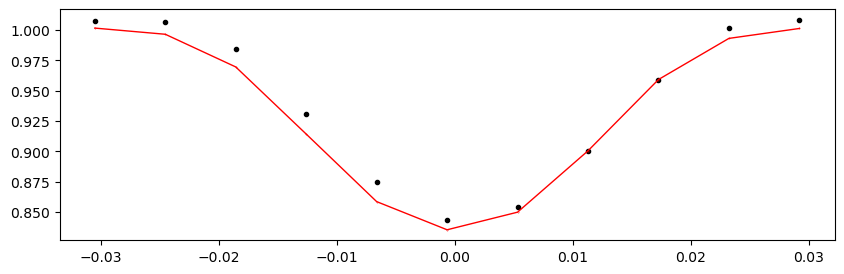

55172.770539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.39it/s]


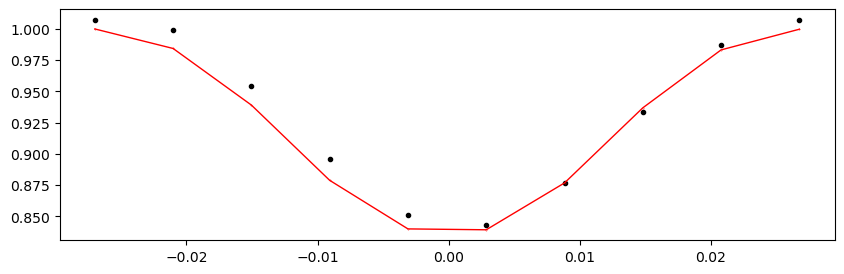

55176.191139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.79it/s]


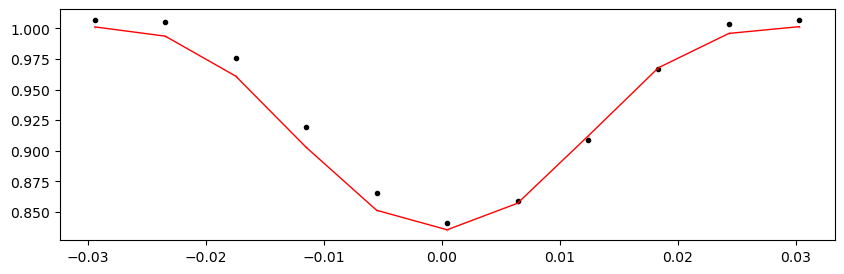

55179.611739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.29it/s]


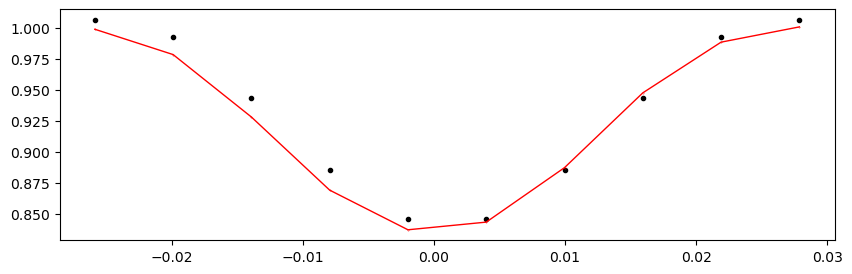

55186.452939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.65it/s]


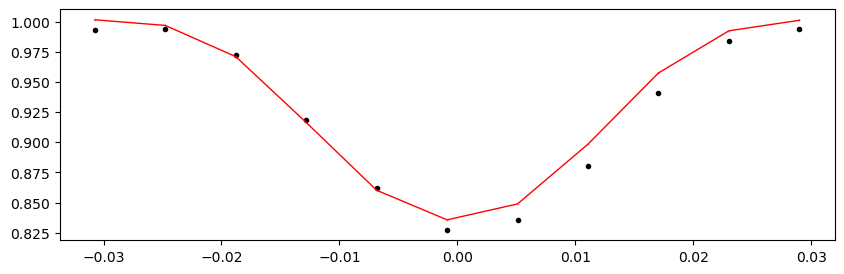

55189.873539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.83it/s]


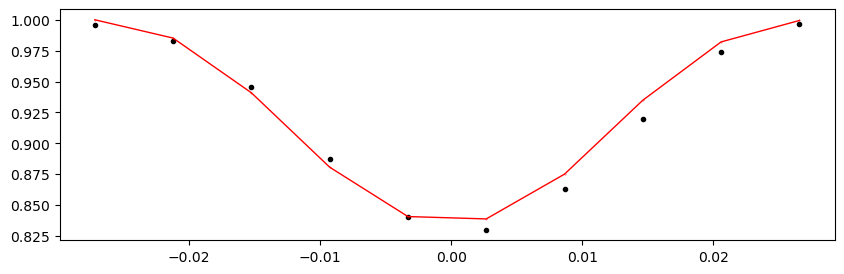

55193.294139000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.30it/s]


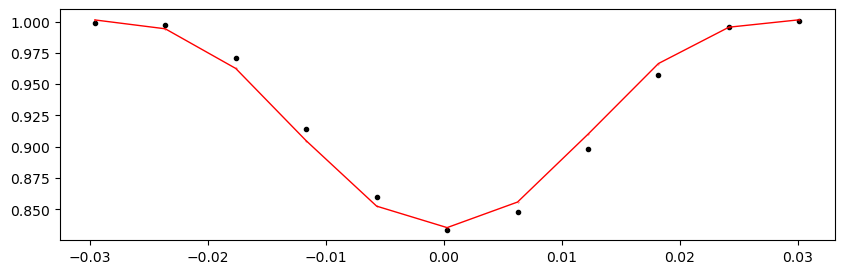

55196.714739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.21it/s]


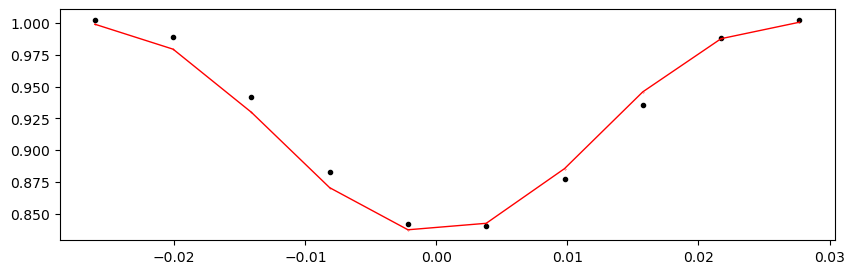

55200.135339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.29it/s]


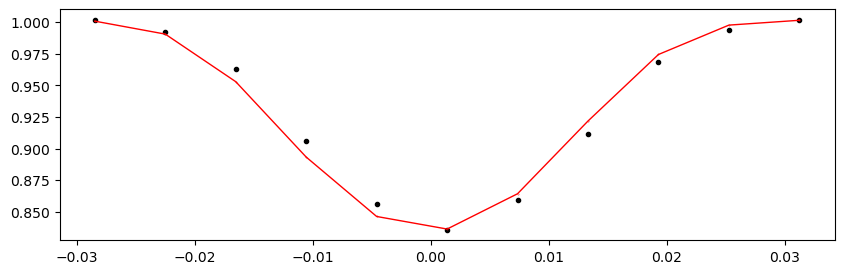

55203.555939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.45it/s]


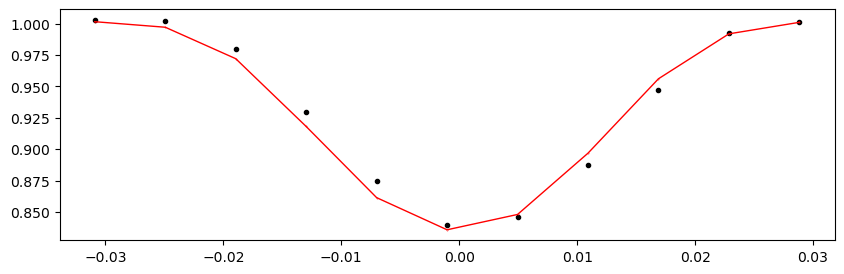

55206.976539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.97it/s]


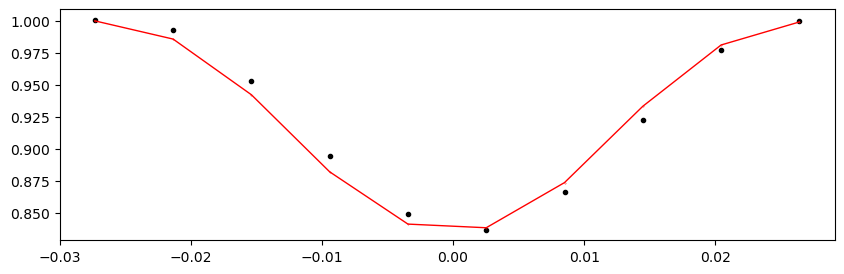

55210.397139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.53it/s]


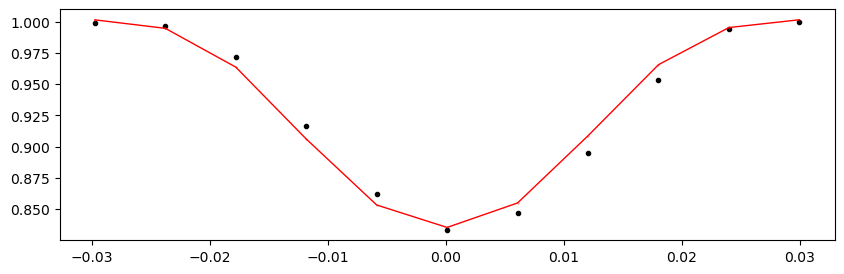

55213.817739000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.28it/s]


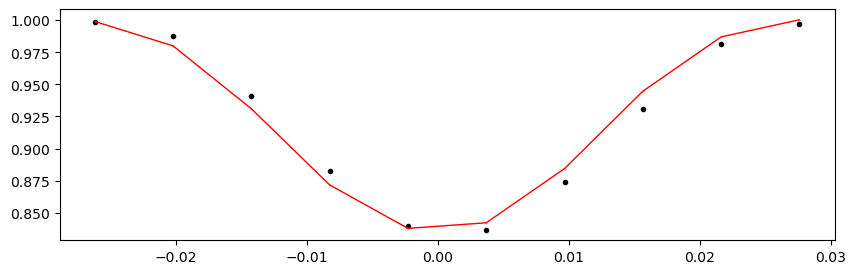

55217.238339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.08it/s]


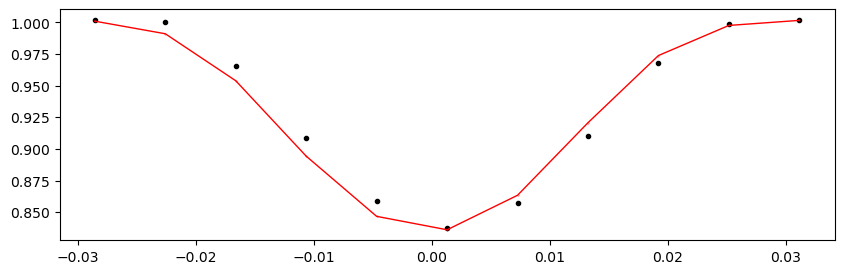

55220.658939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.47it/s]


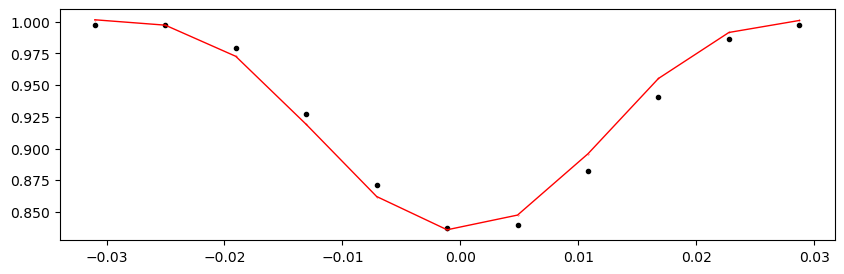

55224.079539000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.78it/s]


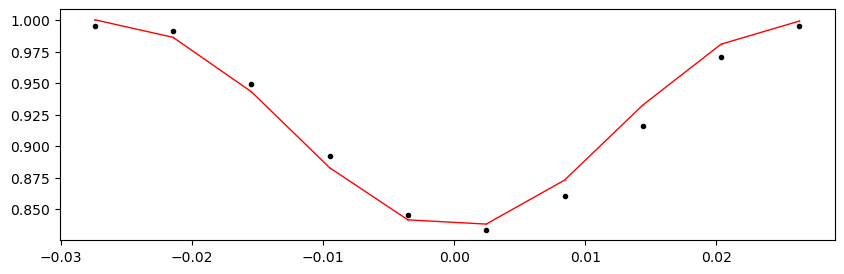

55227.500139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.82it/s]


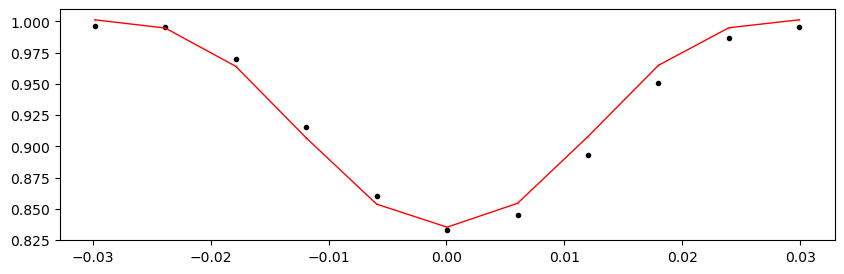

55234.341339000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.01it/s]


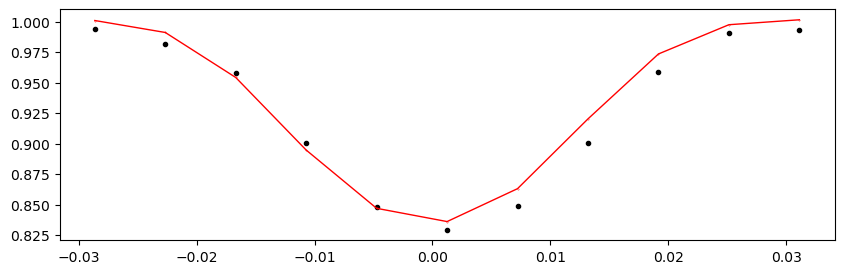

55237.761939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.83it/s]


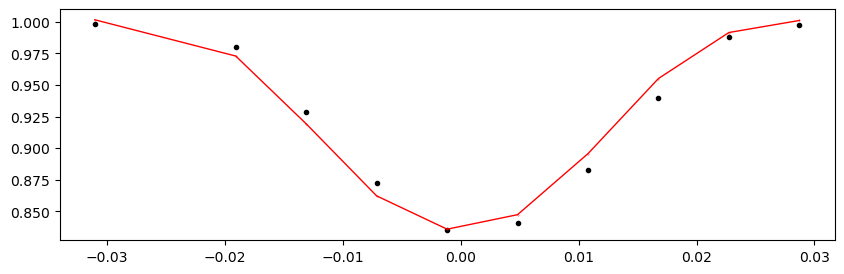

55241.182539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.08it/s]


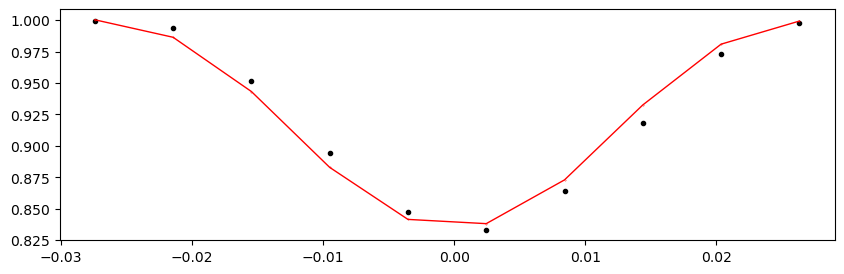

55244.603139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.37it/s]


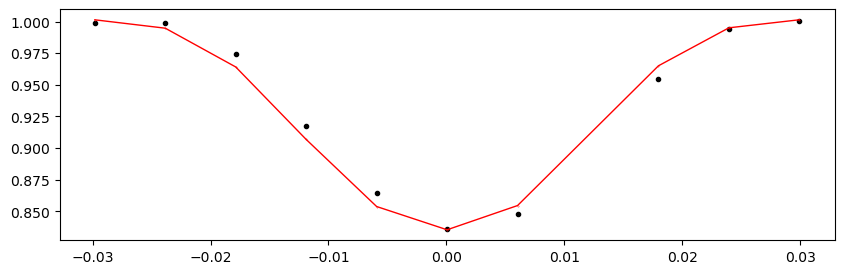

55248.023739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.02it/s]


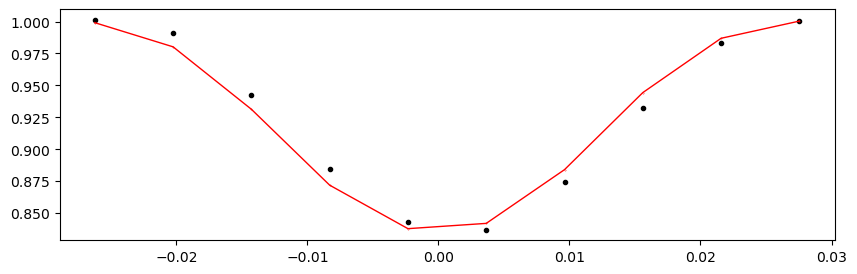

55251.444339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.98it/s]


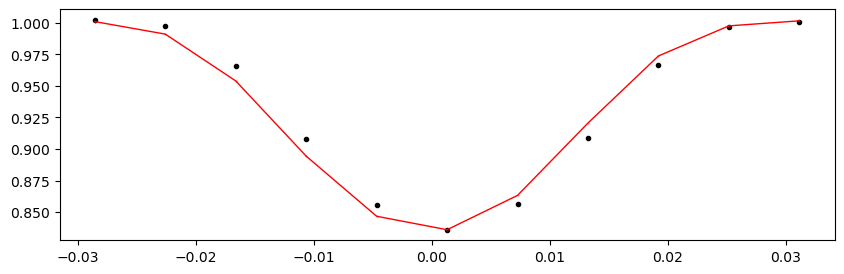

55254.864939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.73it/s]


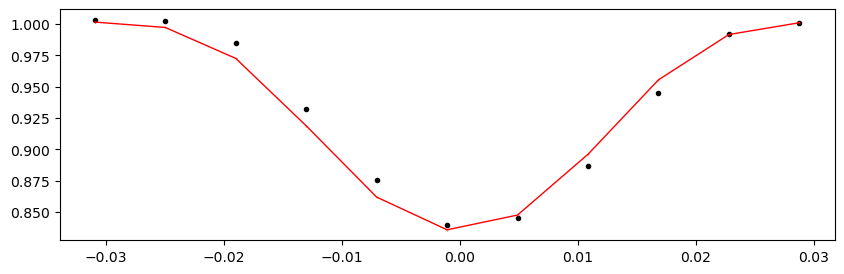

55258.285539000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.70it/s]


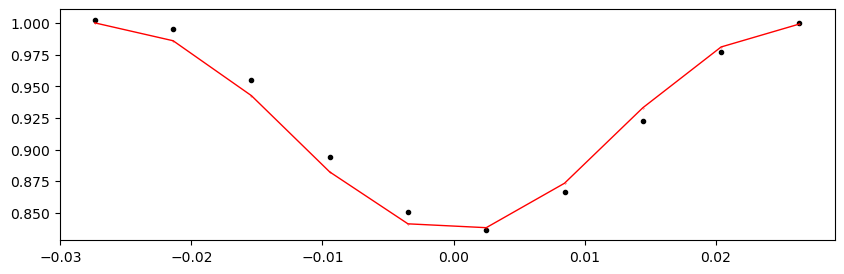

55261.706139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.33it/s]


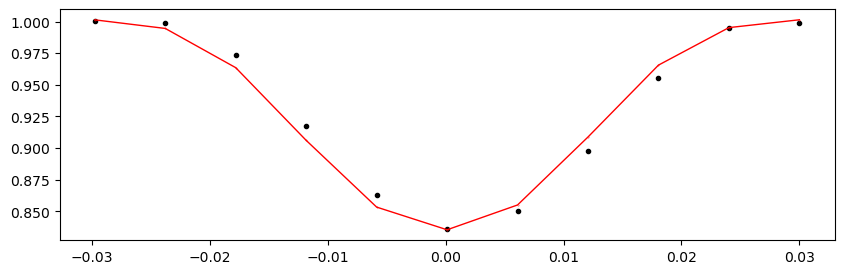

55265.126739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.38it/s]


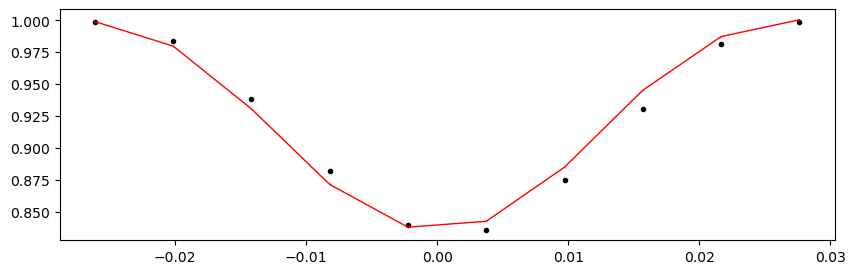

55268.547339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.04it/s]


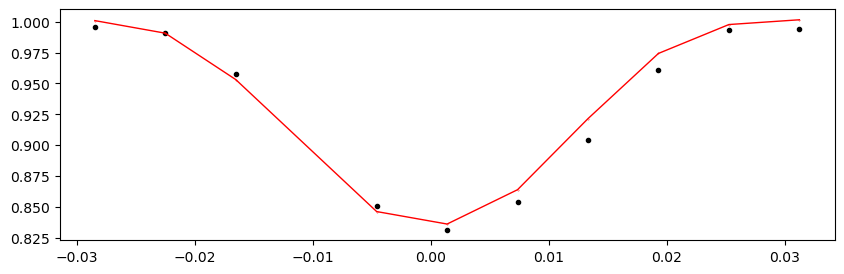

55271.967939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.65it/s]


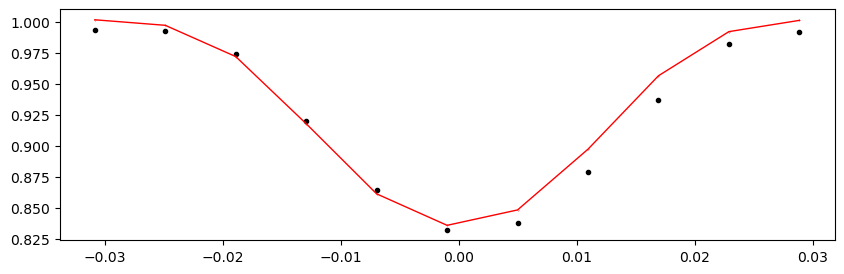

55278.809139000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.55it/s]


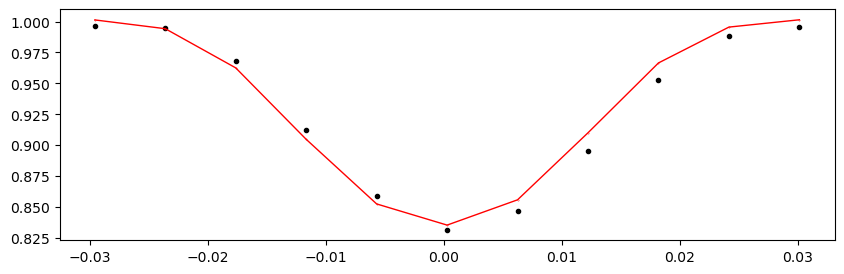

55282.229739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.58it/s]


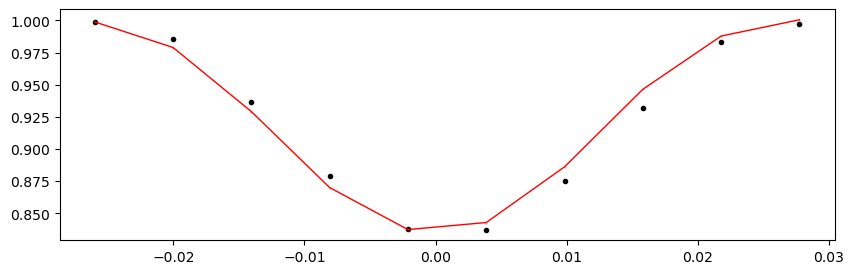

55285.650339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.40it/s]


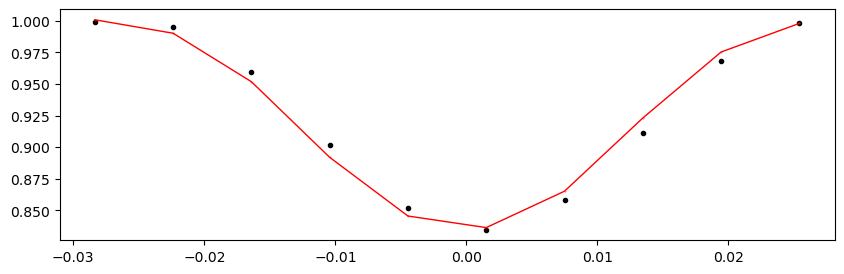

55289.070939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.66it/s]


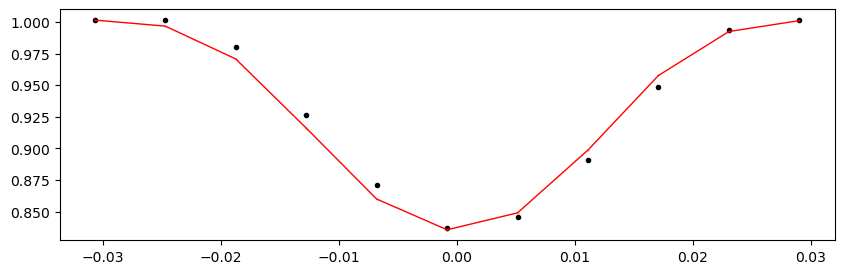

55292.491539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.99it/s]


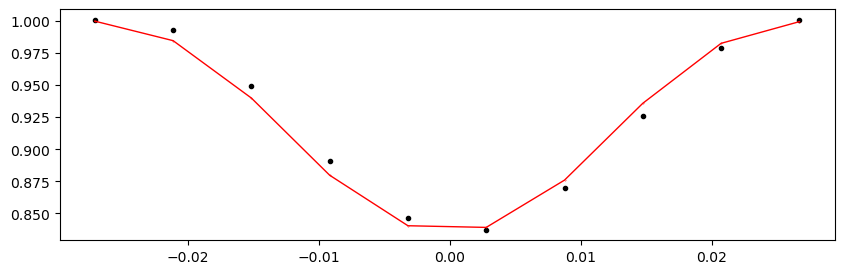

55295.912139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.91it/s]


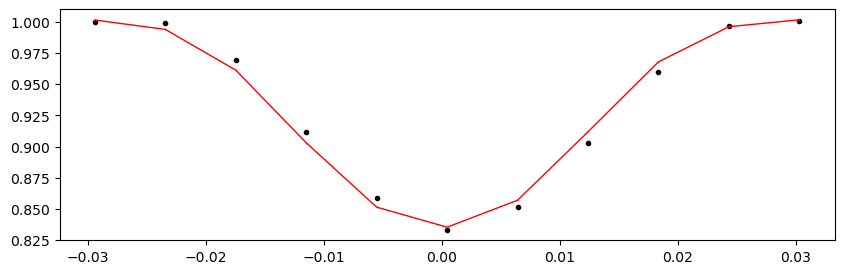

55299.332739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.68it/s]


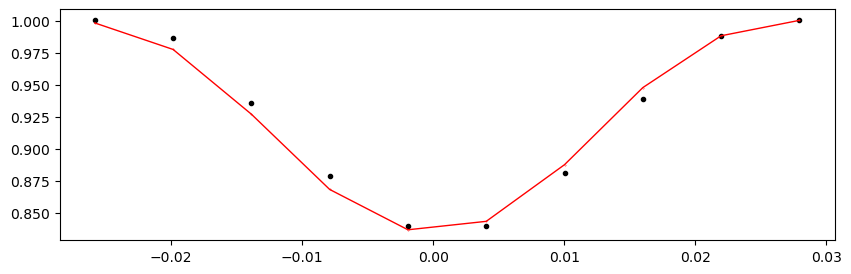

55302.753339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.28it/s]


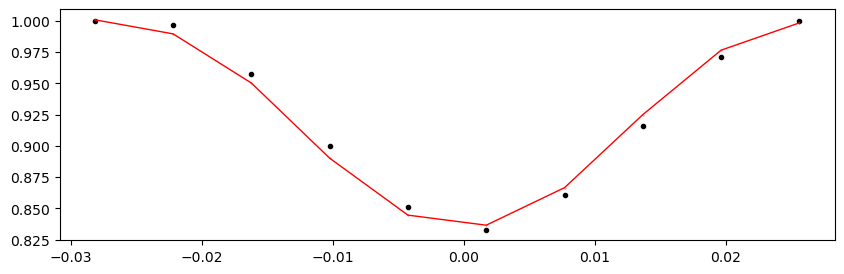

55306.173939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.22it/s]


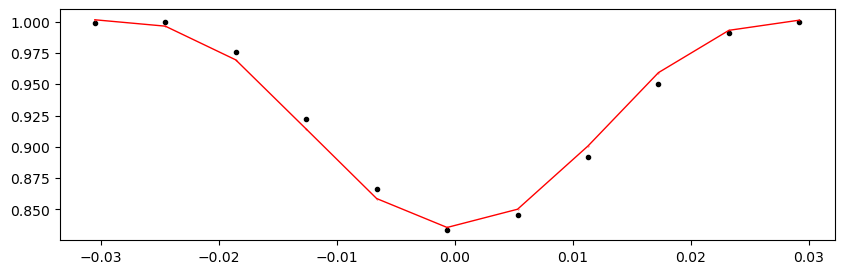

55309.594539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.74it/s]


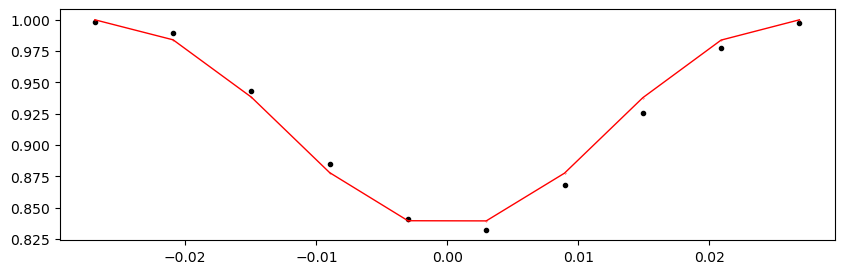

55313.015139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.61it/s]


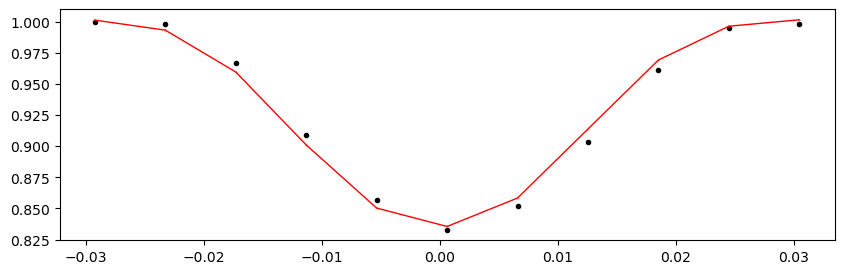

55316.435739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.79it/s]


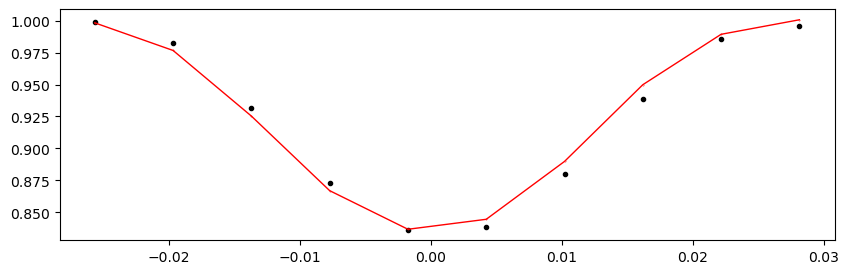

55319.856339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.18it/s]


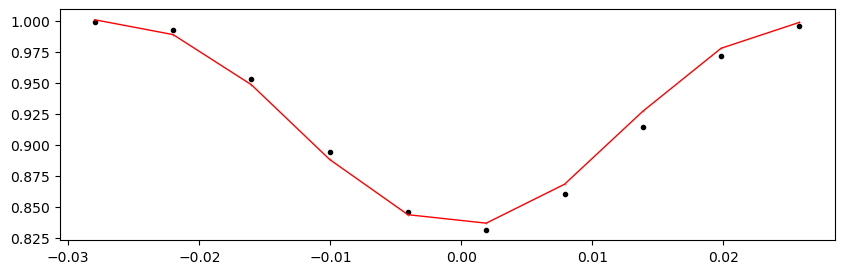

55323.276939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.79it/s]


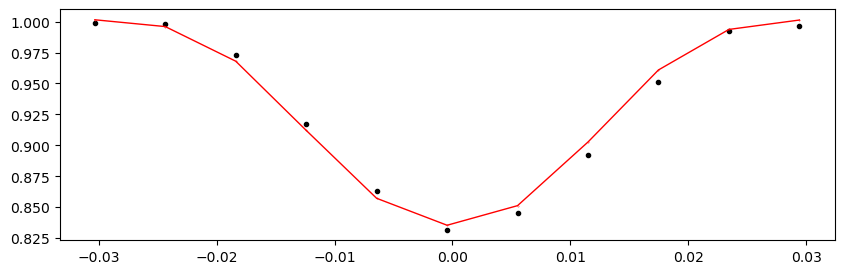

55326.697539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.94it/s]


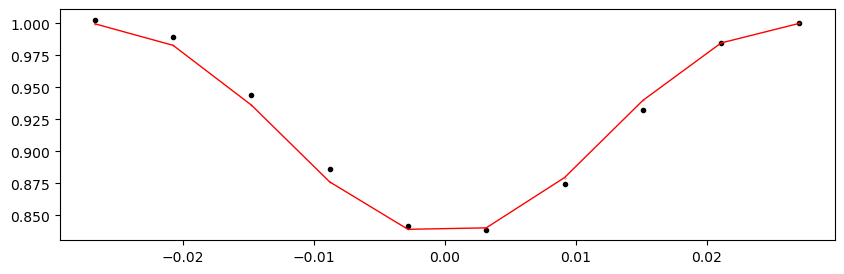

55330.118139000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.24it/s]


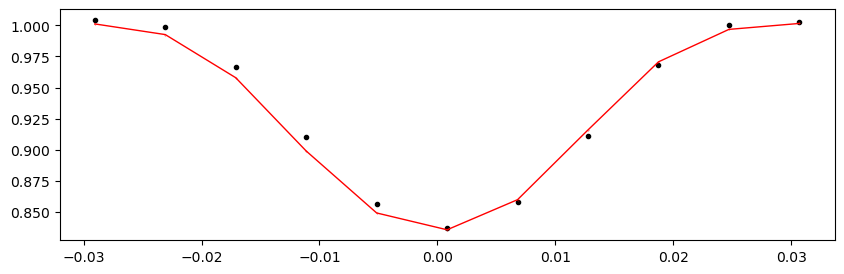

55333.538739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.60it/s]


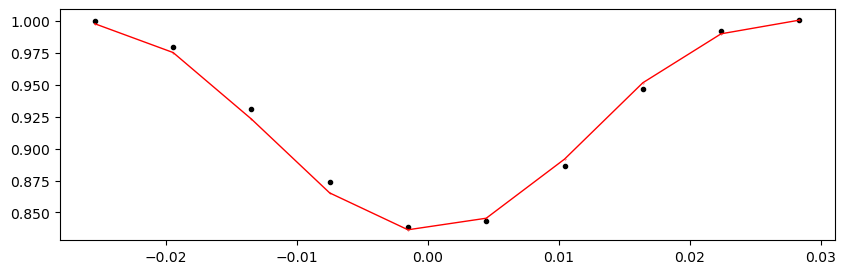

55340.379939000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.61it/s]


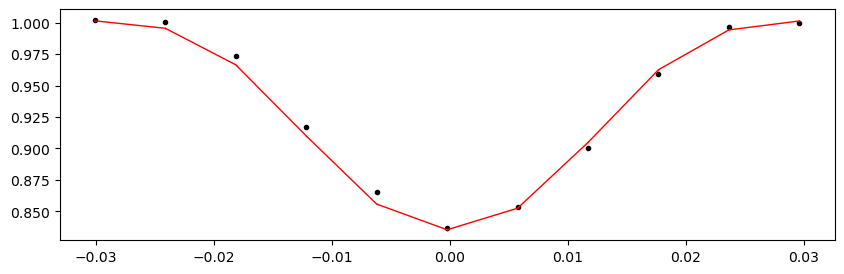

55343.800539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.74it/s]


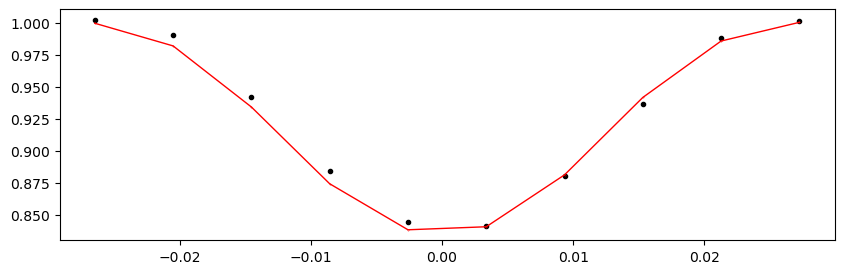

55347.221139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.62it/s]


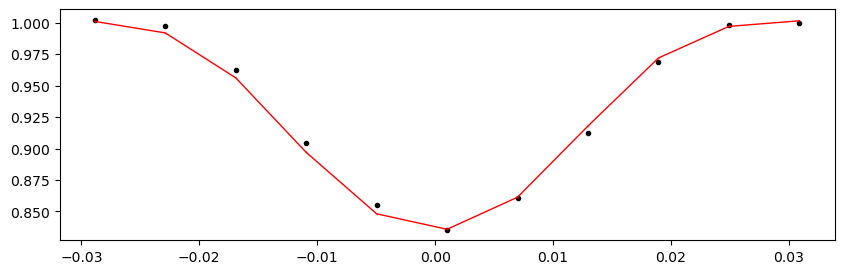

55350.641739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.64it/s]


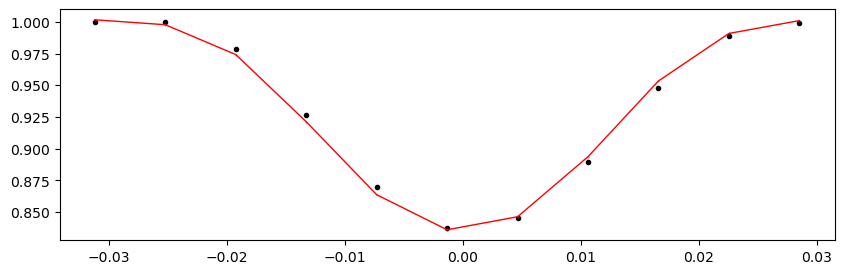

55354.062339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.68it/s]


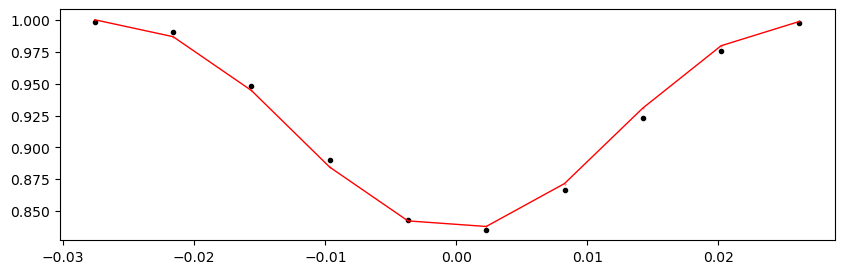

55357.482939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.74it/s]


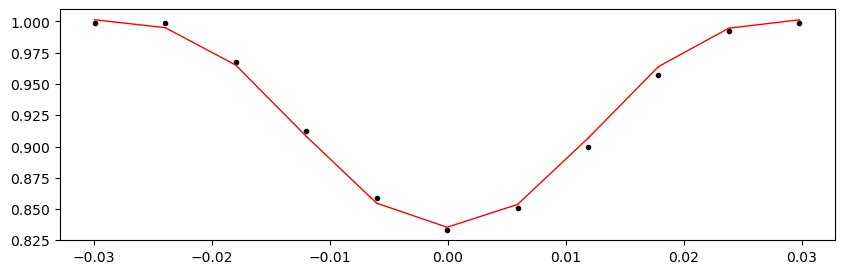

55360.903539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.30it/s]


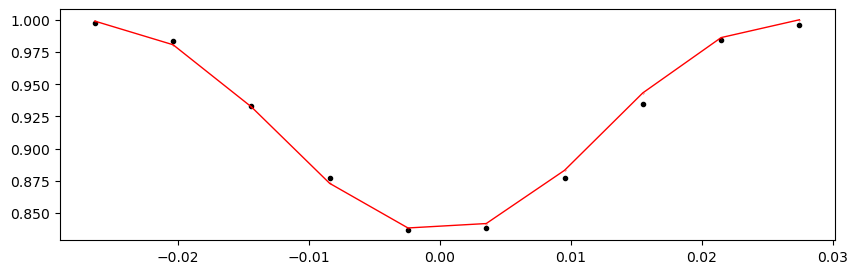

55364.324139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.43it/s]


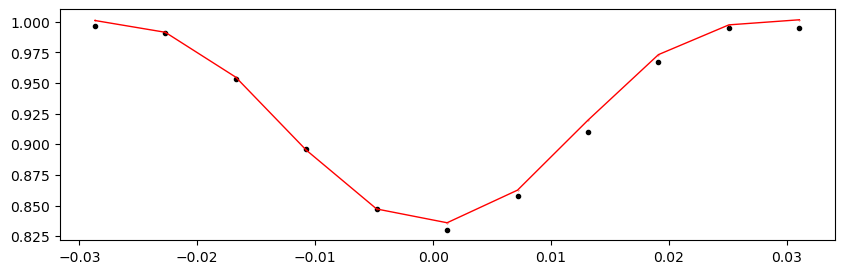

55367.744739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.74it/s]


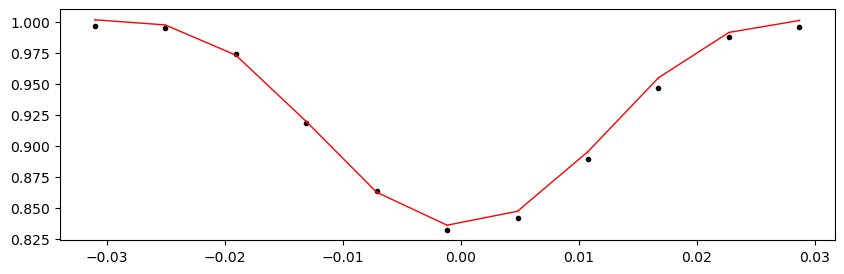

55374.585939000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.21it/s]


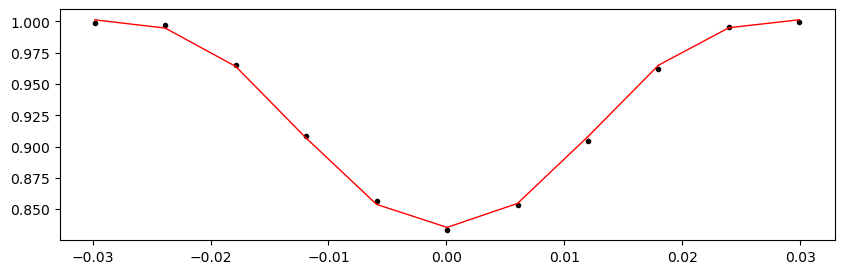

55378.006539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.69it/s]


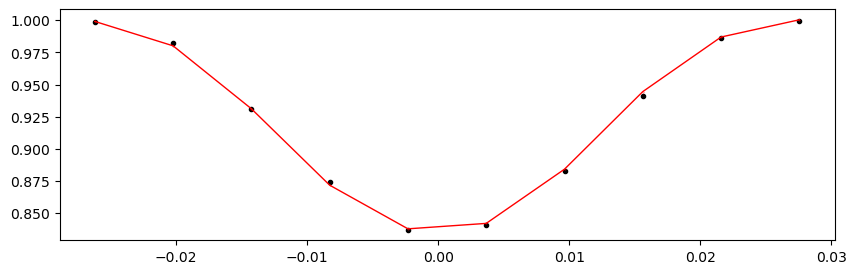

55381.427139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.79it/s]


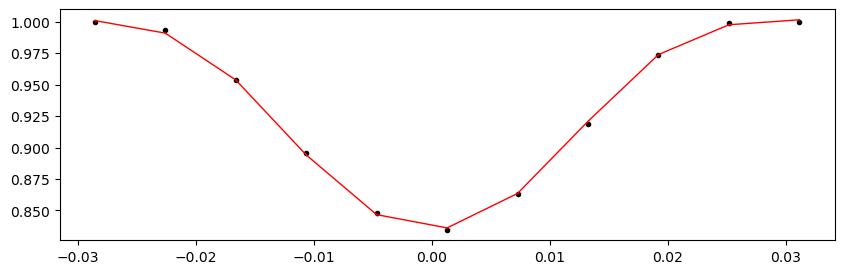

55384.847739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.81it/s]


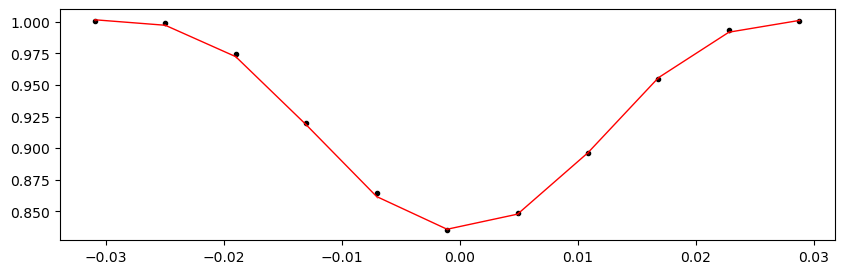

55388.268339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.15it/s]


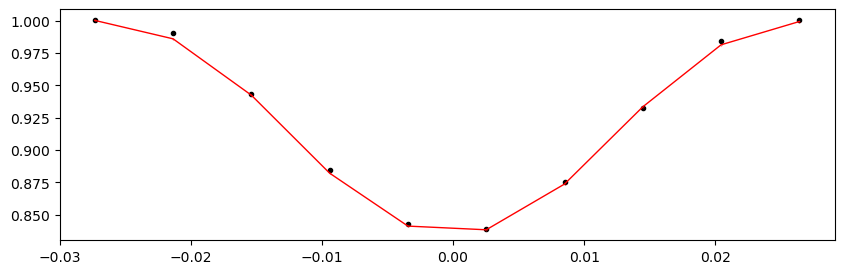

55391.688939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.78it/s]


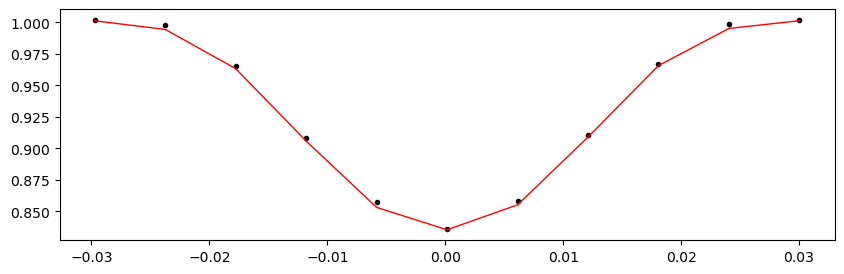

55395.109539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.52it/s]


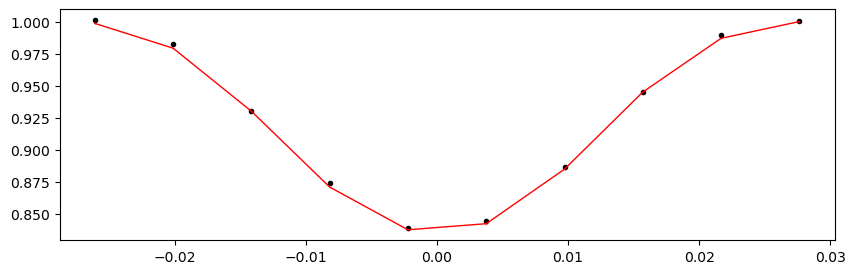

55398.530139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.65it/s]


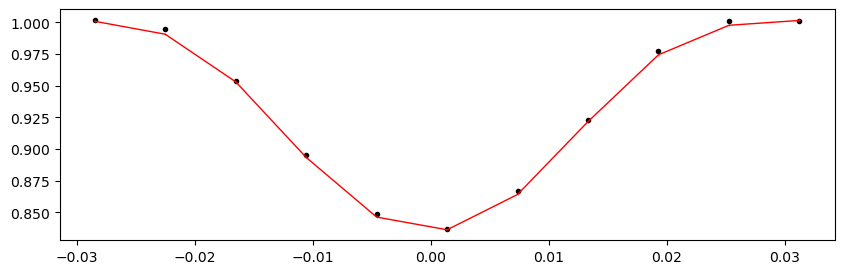

55401.950739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.82it/s]


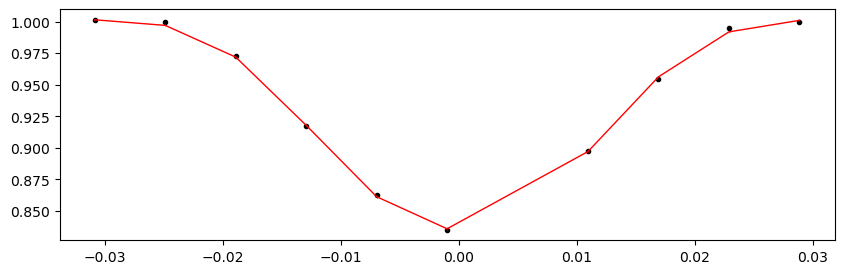

55405.371339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1379.09it/s]


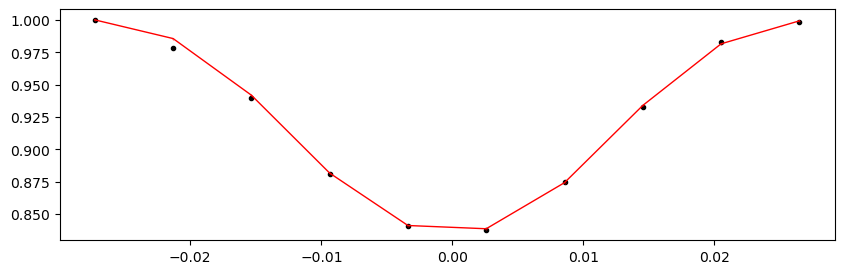

55408.791939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.90it/s]


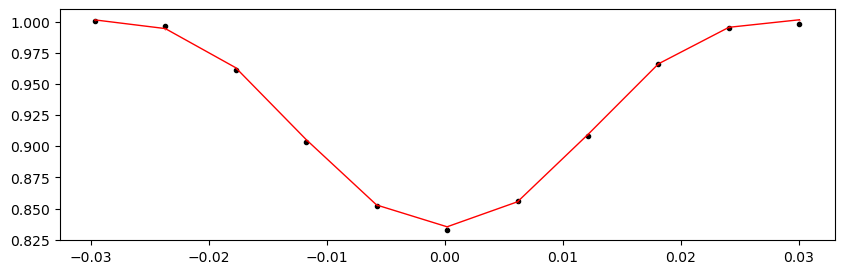

55412.212539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.63it/s]


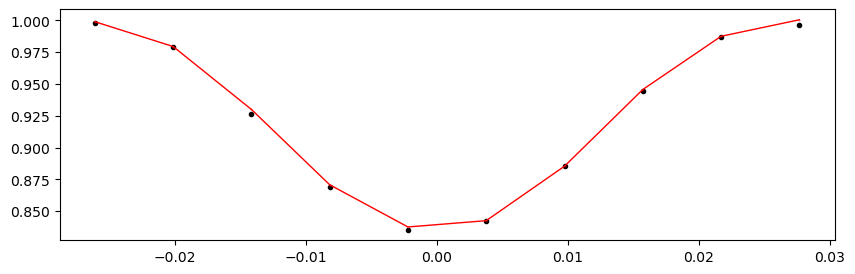

55415.633139000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.34it/s]


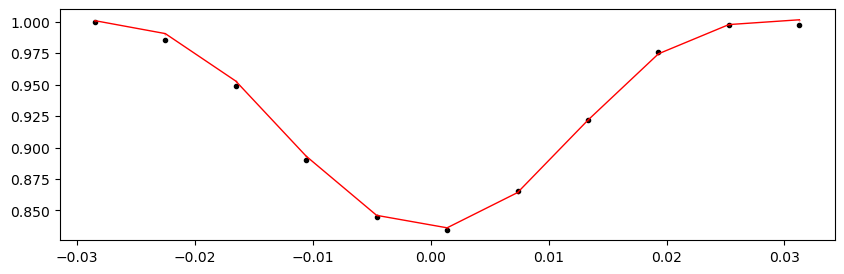

55419.053739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.29it/s]


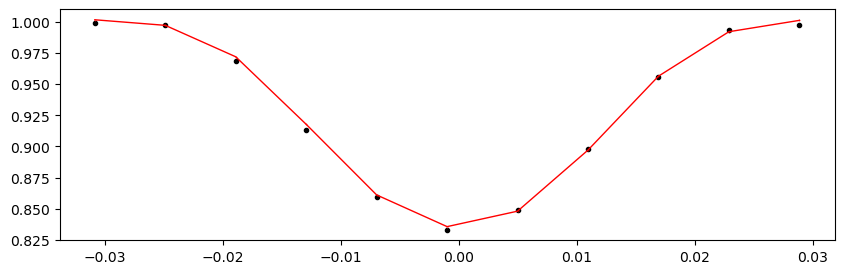

55422.474339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.50it/s]


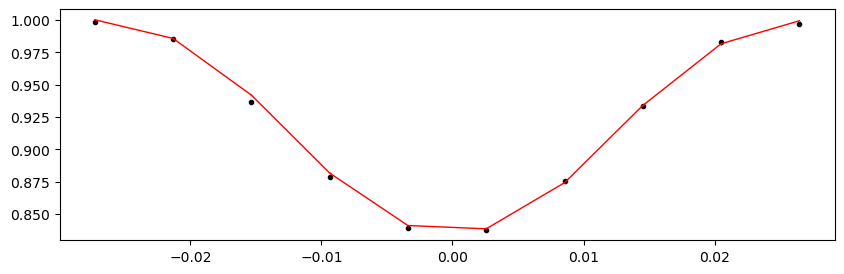

55425.894939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.20it/s]


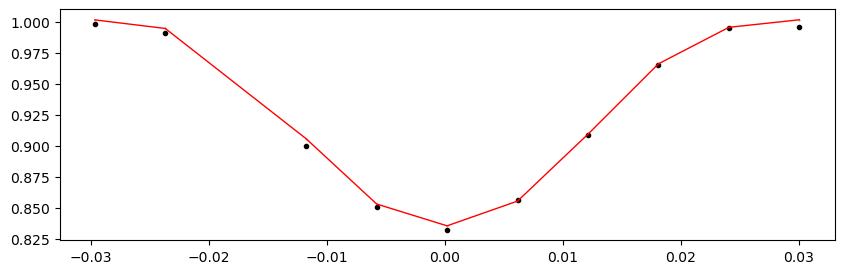

55429.315539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.28it/s]


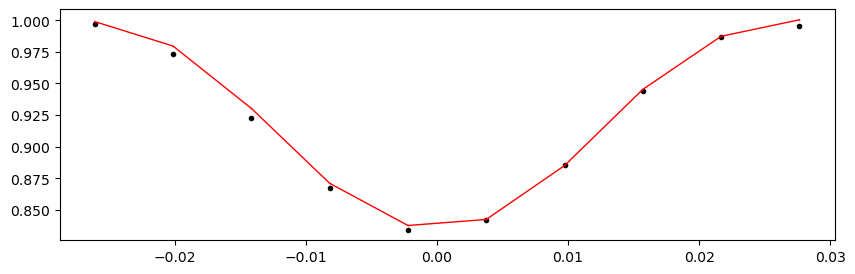

55432.736139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.89it/s]


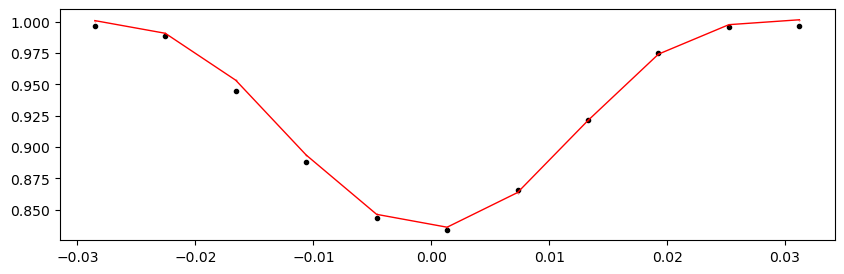

55436.156739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.33it/s]


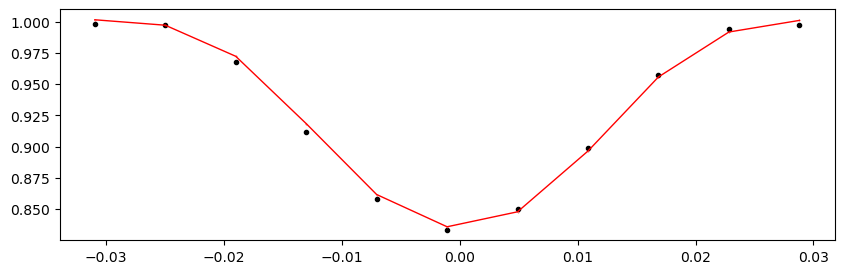

55439.577339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.10it/s]


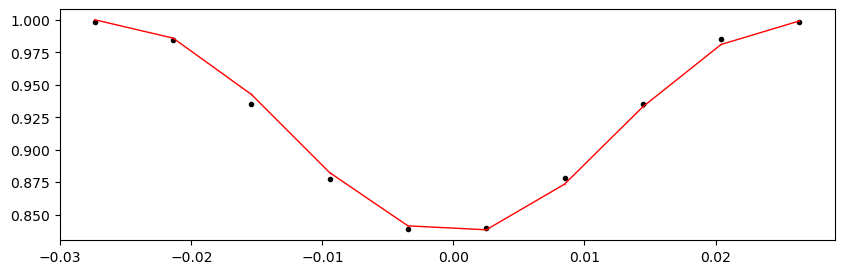

55442.997939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.59it/s]


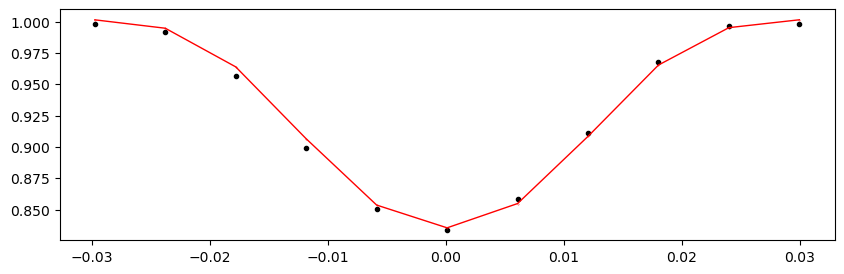

55446.418539000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.14it/s]


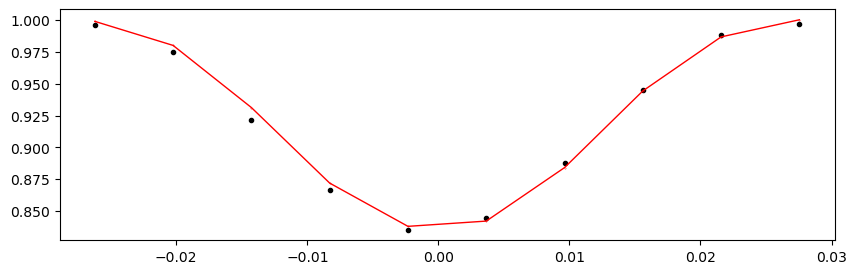

55449.839139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.73it/s]


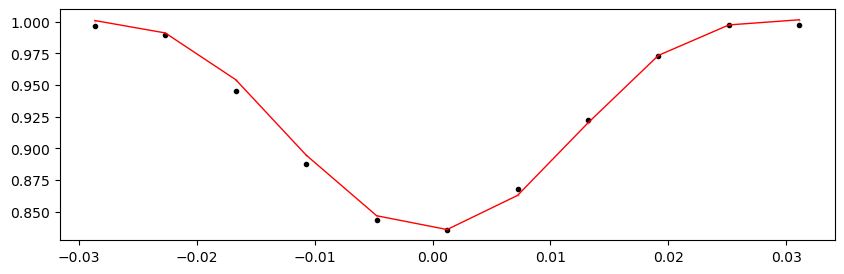

55453.259739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.42it/s]


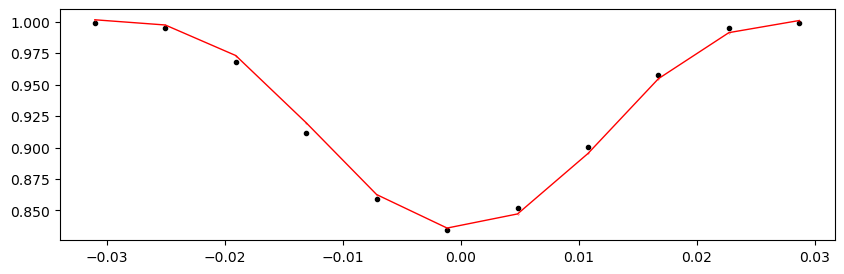

55456.680339000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.55it/s]


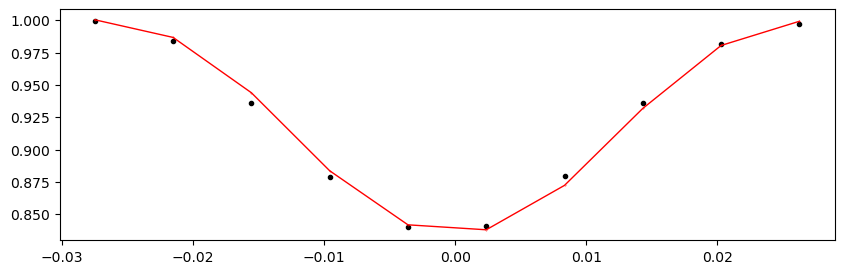

55460.100939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.65it/s]


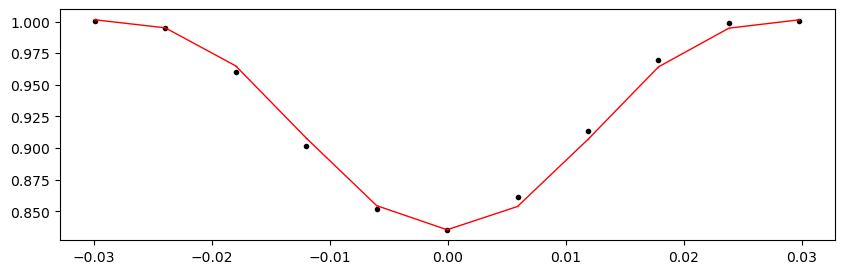

55463.521539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.71it/s]


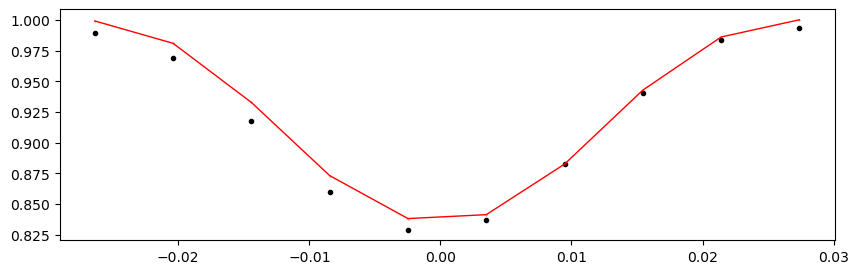

55466.942139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.65it/s]


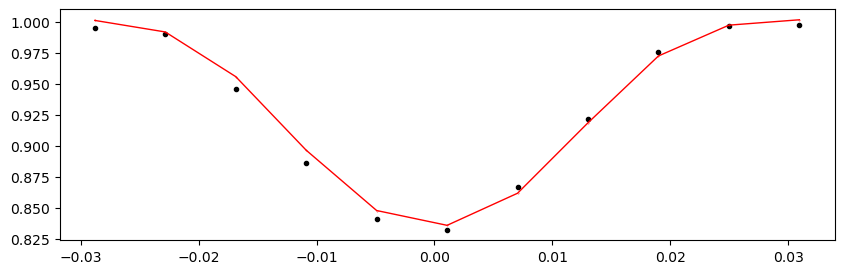

55470.362739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.61it/s]


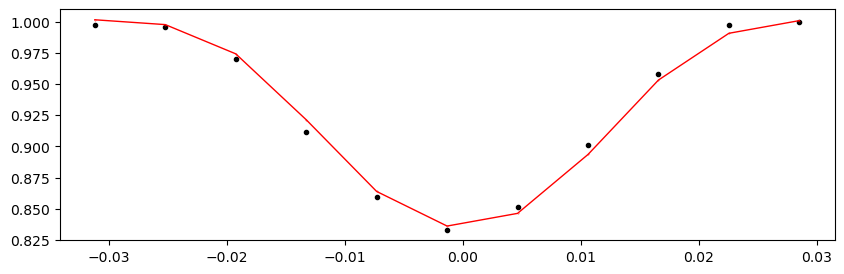

Time 55473.783339 does not have enough data points: 9
55477.203939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.19it/s]


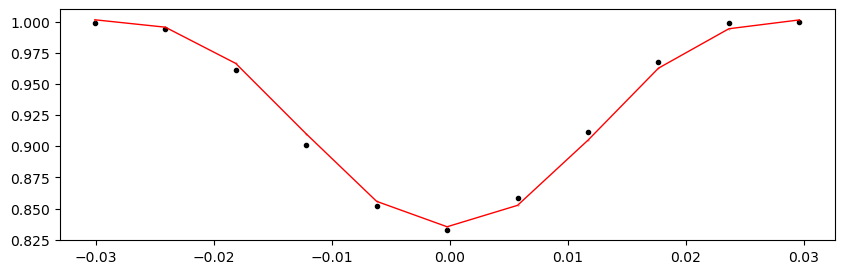

55480.624539000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.17it/s]


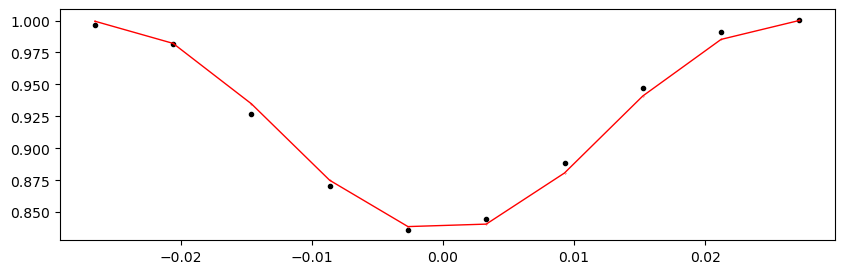

55484.045139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.56it/s]


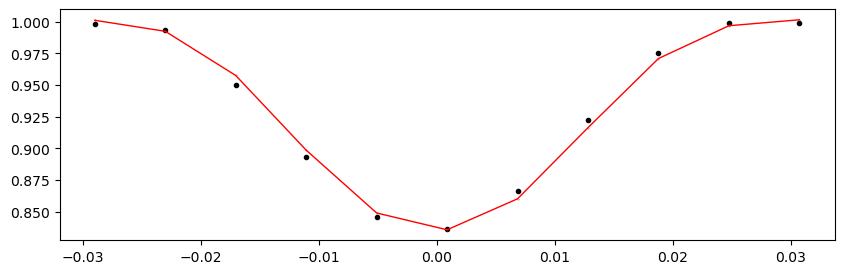

Time 55487.465739 does not have enough data points: 9
55490.886339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.39it/s]


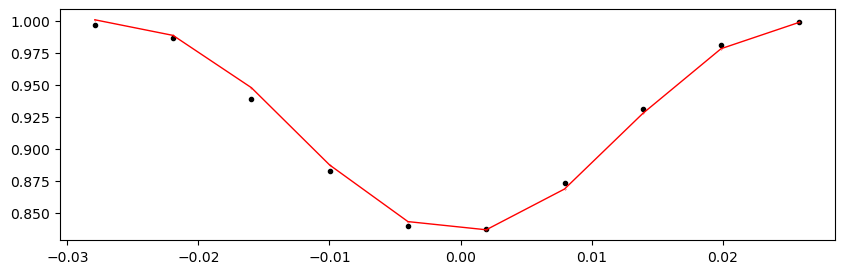

55494.306939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.13it/s]


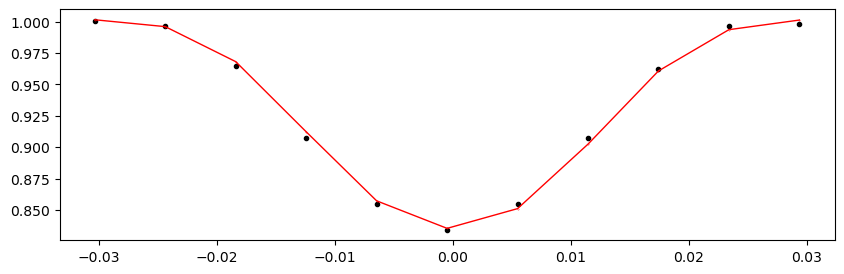

55497.727539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.78it/s]


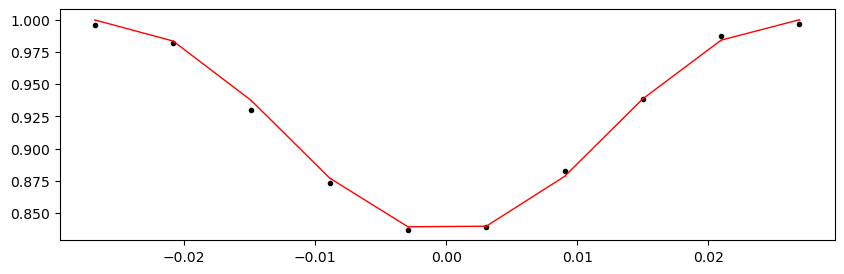

55501.148139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.93it/s]


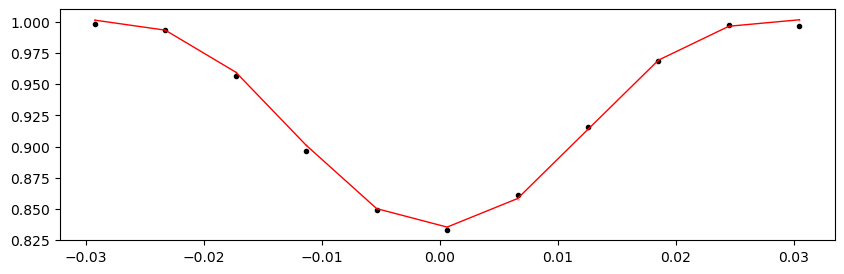

Time 55504.568739 does not have enough data points: 9
55507.989339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.74it/s]


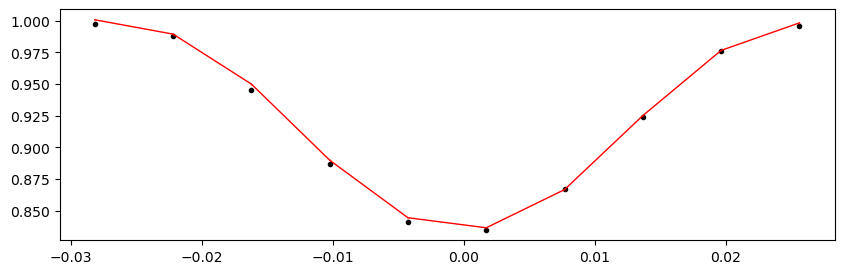

55511.409939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.43it/s]


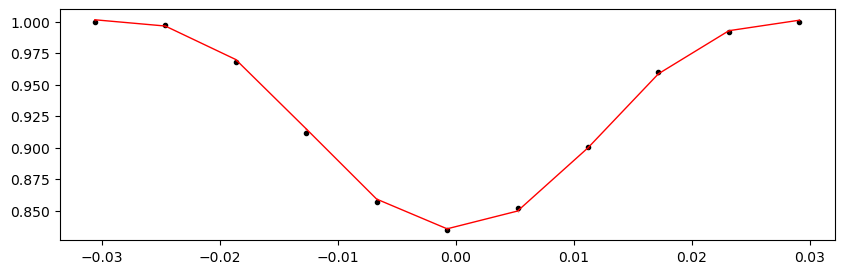

55514.830539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.23it/s]


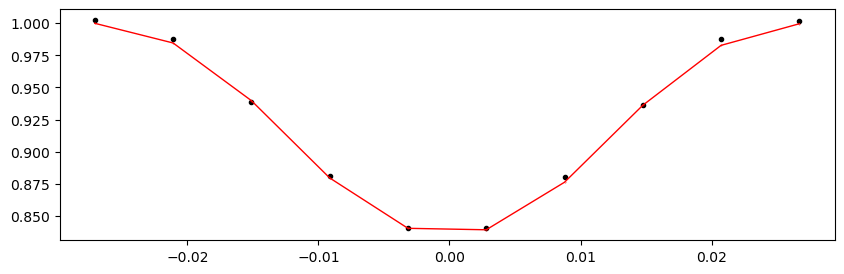

55518.251139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.64it/s]


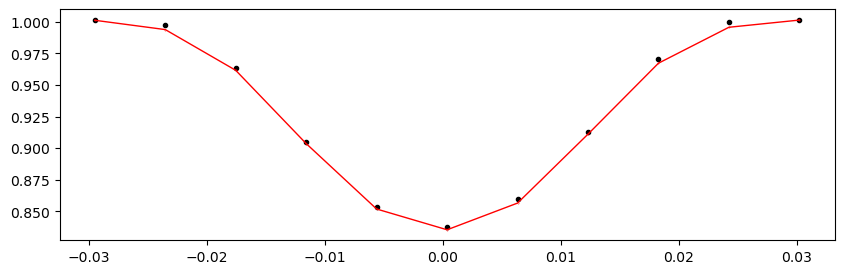

55521.671739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.69it/s]


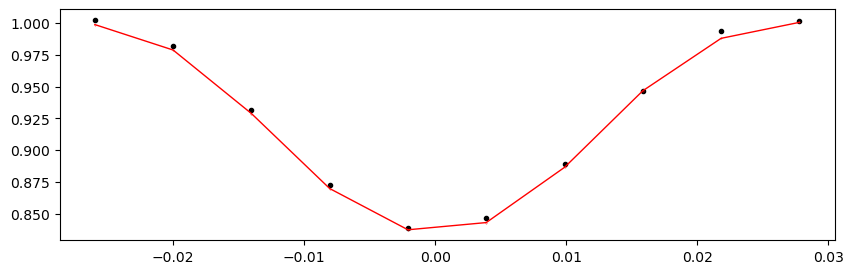

55525.092339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.32it/s]


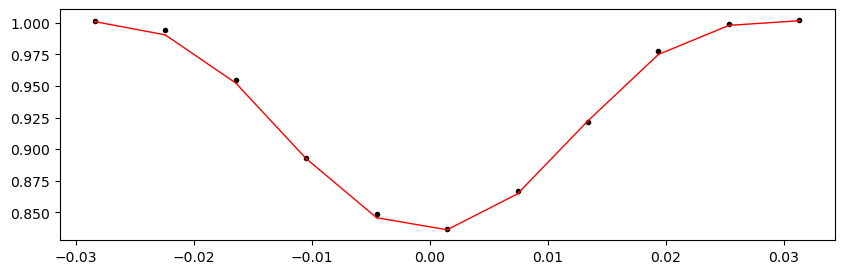

55528.512939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1314.95it/s]


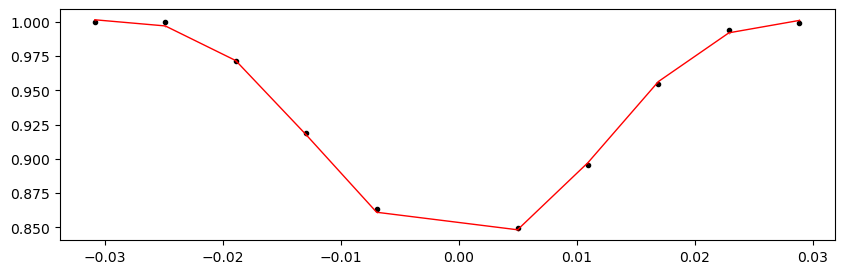

55531.933539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.75it/s]


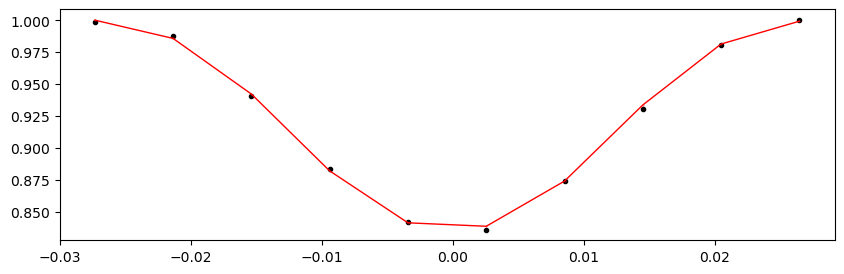

55535.354139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.92it/s]


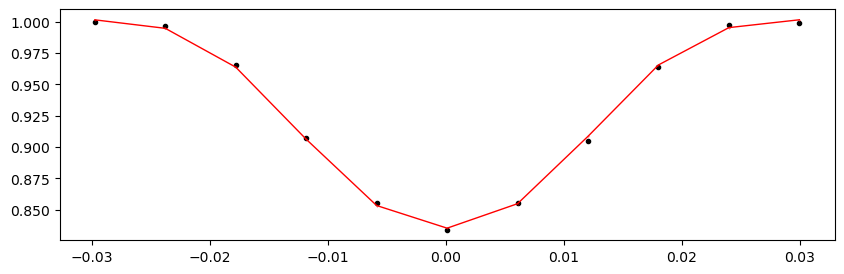

55538.774739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.48it/s]


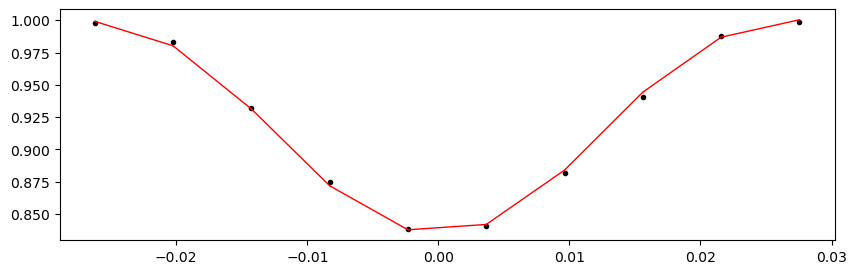

55542.195339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.22it/s]


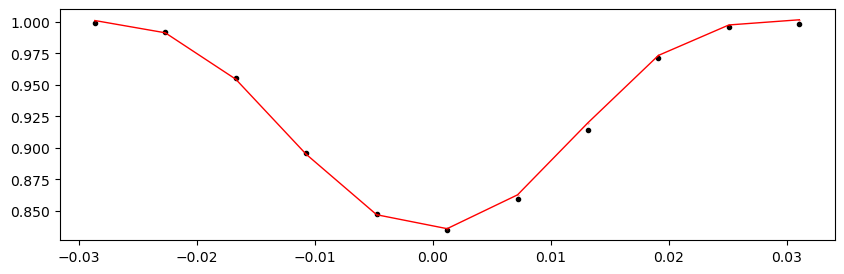

55545.615939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.79it/s]


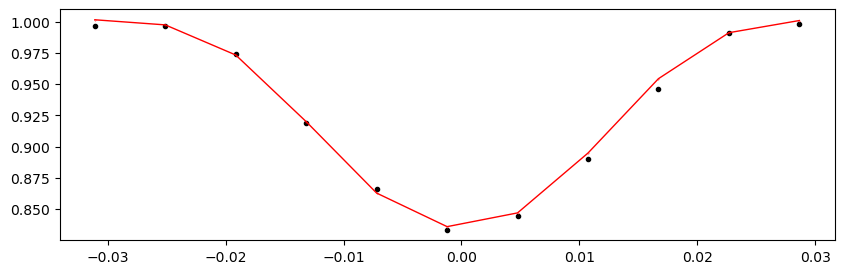

55549.036539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.98it/s]


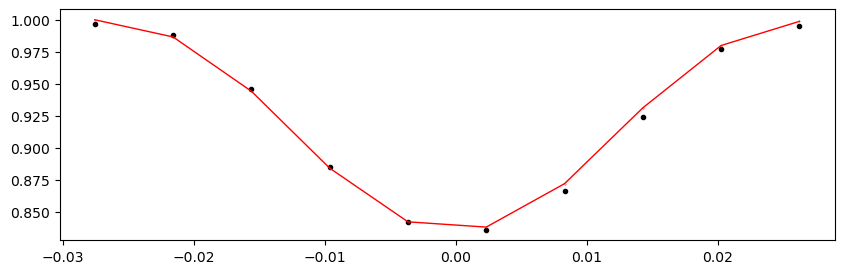

55569.560139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.77it/s]


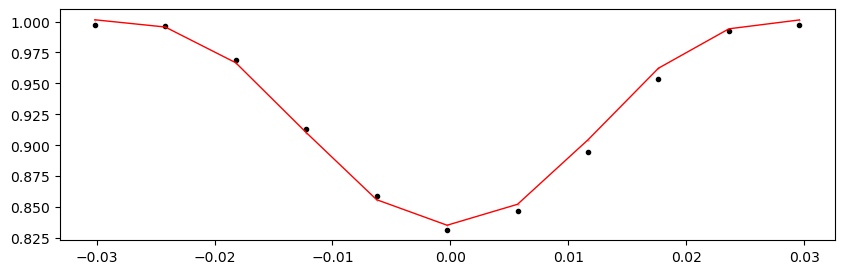

Time 55572.980739000006 does not have enough data points: 9
55576.401339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.86it/s]


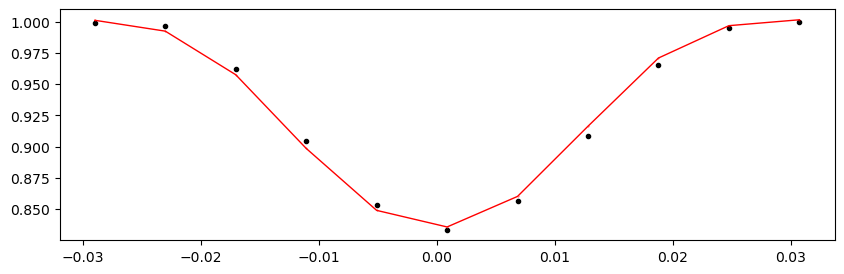

55579.821939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.68it/s]


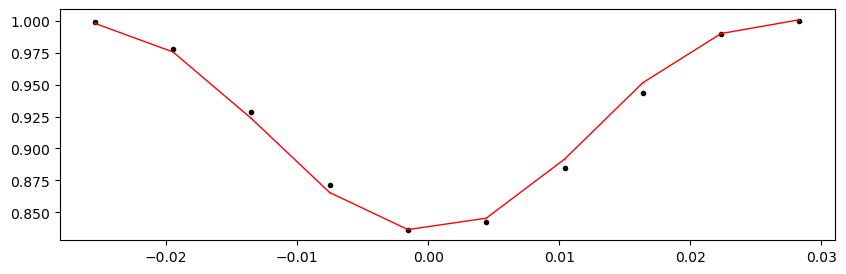

55583.242539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.12it/s]


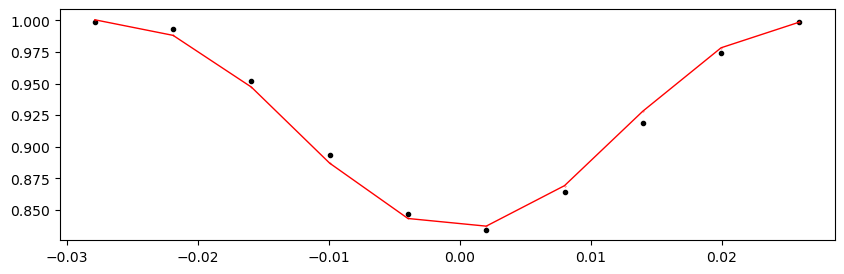

55586.663139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.81it/s]


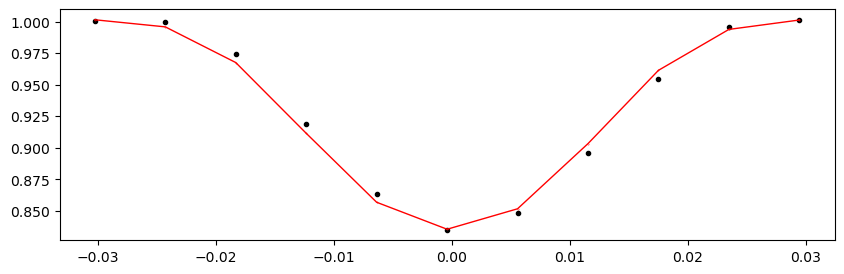

55590.083739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.76it/s]


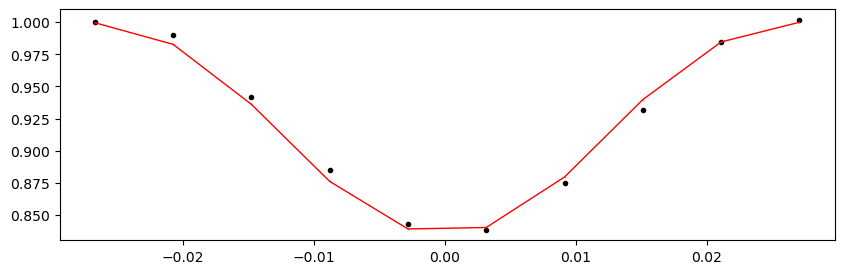

Time 55593.504339 does not have enough data points: 8
55596.924939000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.40it/s]


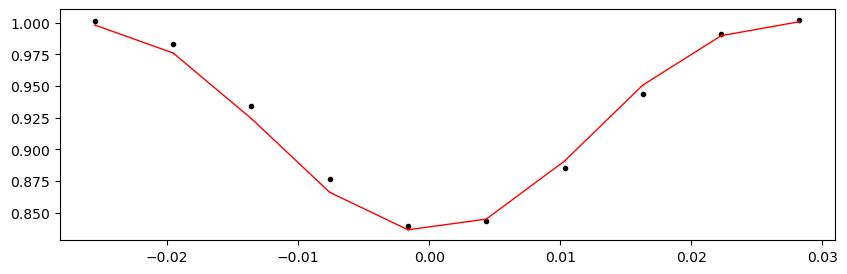

55600.345539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.58it/s]


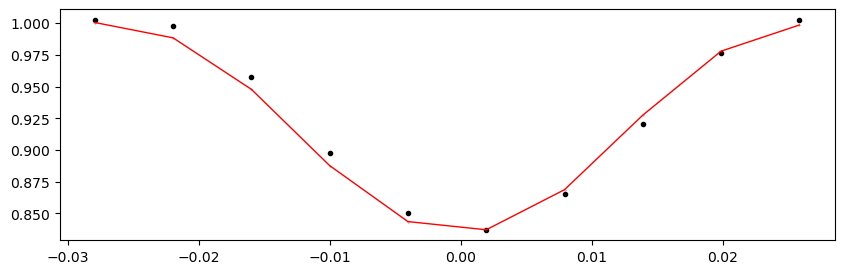

55603.766139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.30it/s]


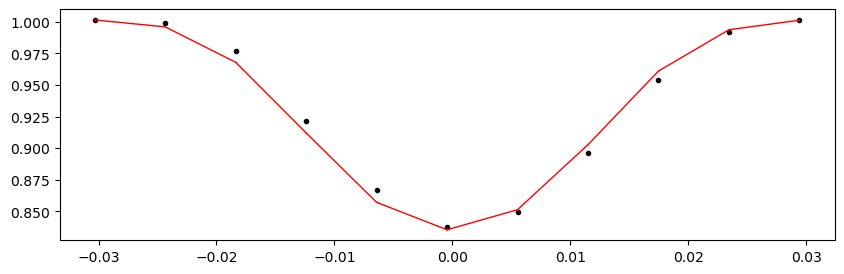

55607.186739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.23it/s]


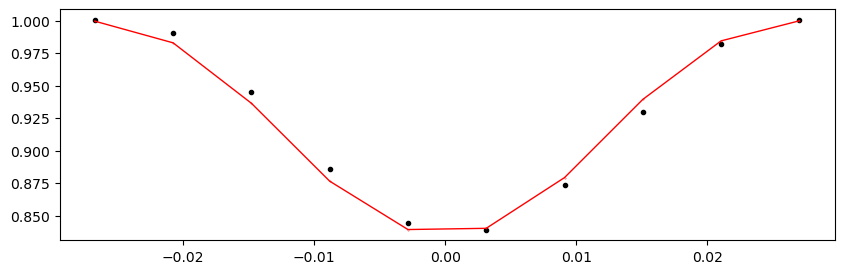

55610.607339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.42it/s]


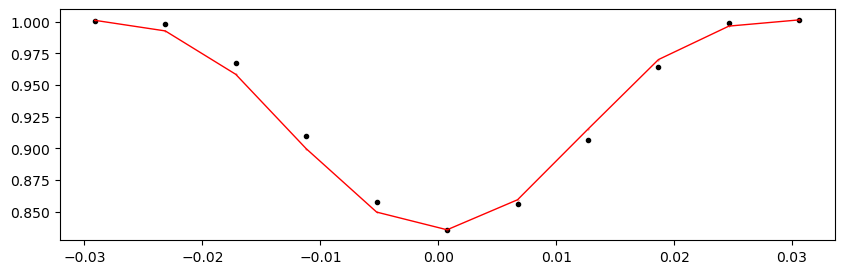

55614.027939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.02it/s]


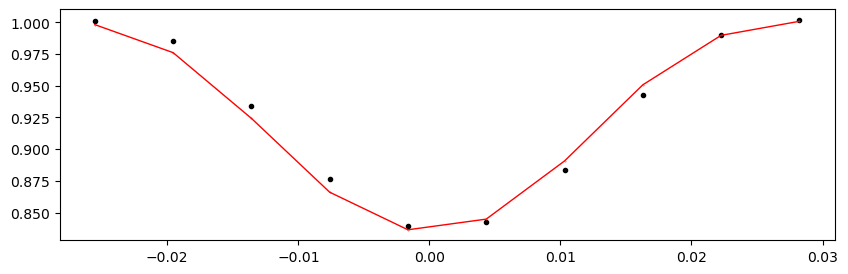

55617.448539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.35it/s]


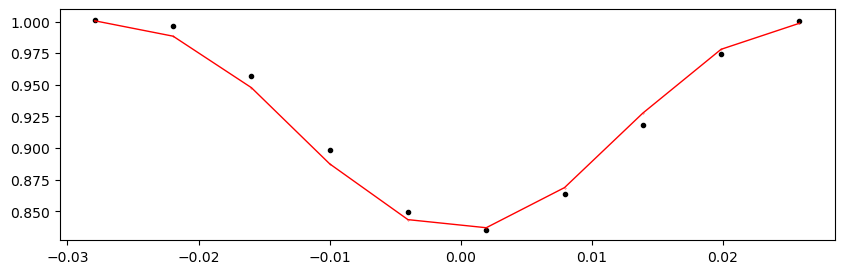

55620.869139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.98it/s]


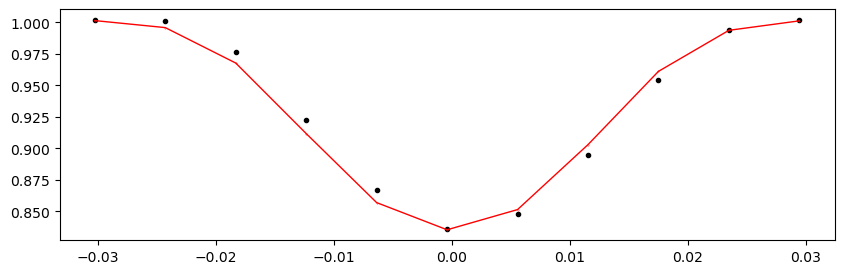

Time 55624.289739 does not have enough data points: 9
55627.710339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.38it/s]


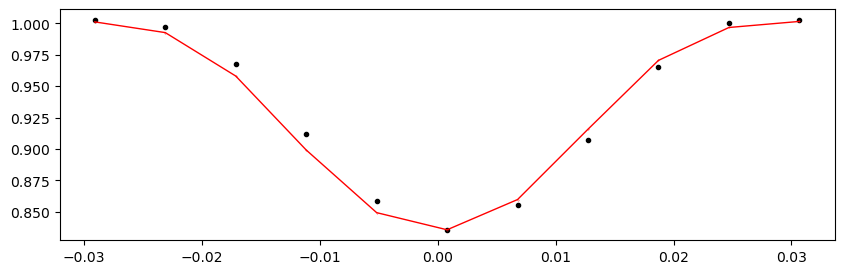

Time 55631.130939 does not have enough data points: 8
55634.551539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.52it/s]


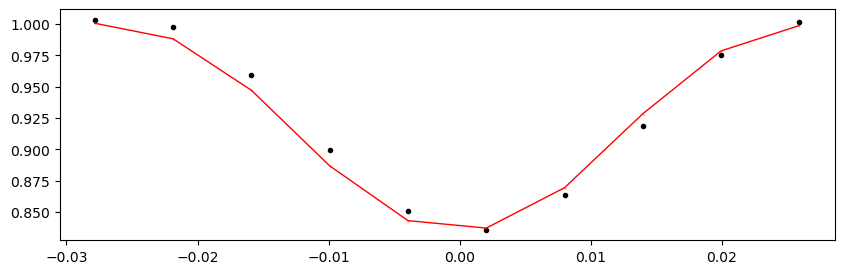

55641.392739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.68it/s]


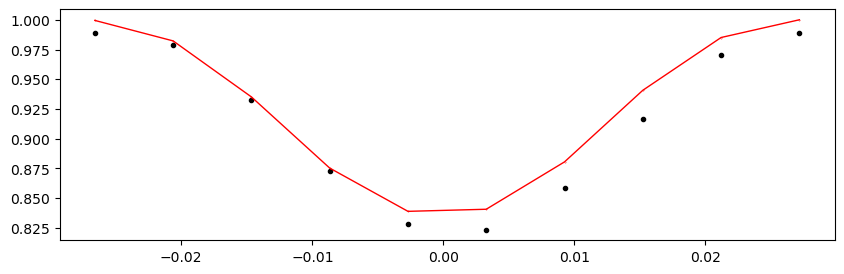

55644.813339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.20it/s]


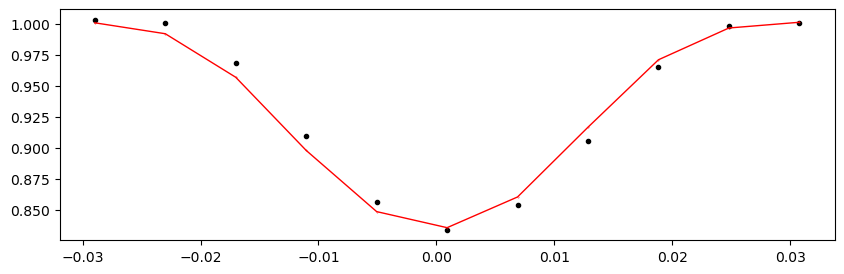

55648.233939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.71it/s]


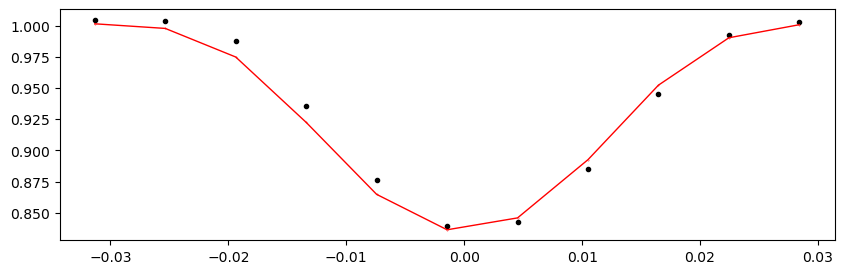

Time 55651.654539 does not have enough data points: 9
55655.075139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.24it/s]


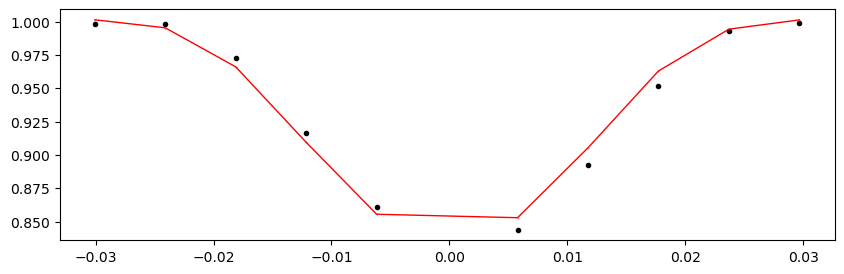

55658.495739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.45it/s]


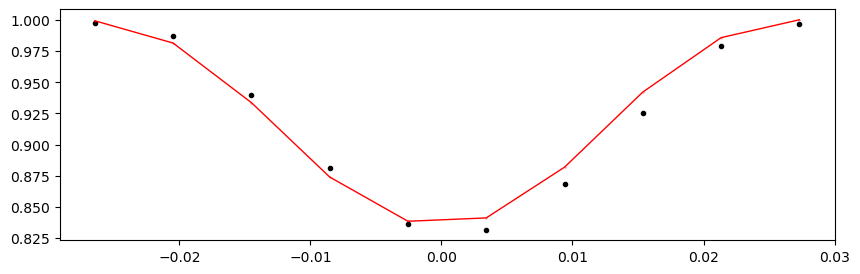

55661.916339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.16it/s]


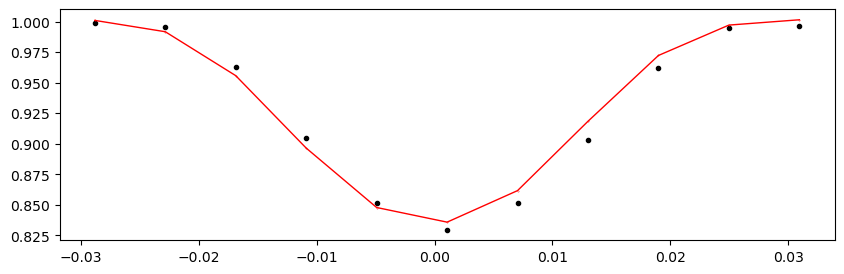

55665.336939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.25it/s]


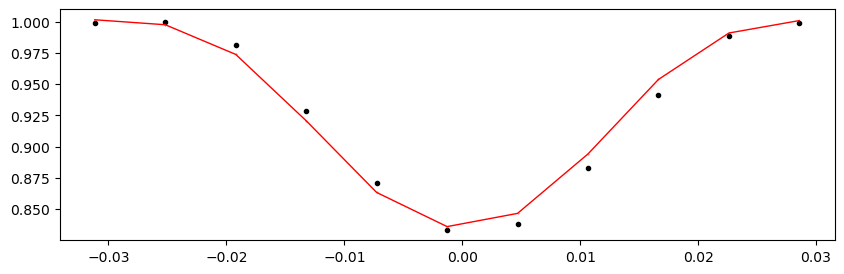

55668.757539000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.04it/s]


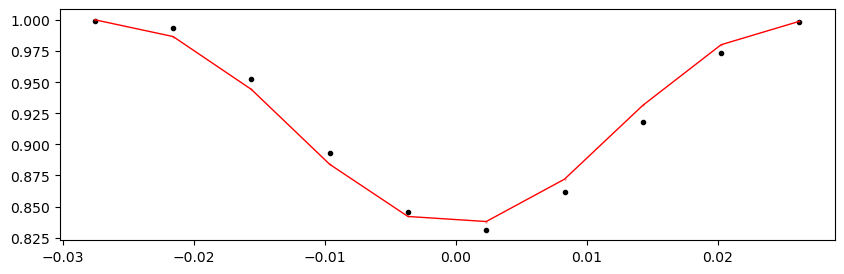

55672.178139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.98it/s]


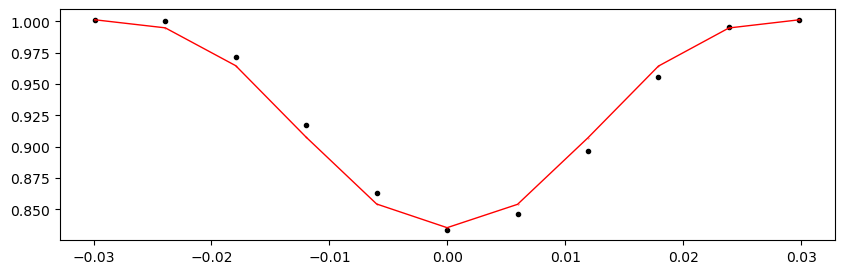

55675.598739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.95it/s]


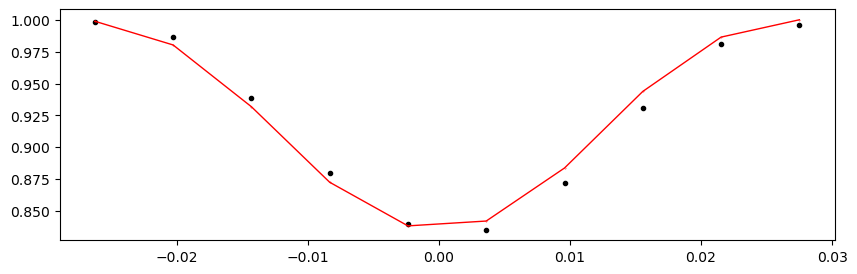

55679.019339000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.57it/s]


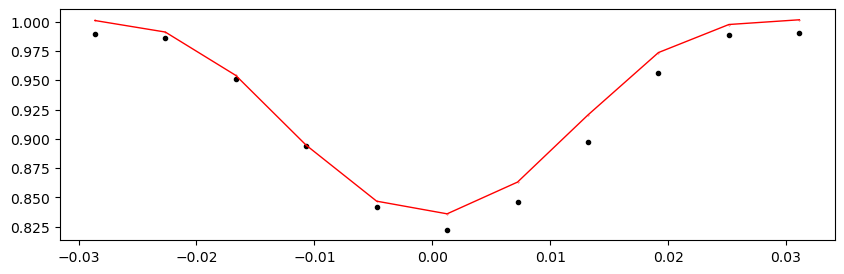

55682.439939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.13it/s]


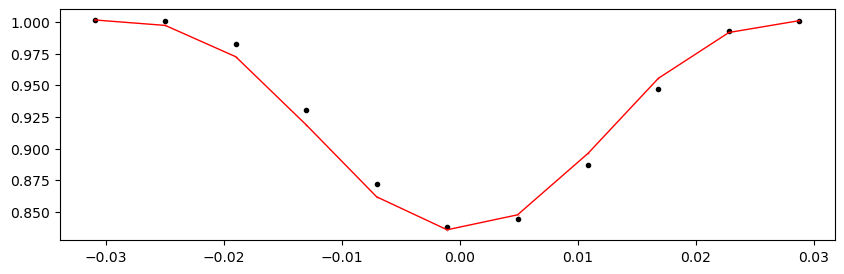

55685.860539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.94it/s]


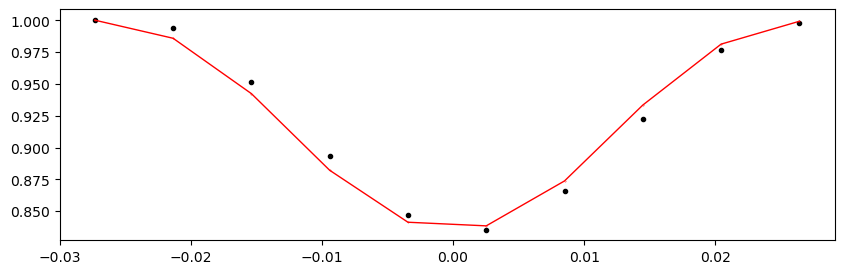

55689.281139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.93it/s]


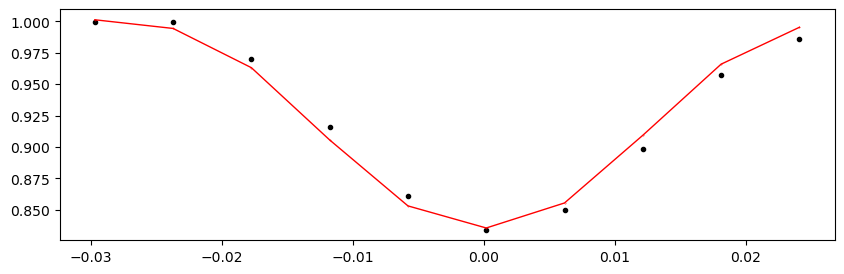

55692.701739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.27it/s]


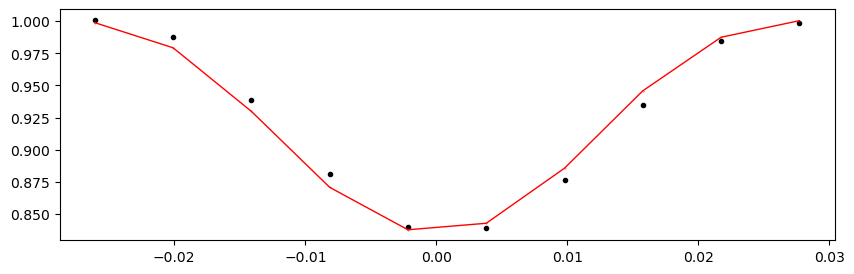

55696.122339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.02it/s]


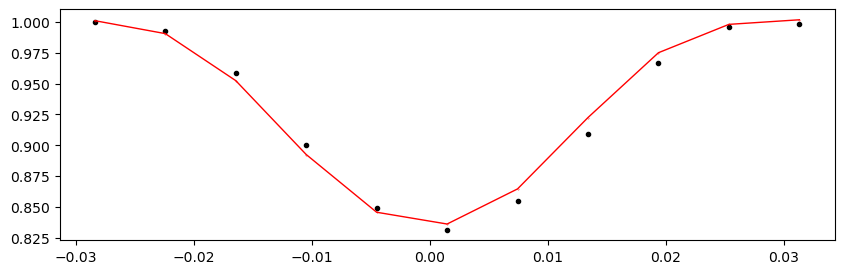

55699.542939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.80it/s]


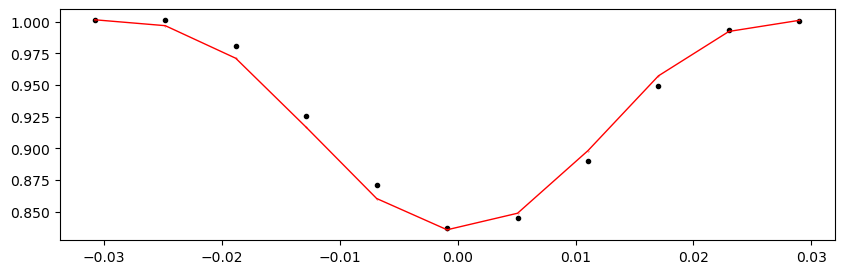

55702.963539000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.94it/s]


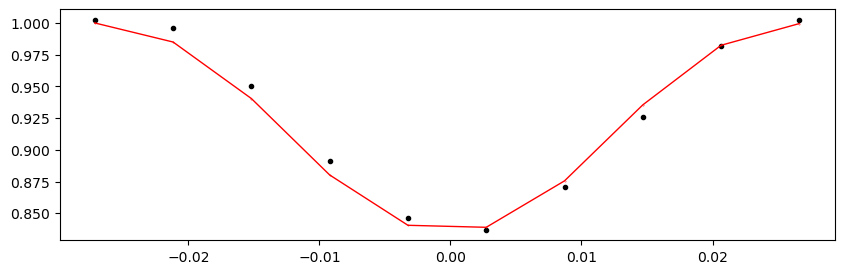

55706.384139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.46it/s]


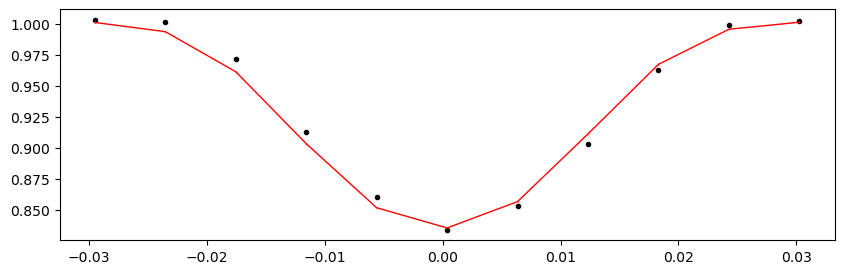

55709.804739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.85it/s]


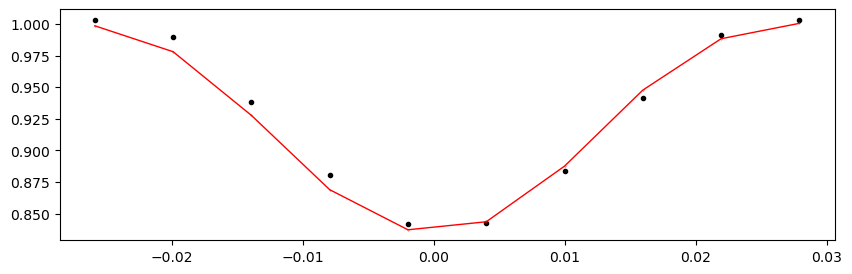

55713.225339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.60it/s]


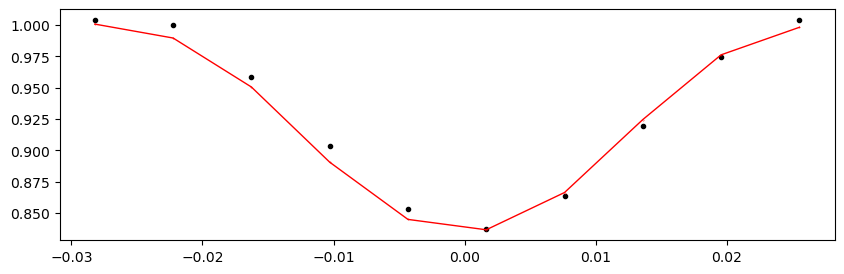

55716.645939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.39it/s]


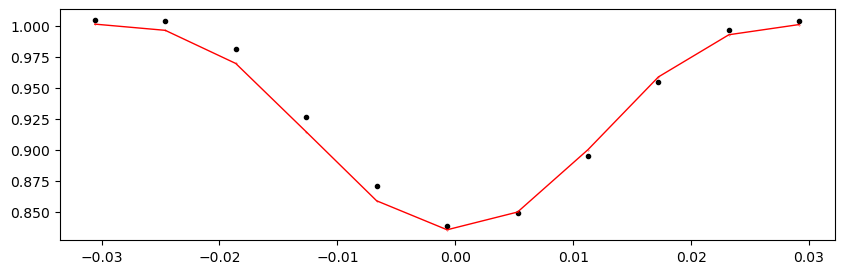

Time 55720.066539 does not have enough data points: 5
55723.487139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.21it/s]


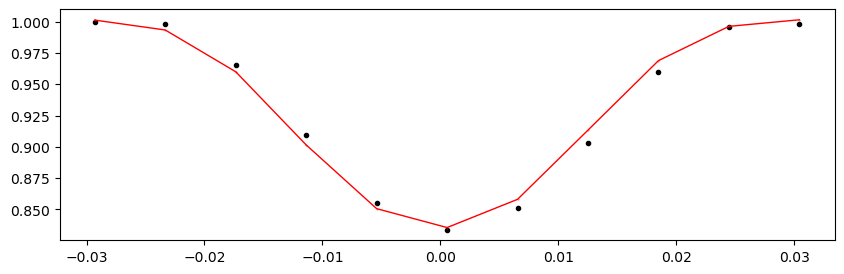

55726.907739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.37it/s]


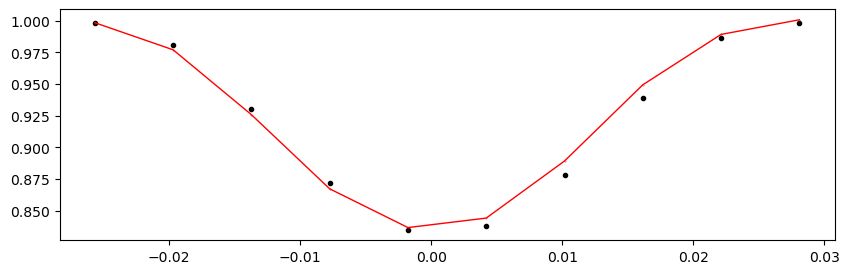

Time 55730.328339 does not have enough data points: 9
55733.748939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.10it/s]


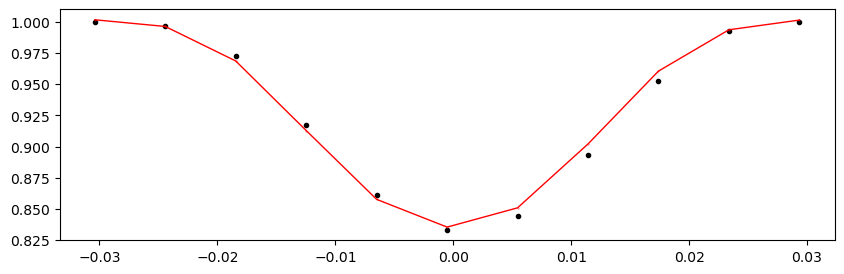

55737.169539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.91it/s]


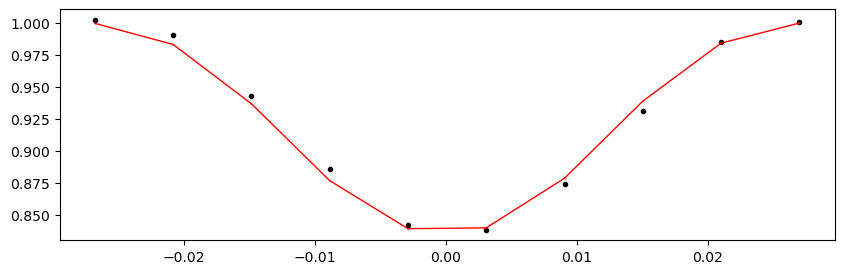

55740.590139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.64it/s]


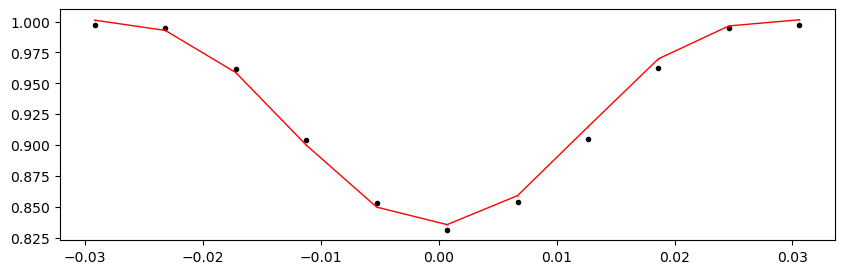

55744.010739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.28it/s]


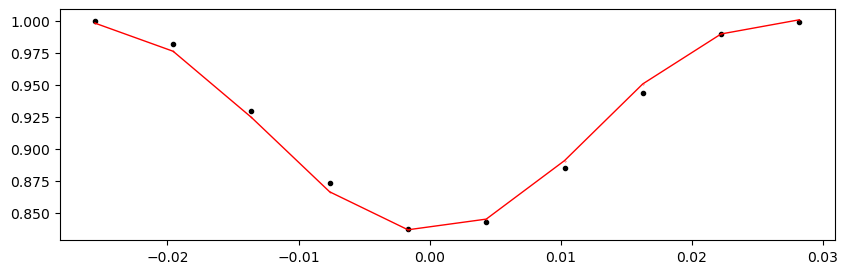

Time 55747.431339 does not have enough data points: 9
55750.851939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.28it/s]


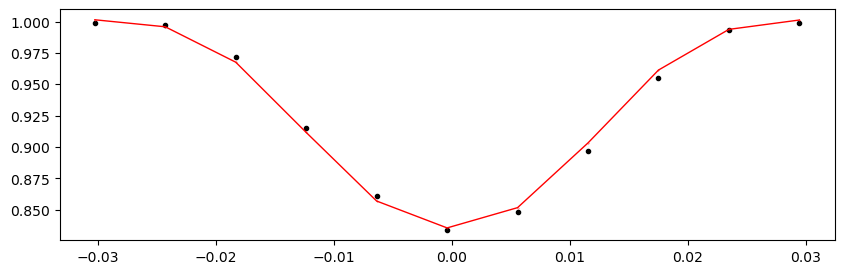

55754.272539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.49it/s]


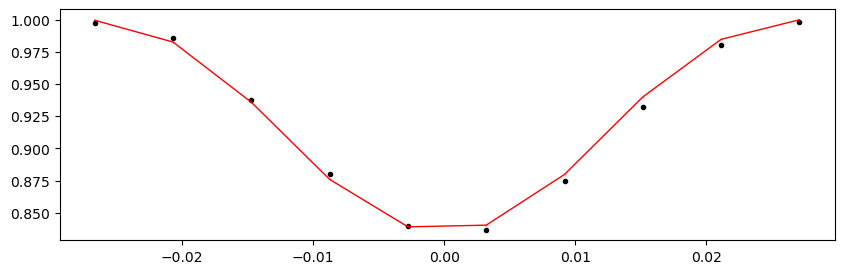

55757.693139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.40it/s]


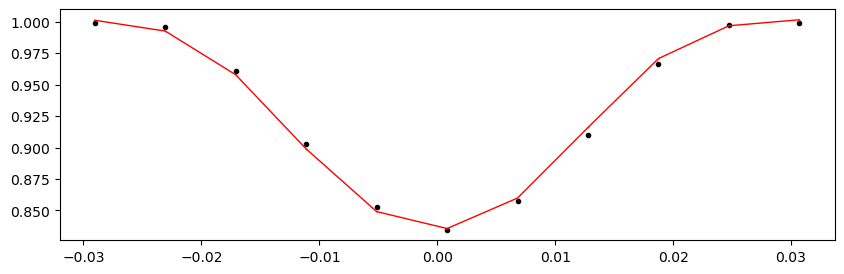

55761.113739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.97it/s]


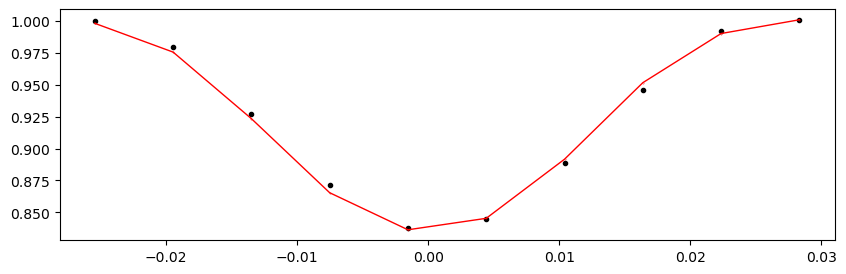

55764.534339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.73it/s]


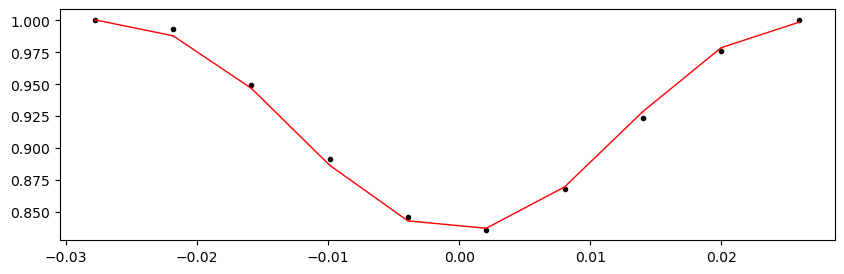

55767.954939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.33it/s]


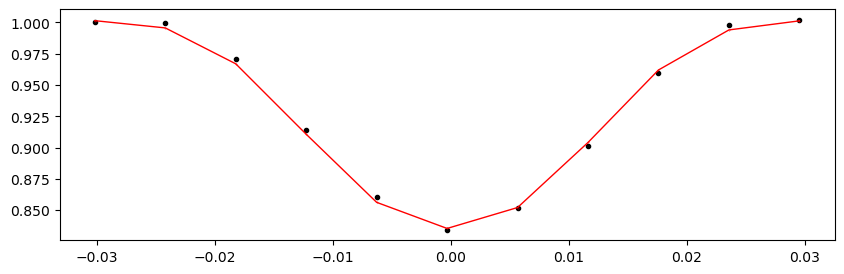

55771.375539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.79it/s]


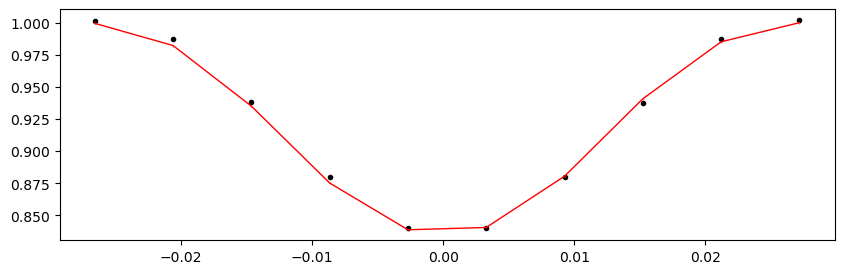

55774.796139000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.09it/s]


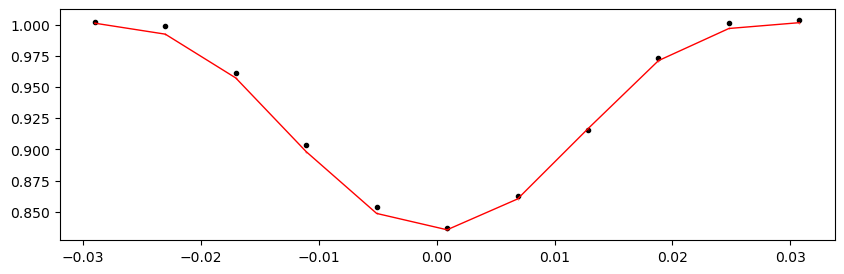

55778.216739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.42it/s]


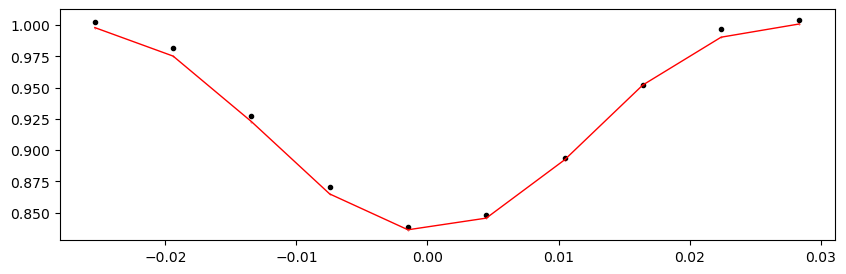

55781.637339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.61it/s]


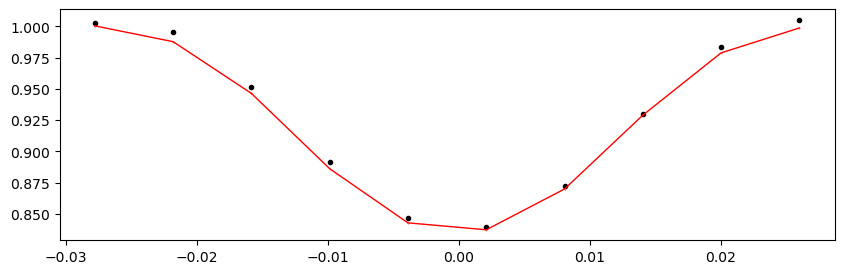

55785.057939000006 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.93it/s]


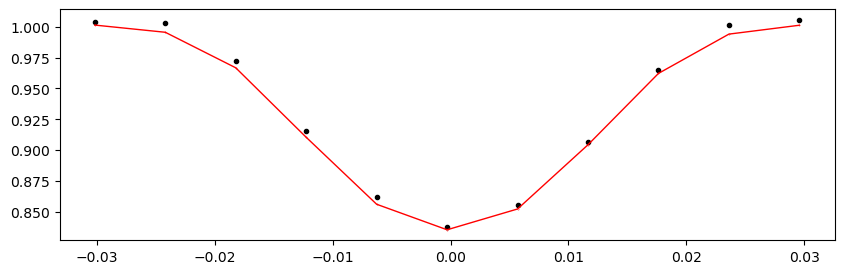

55788.478539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.17it/s]


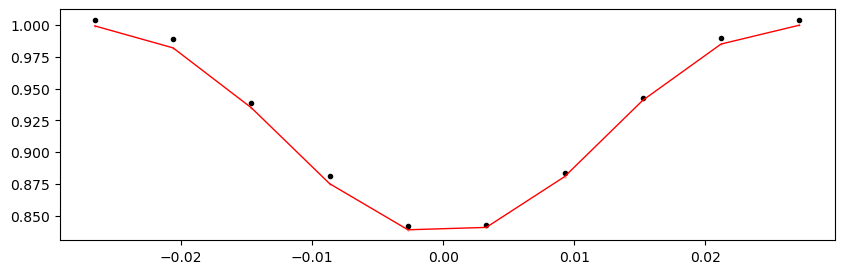

55791.899139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.74it/s]


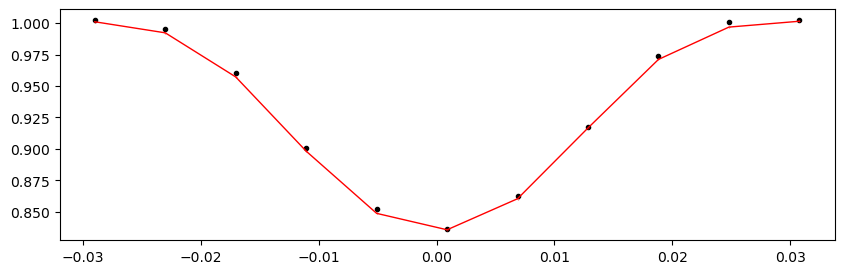

55795.319739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.99it/s]


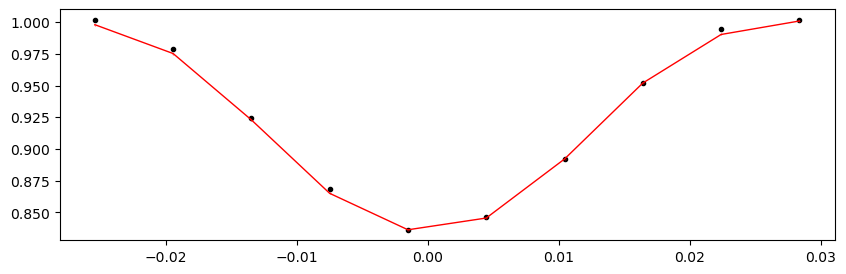

55798.740339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.71it/s]


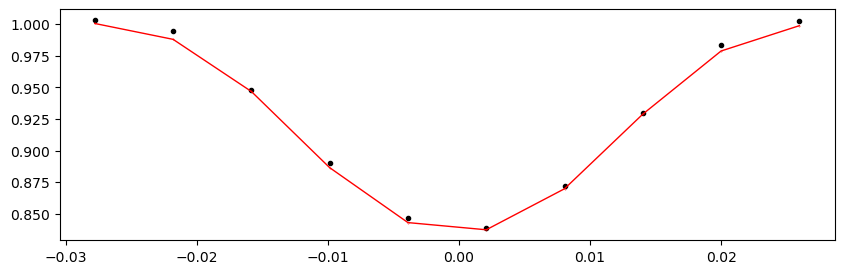

59390.370339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.81it/s]


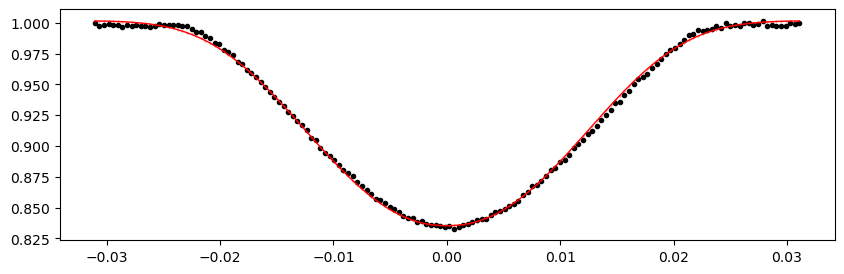

59393.790939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.51it/s]


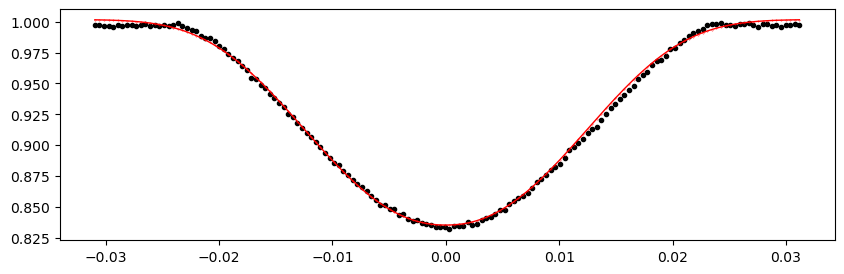

59397.211539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.75it/s]


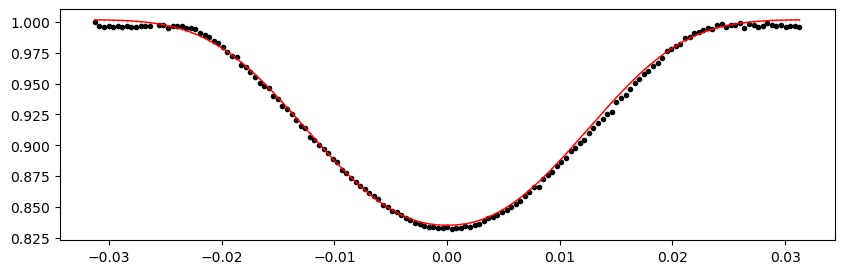

59400.632139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.72it/s]


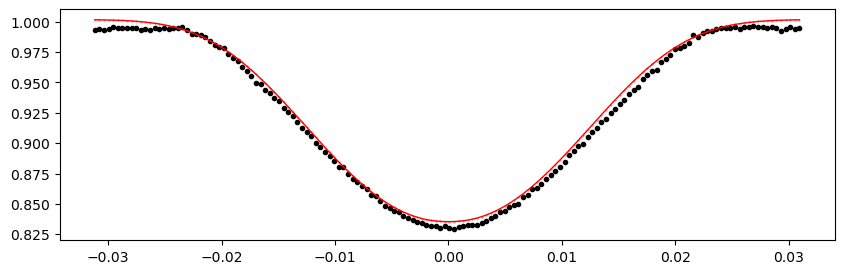

59407.473339000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.31it/s]


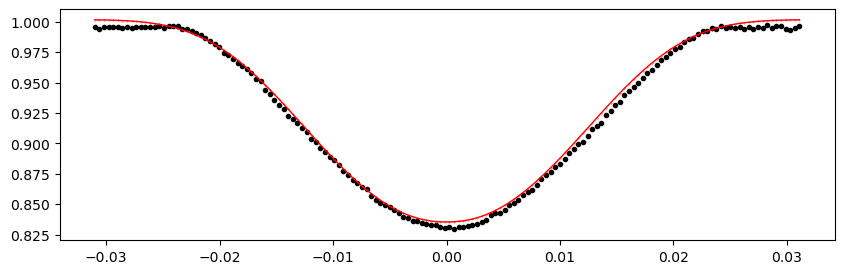

59410.893939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.02it/s]


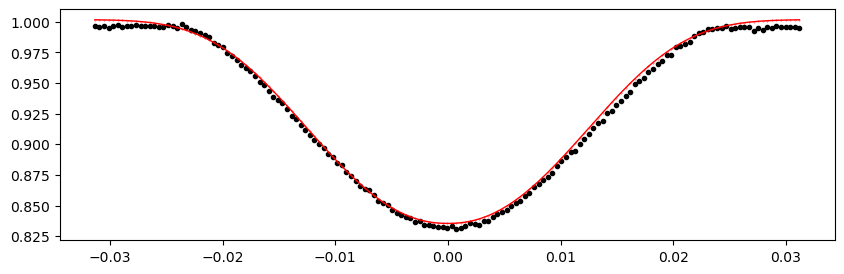

59414.314539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.86it/s]


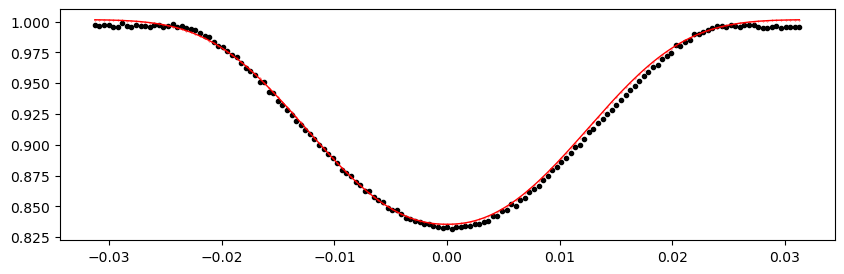

59417.735139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.08it/s]


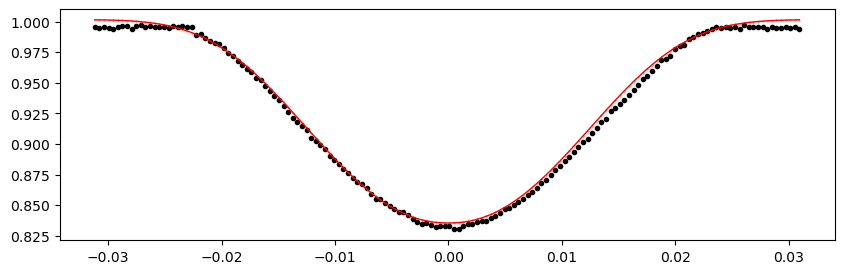

59421.155739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.57it/s]


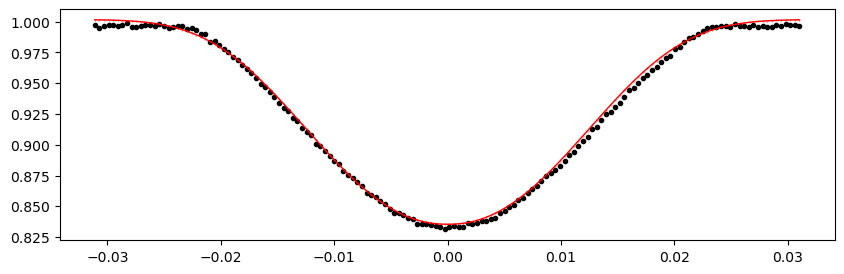

59424.576339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.32it/s]


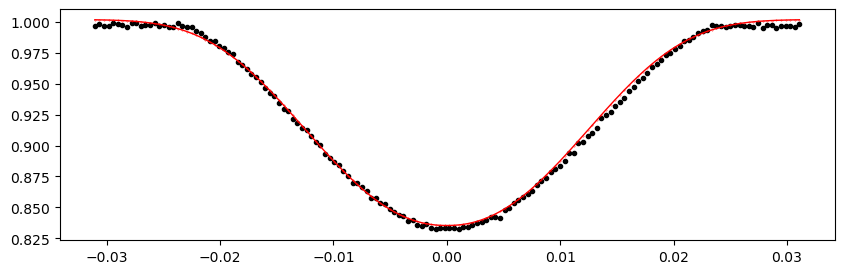

59427.996939000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.08it/s]


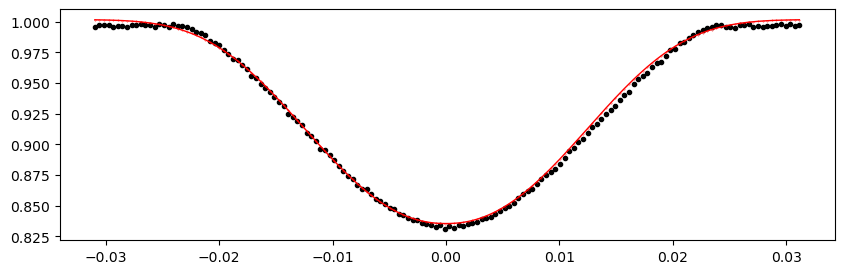

59431.417539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.91it/s]


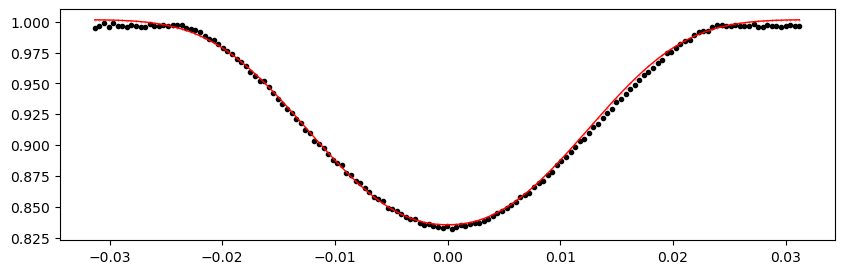

59434.838139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.39it/s]


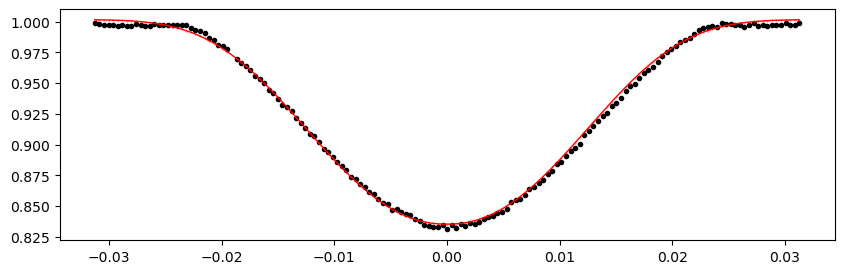

59438.258739000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.95it/s]


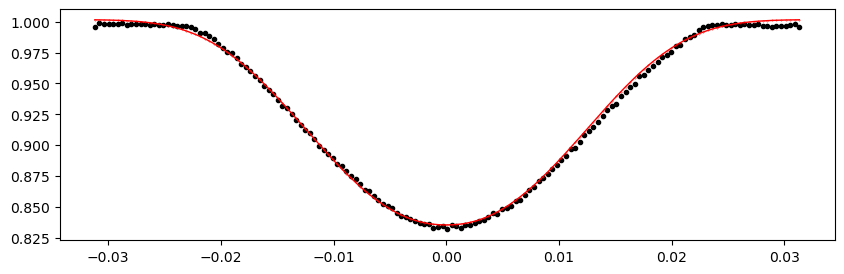

59441.679339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.61it/s]


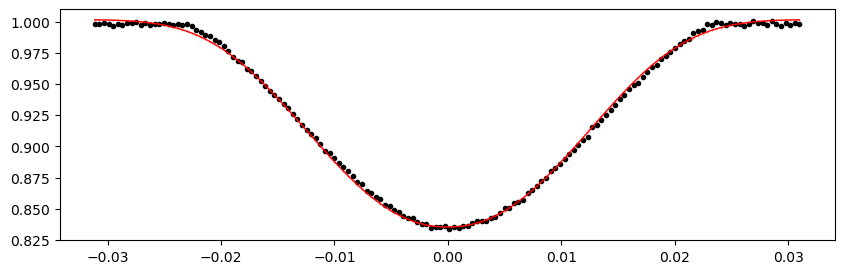

59445.099939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.32it/s]


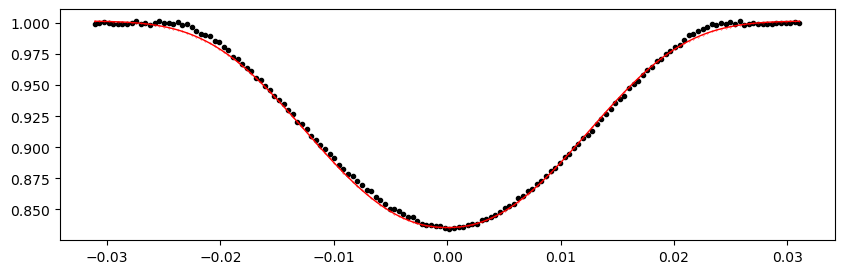

59770.056939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.07it/s]


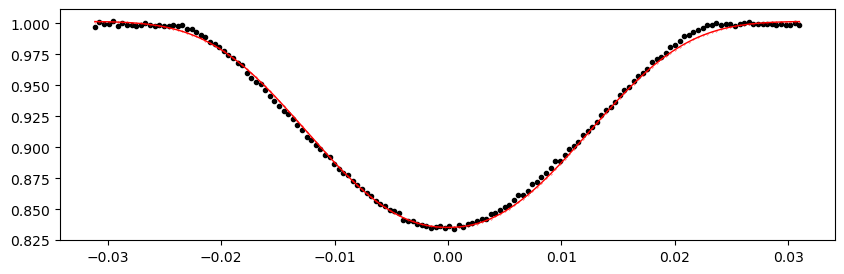

59773.477539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.58it/s]


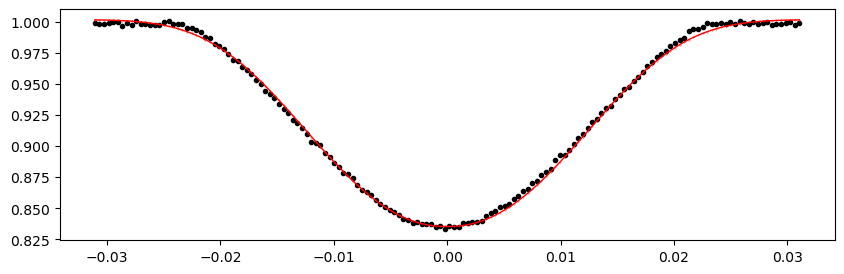

59776.898139000004 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.27it/s]


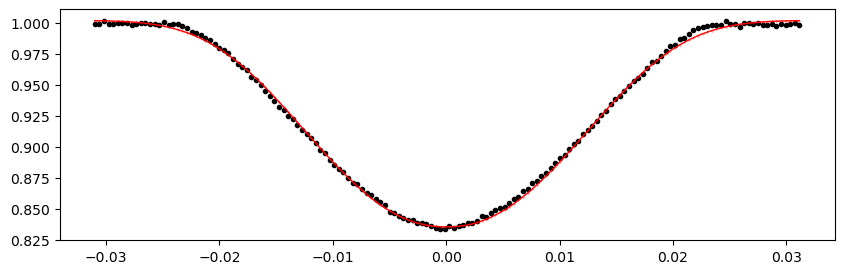

59780.318739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.56it/s]


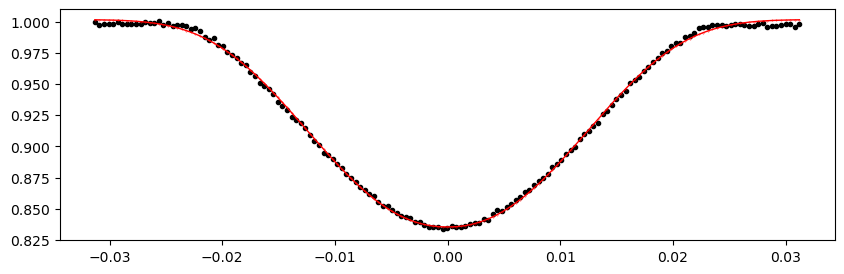

59783.739339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.57it/s]


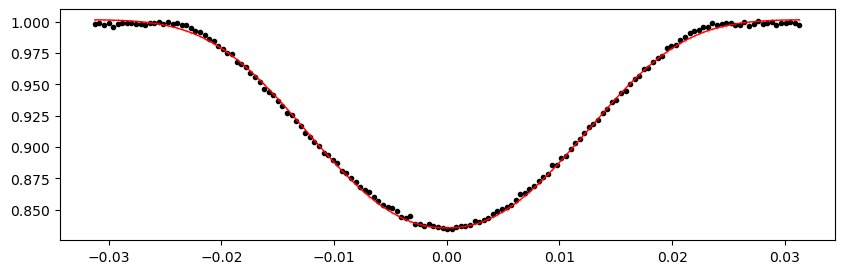

59787.159939000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.02it/s]


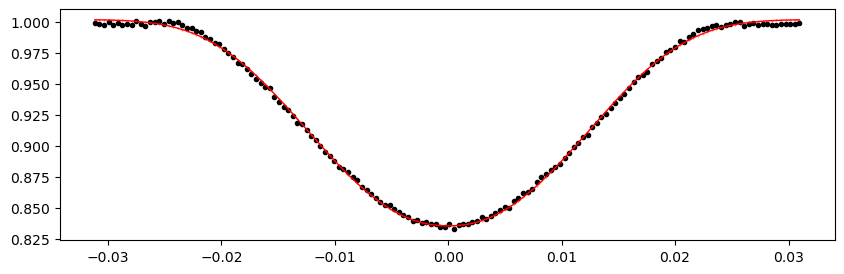

59790.580539 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.53it/s]


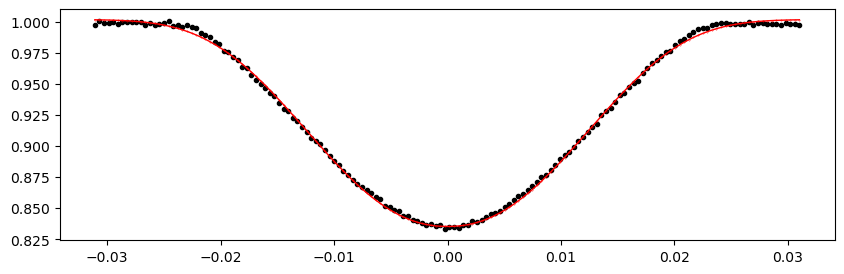

59794.001139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.30it/s]


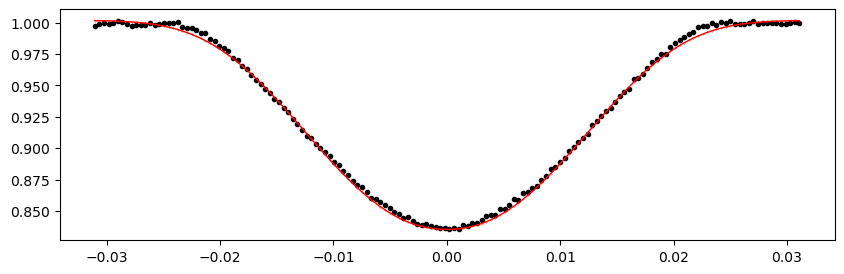

59797.421739000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.92it/s]


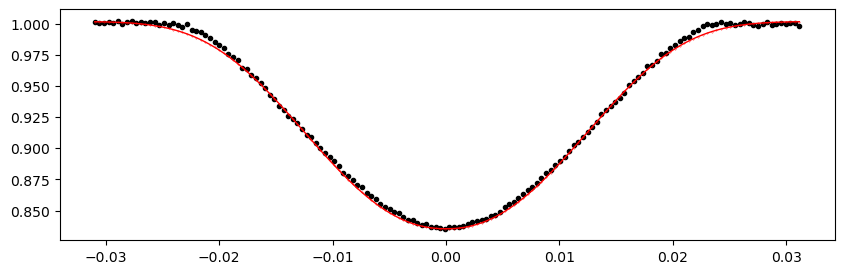

59800.842339 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.52it/s]


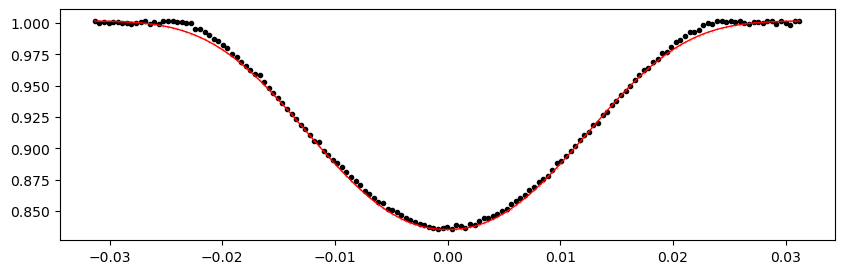

59804.262939 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.43it/s]


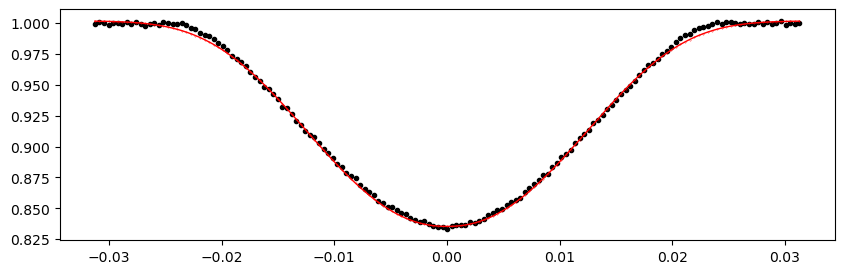

59807.683539000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.28it/s]


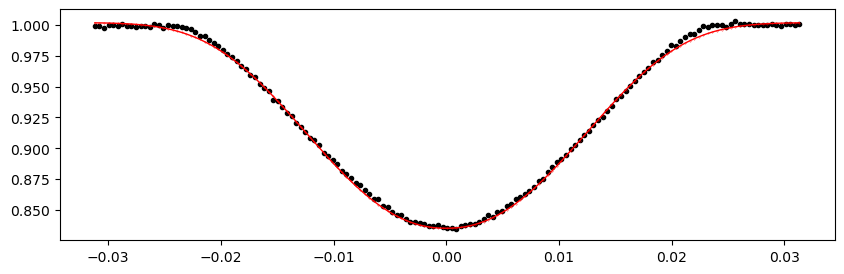

59811.104139 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.79it/s]


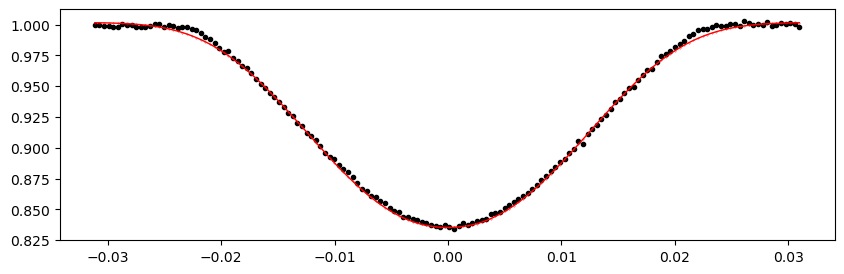

59814.524739 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.04it/s]


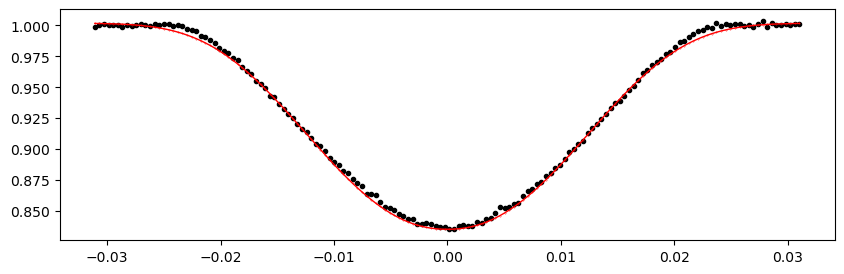

59817.945339000005 1.0017153523557514 -0.16632481838880414 -0.440316816736789


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.41it/s]


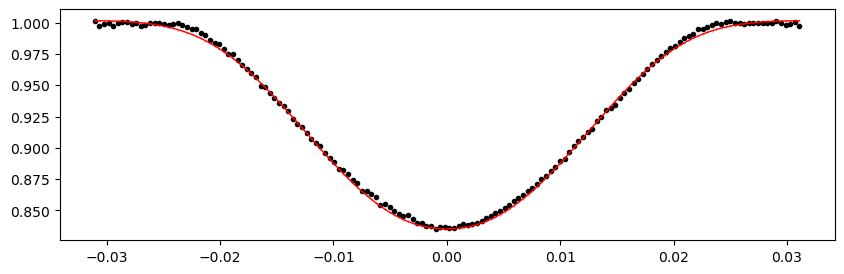

Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
Number 1 has already been completed -- skip
Number 2 has already been completed -- skip
Number 3 has already been completed -- skip
Number 4 has already been completed -- skip
54972.66578106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.44it/s]


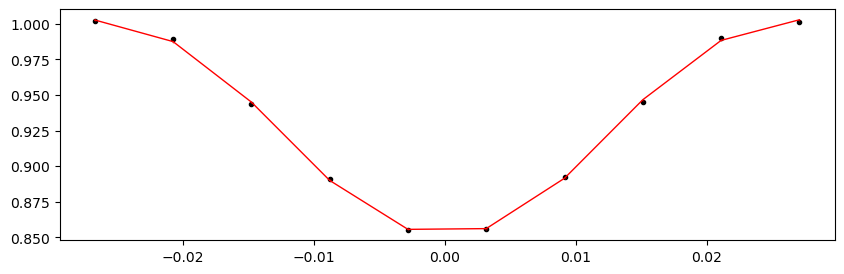

54976.086381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.08it/s]


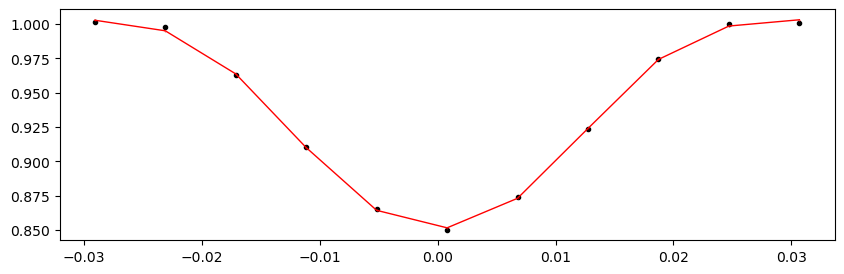

54979.50698106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.84it/s]


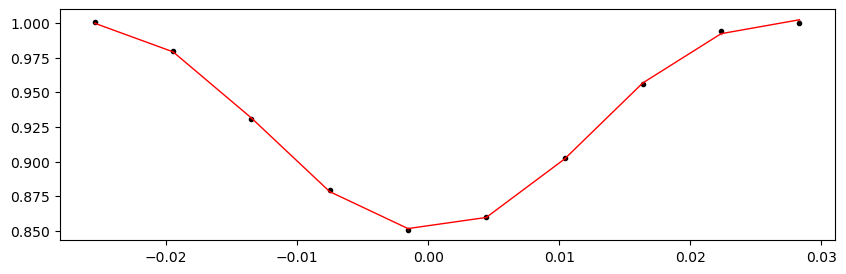

54982.92758106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.04it/s]


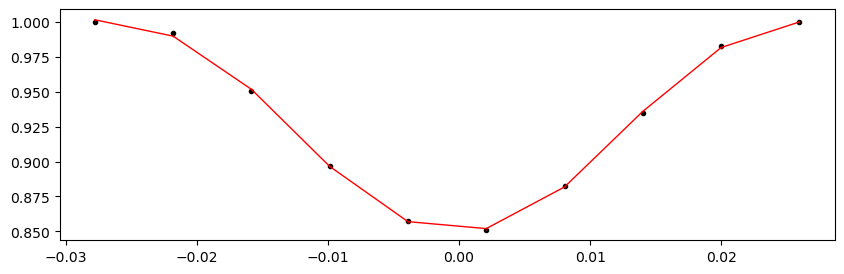

54986.348181060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.33it/s]


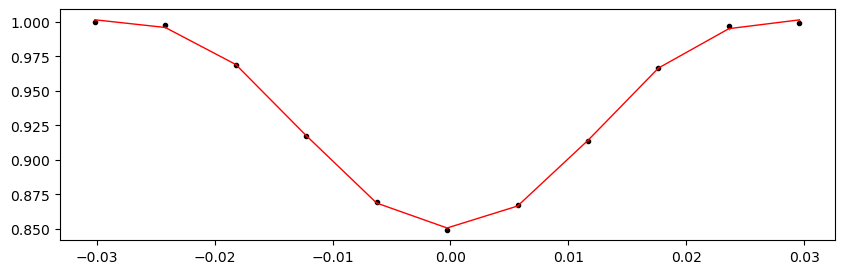

54989.768781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 445.20it/s]


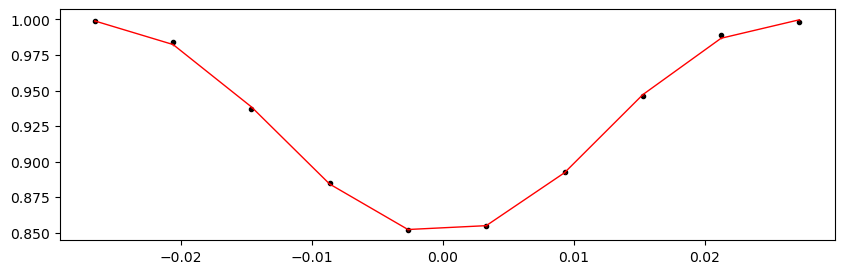

54993.18938106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.69it/s]


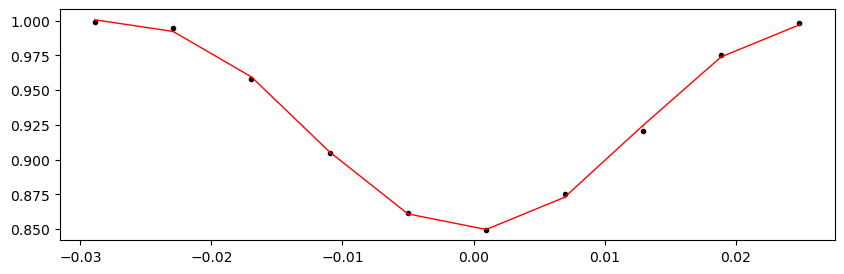

54996.609981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.69it/s]


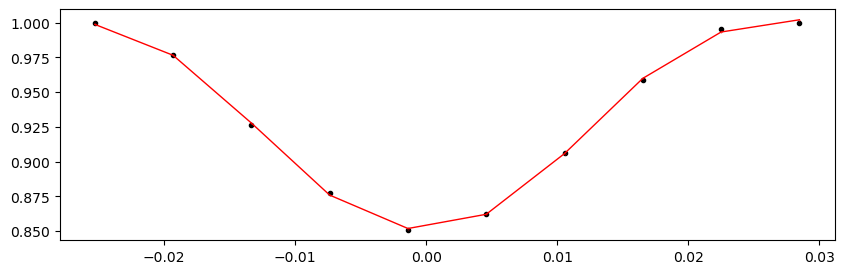

55003.45118106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.29it/s]


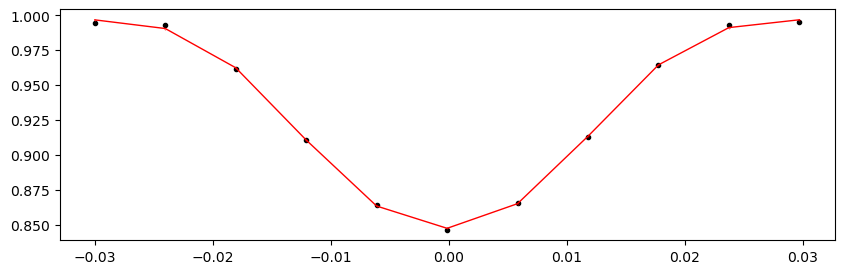

55006.87178106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.16it/s]


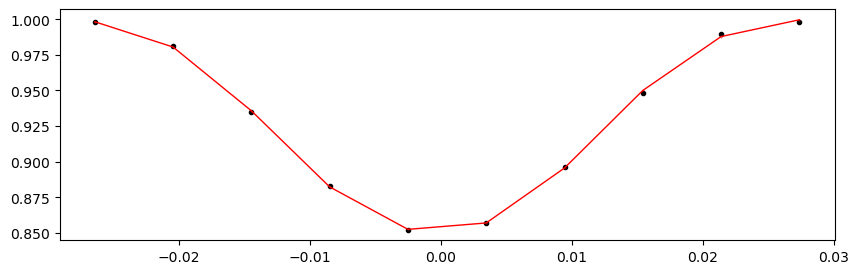

55010.292381060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.83it/s]


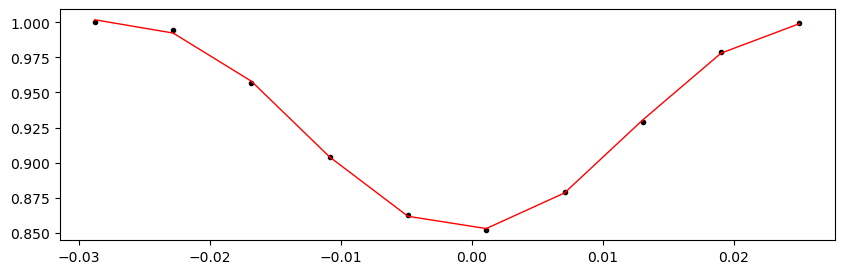

55013.71298106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.07it/s]


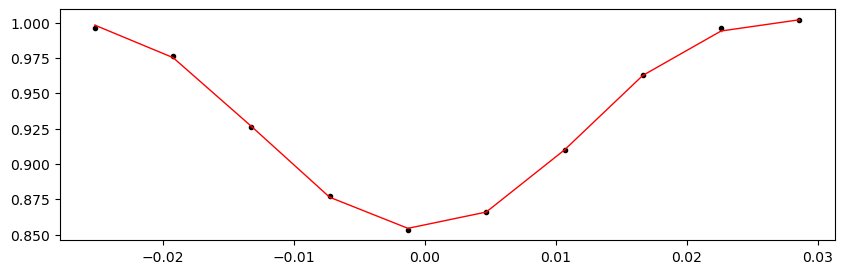

55017.13358106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.19it/s]


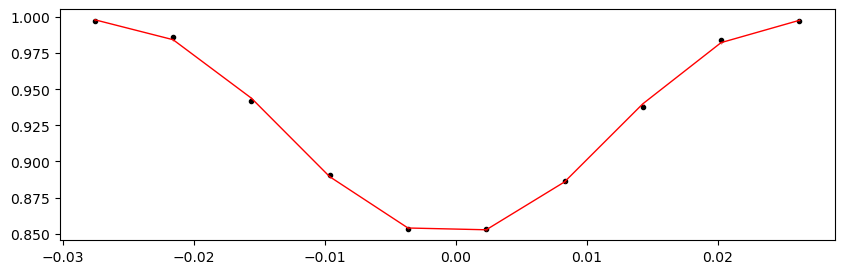

55020.554181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.06it/s]


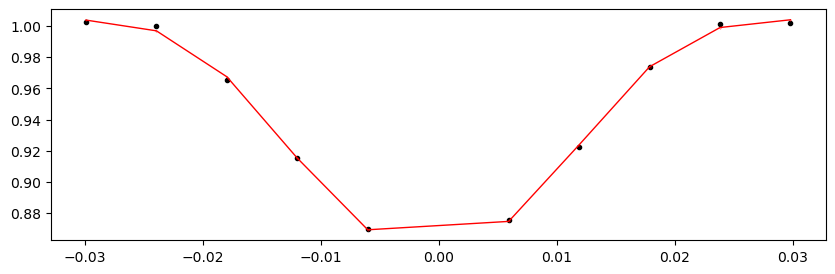

55023.97478106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.97it/s]


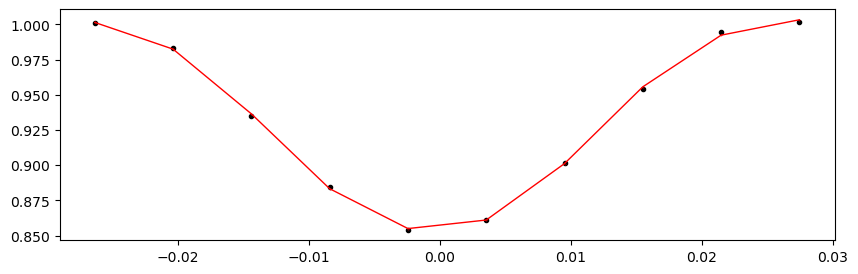

55027.39538106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.55it/s]


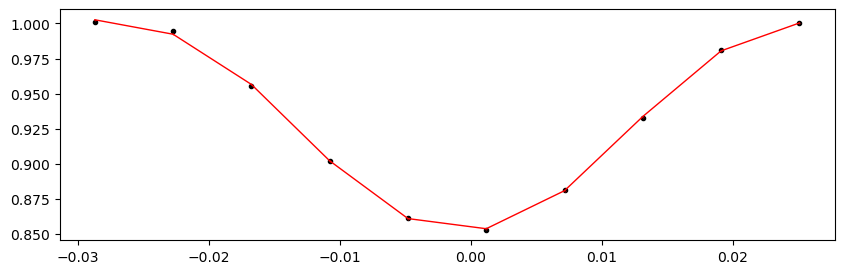

55030.815981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.64it/s]


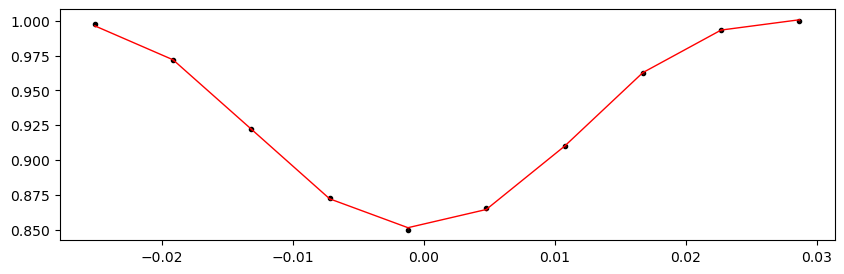

55034.23658106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.11it/s]


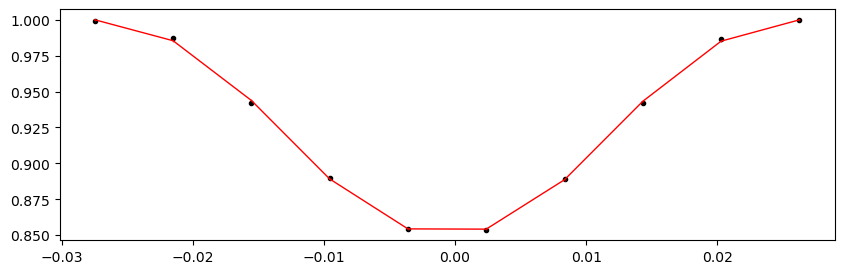

55037.65718106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.55it/s]


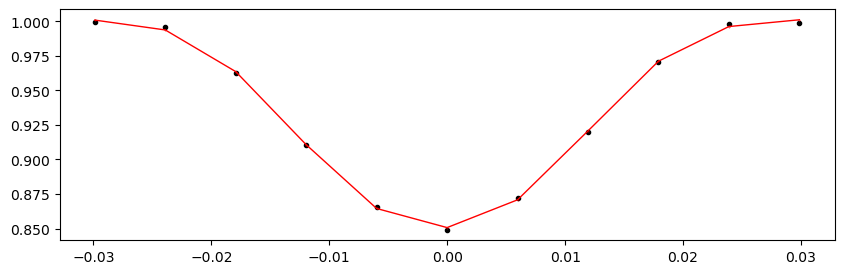

55041.077781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.79it/s]


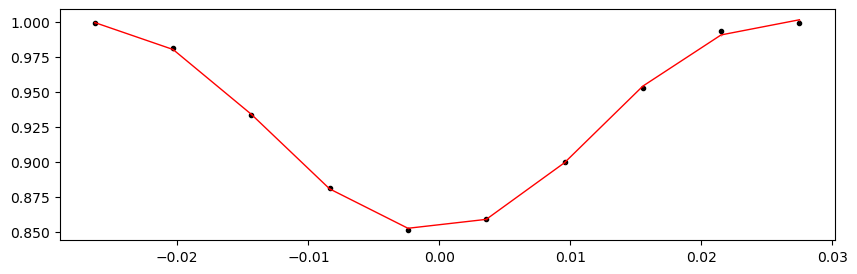

Time 55044.49838106 does not have enough data points: 9
55047.91898106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.57it/s]


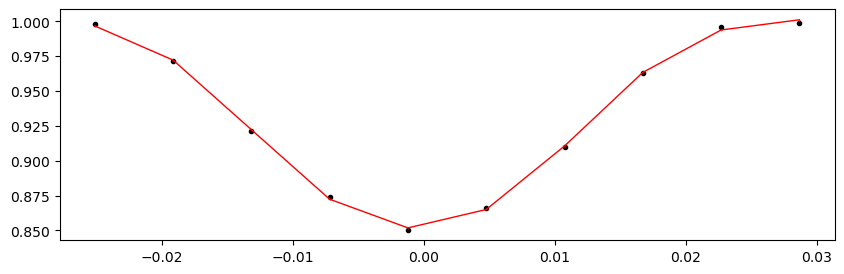

55051.339581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.71it/s]


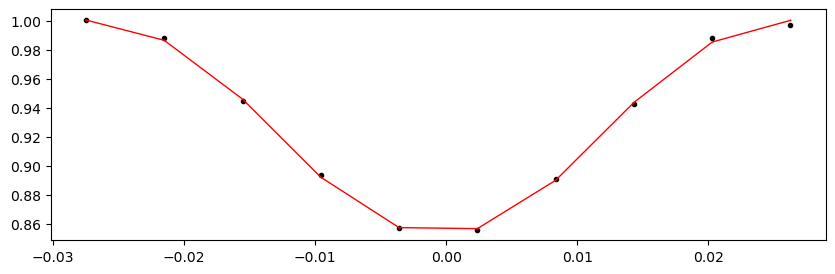

55054.76018106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.32it/s]


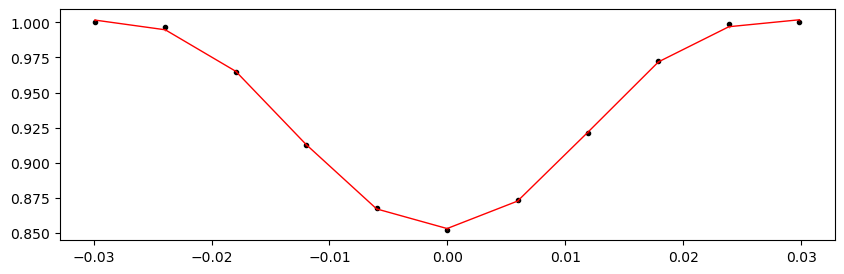

55058.18078106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.63it/s]


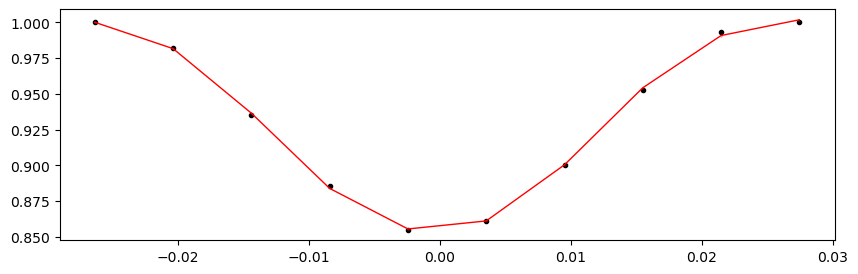

55061.601381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.67it/s]


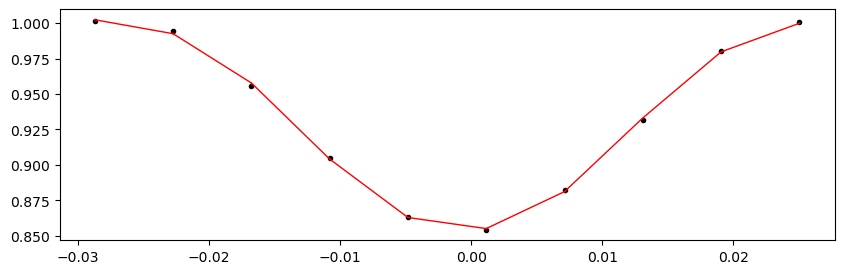

55065.02198106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.82it/s]


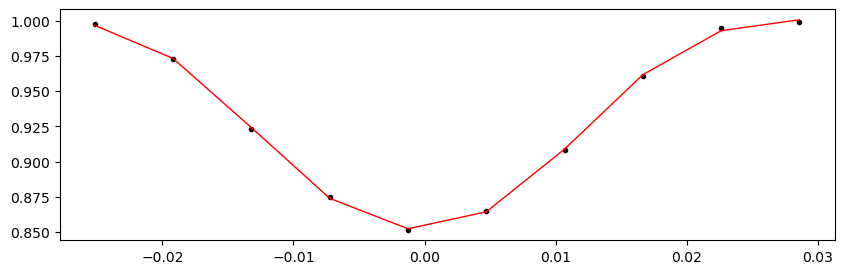

55068.44258106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.38it/s]


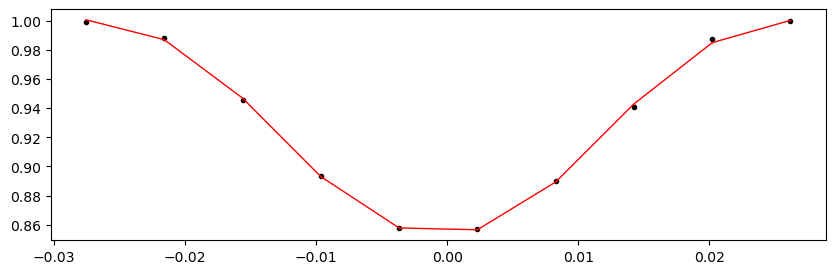

55071.863181060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.27it/s]


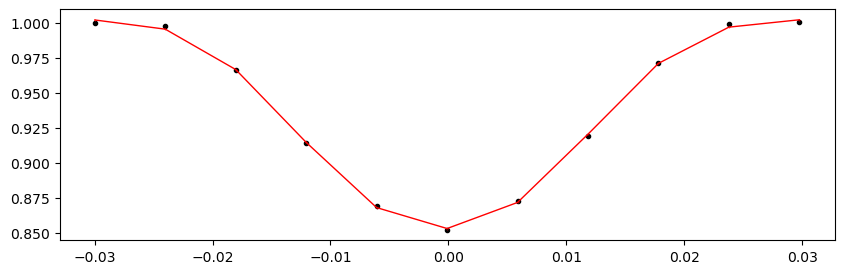

55075.28378106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 447.01it/s]


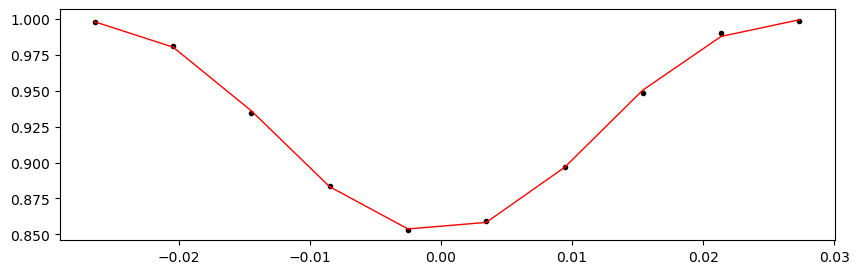

Time 55078.70438106001 does not have enough data points: 9
55082.124981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.12it/s]


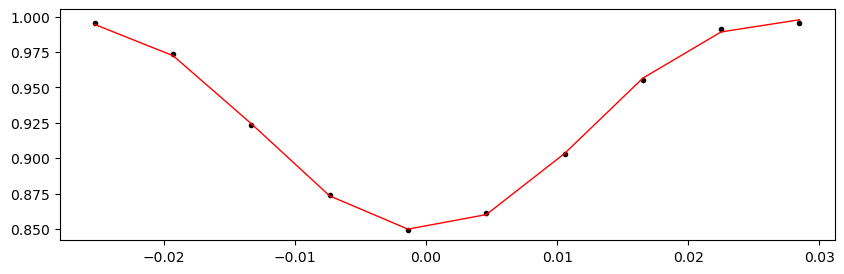

55085.54558106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.92it/s]


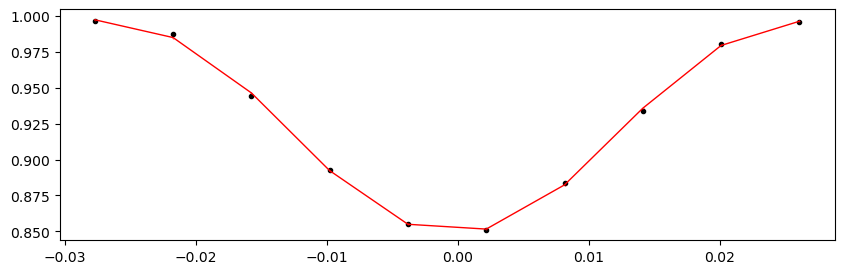

55088.96618106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.66it/s]


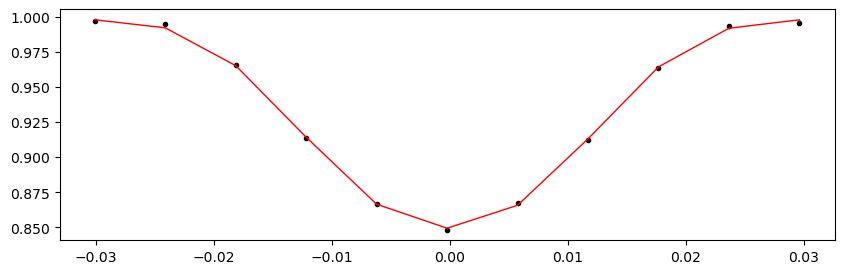

55095.80738106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.04it/s]


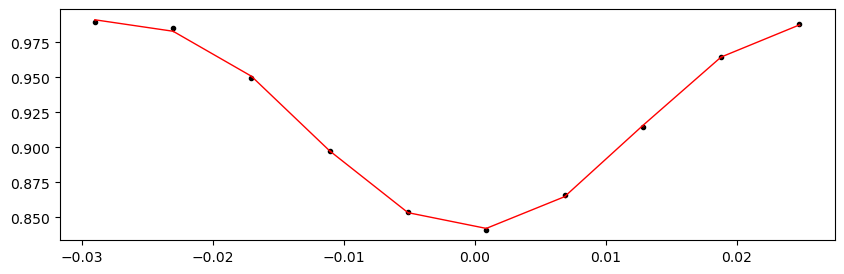

55099.22798106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.32it/s]


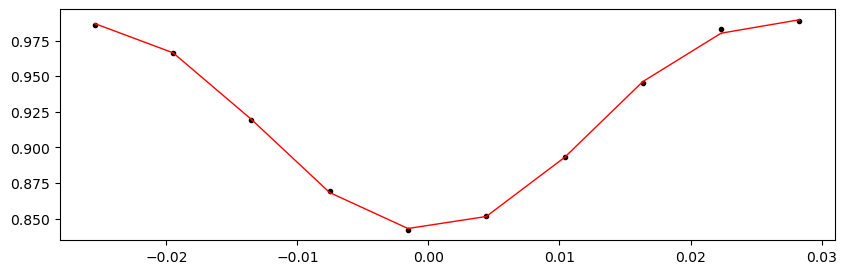

55102.648581060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.70it/s]


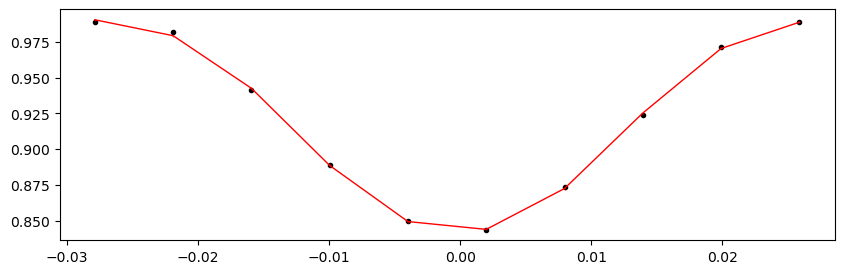

55106.069181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.36it/s]


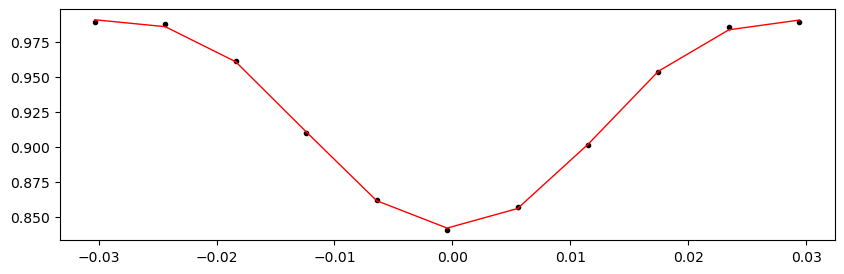

55109.48978106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.39it/s]


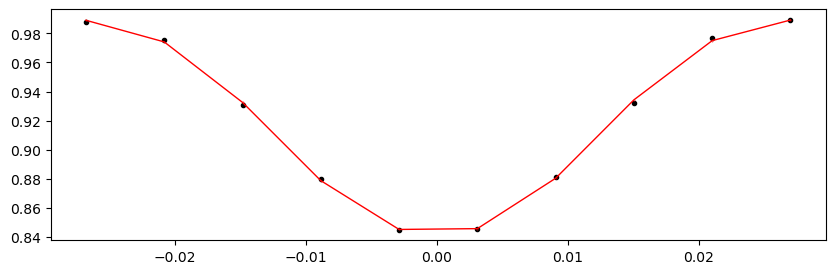

55112.910381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.66it/s]


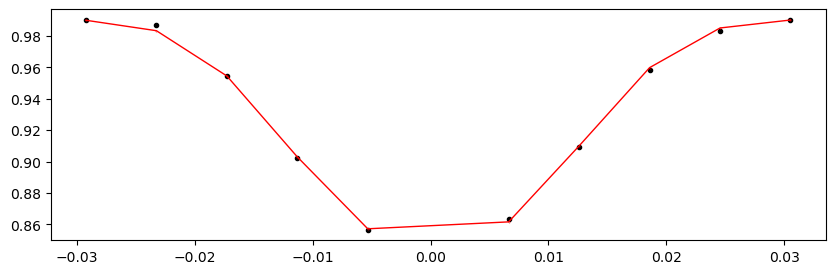

55116.330981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.73it/s]


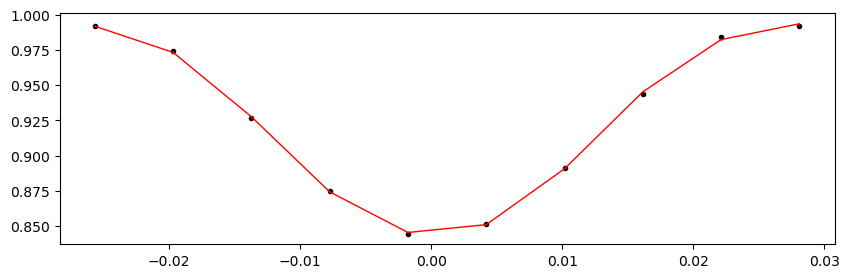

55119.75158106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.10it/s]


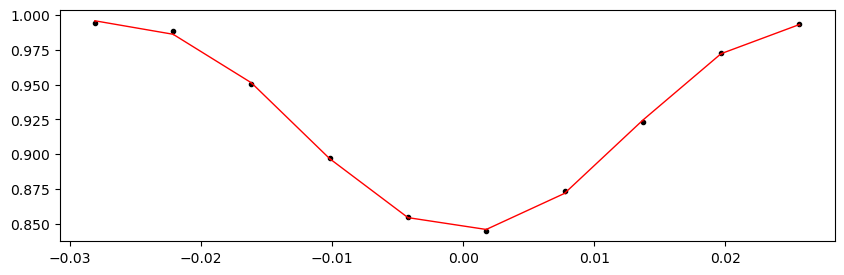

55126.592781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.04it/s]


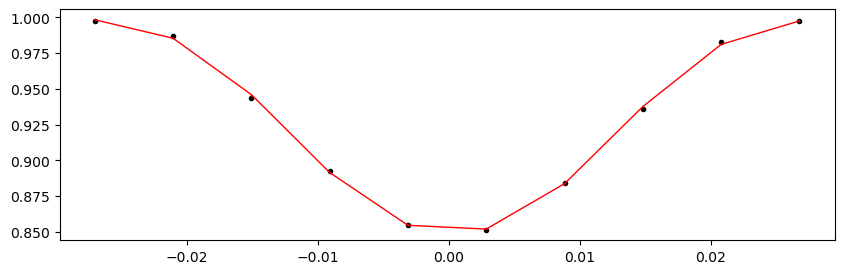

55130.01338106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.36it/s]


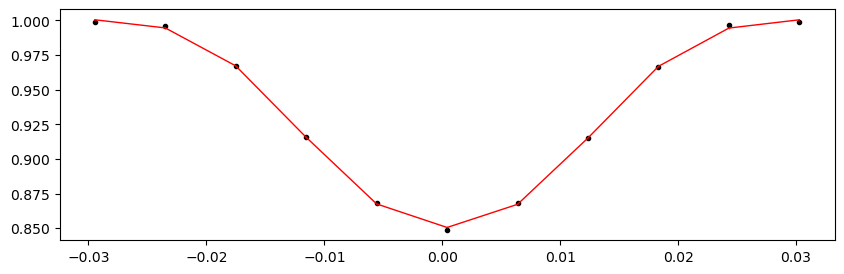

55133.43398106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.23it/s]


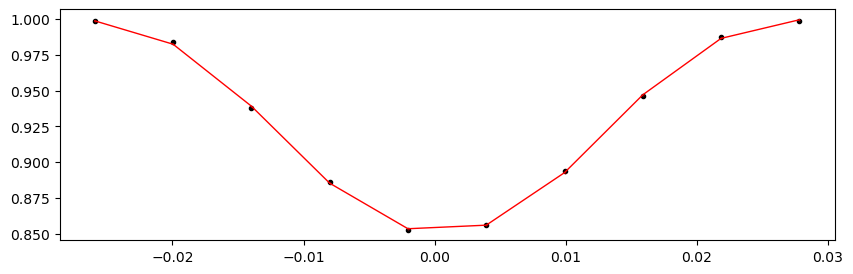

55136.854581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.75it/s]


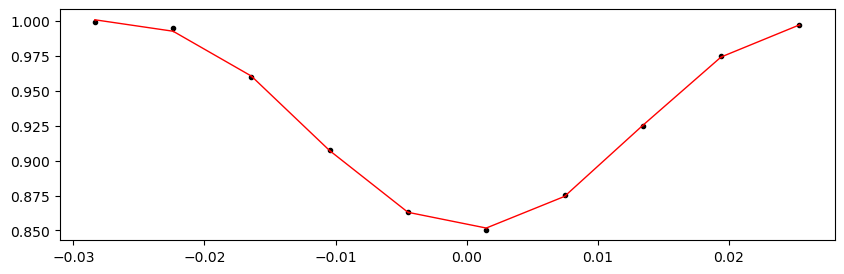

55140.27518106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.26it/s]


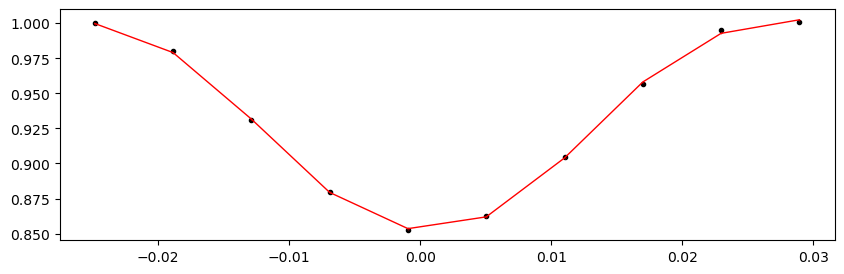

55143.69578106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.04it/s]


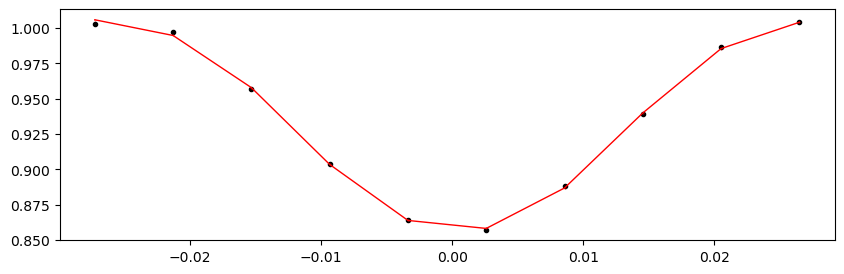

55147.116381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.83it/s]


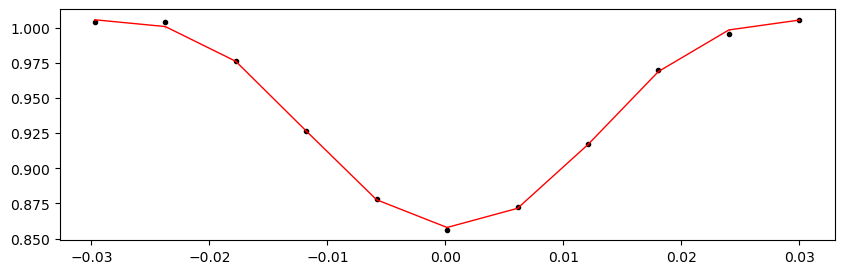

55150.53698106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.90it/s]


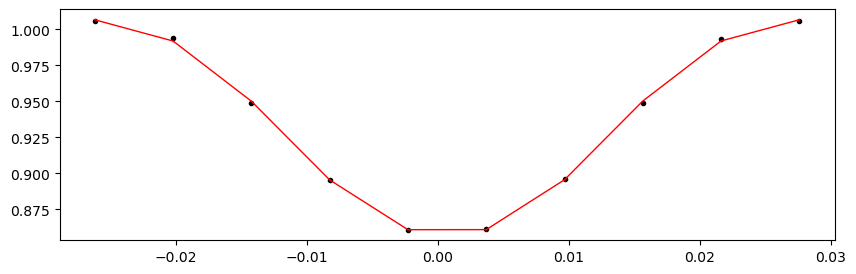

Time 55153.95758106001 does not have enough data points: 5
55157.378181060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.43it/s]


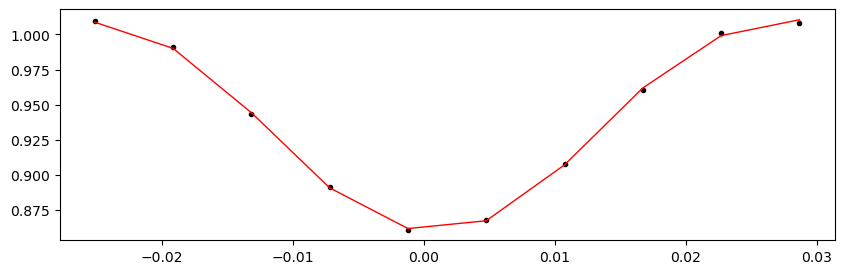

55160.79878106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.09it/s]


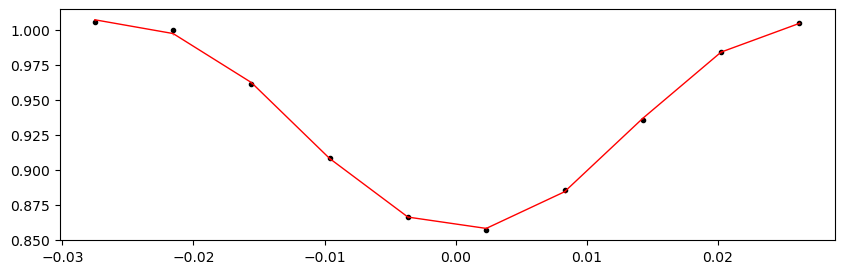

55164.21938106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.14it/s]


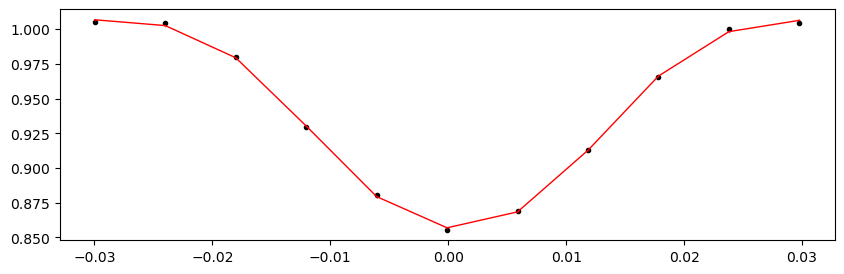

55167.639981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.36it/s]


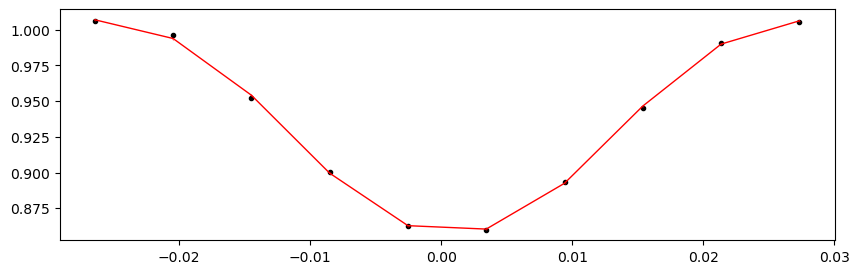

55171.06058106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.92it/s]


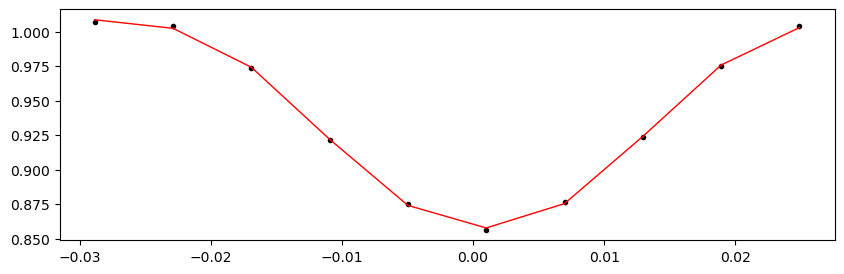

55174.48118106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 435.60it/s]


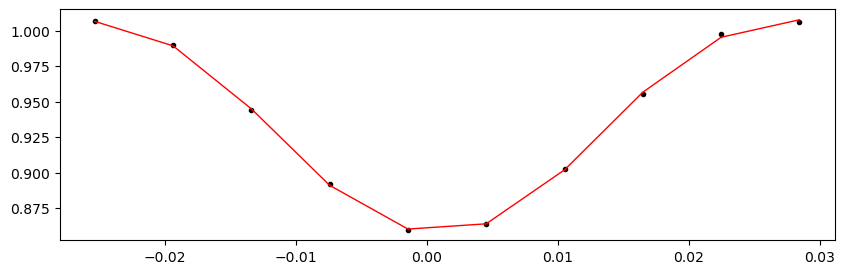

Time 55177.901781060005 does not have enough data points: 9
55181.32238106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.74it/s]


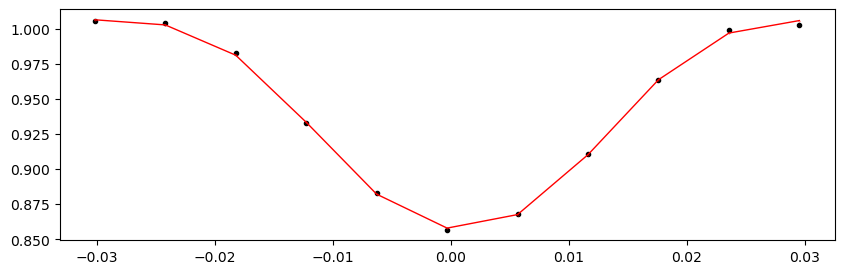

55188.163581060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.25it/s]


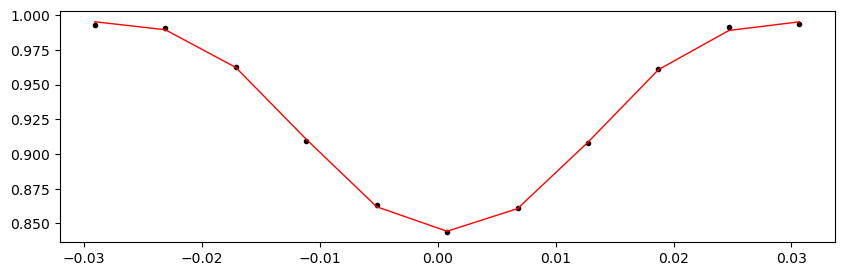

55191.58418106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.67it/s]


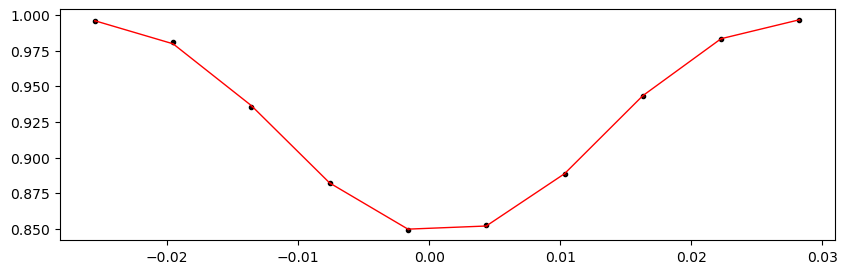

55195.00478106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.74it/s]


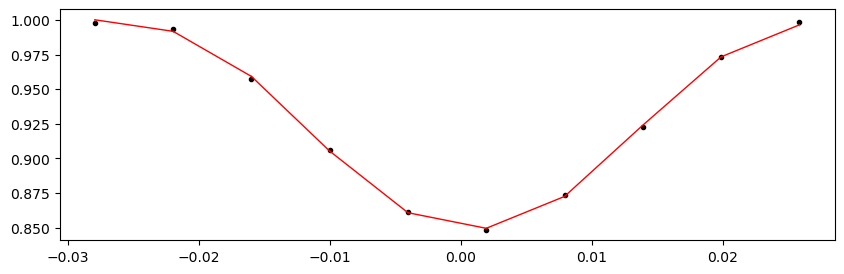

55198.425381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.55it/s]


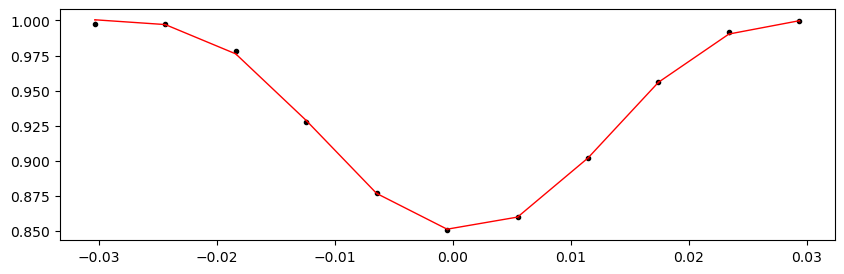

55201.84598106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.68it/s]


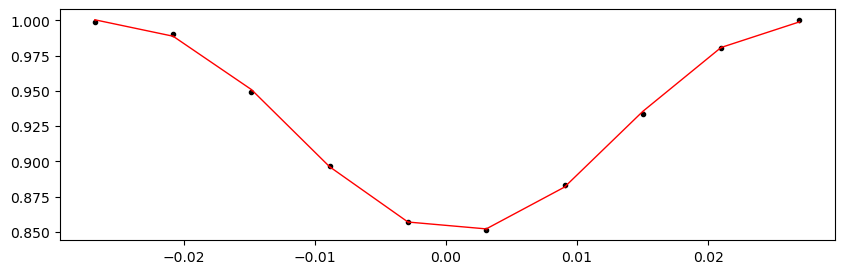

55205.26658106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.24it/s]


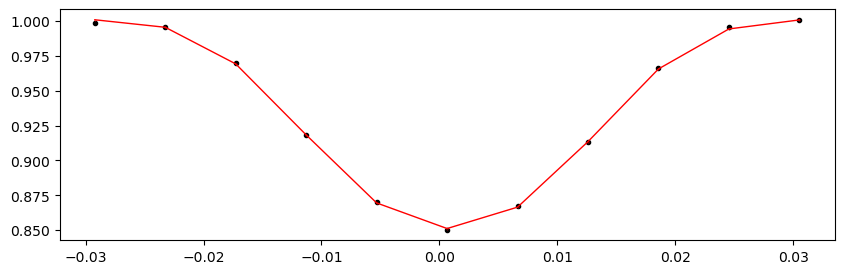

Time 55208.687181060006 does not have enough data points: 9
55212.10778106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.71it/s]


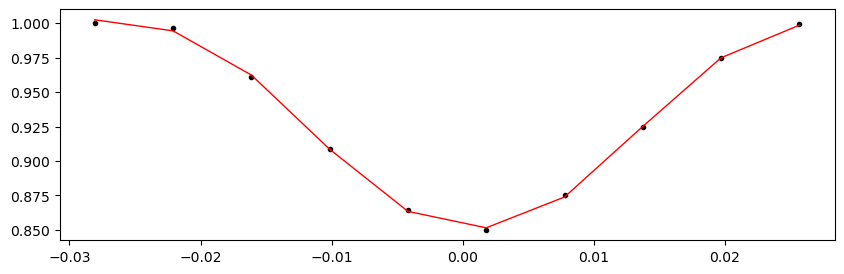

55215.52838106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.21it/s]


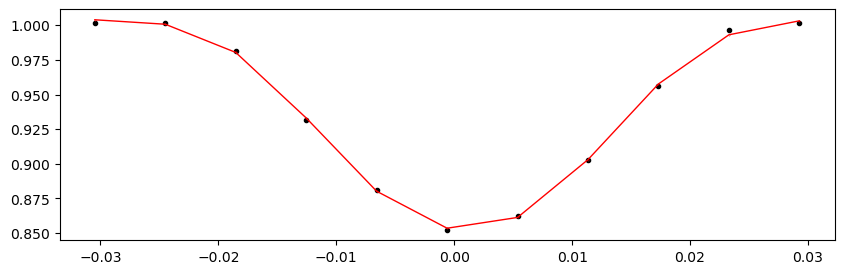

55218.948981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.56it/s]


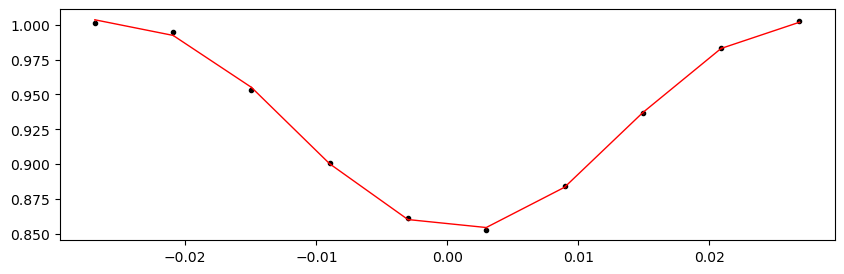

55222.369581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.29it/s]


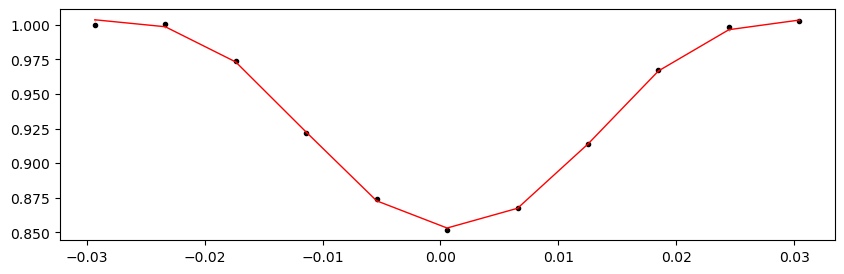

Time 55225.79018106001 does not have enough data points: 9
55229.21078106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.68it/s]


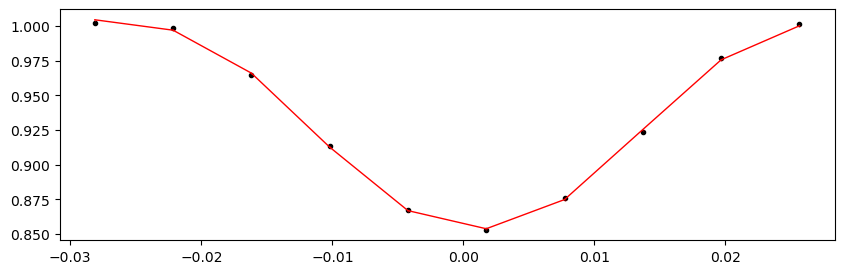

55236.05198106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.33it/s]


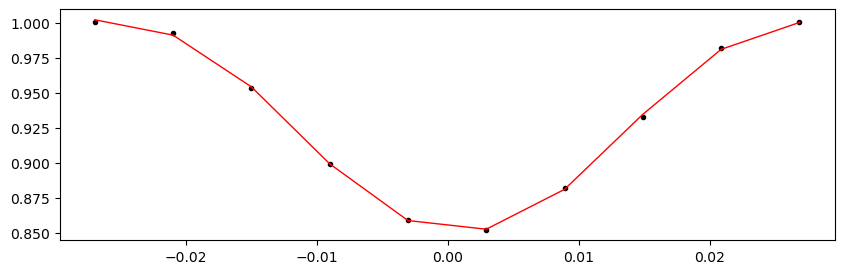

55239.47258106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.78it/s]


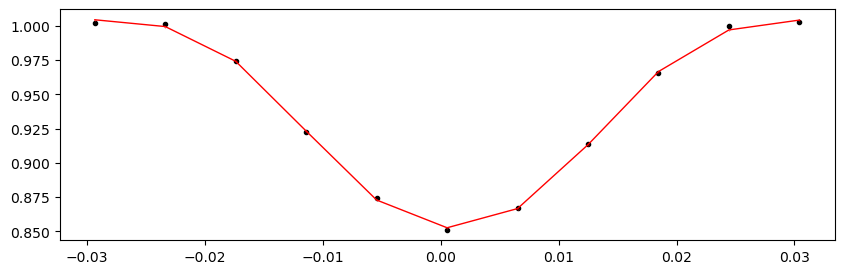

55242.893181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.59it/s]


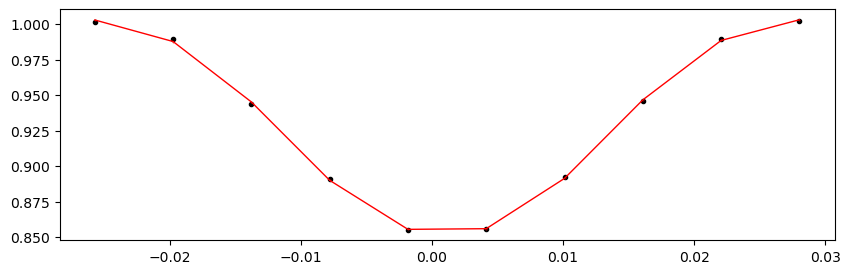

55246.31378106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.14it/s]


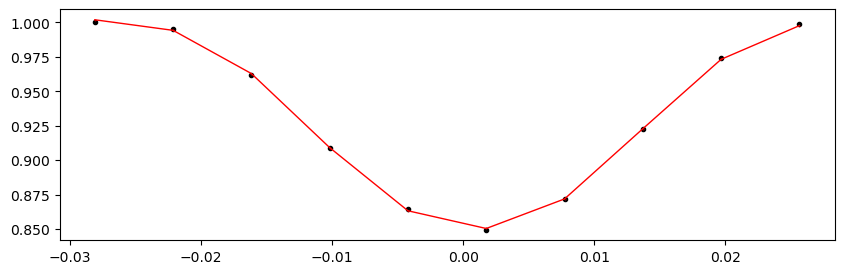

55249.73438106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.69it/s]


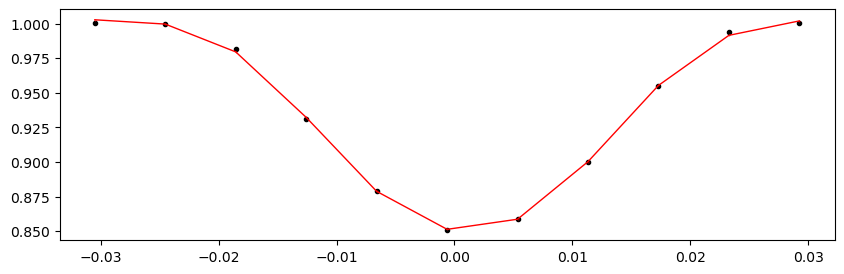

55253.154981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.68it/s]


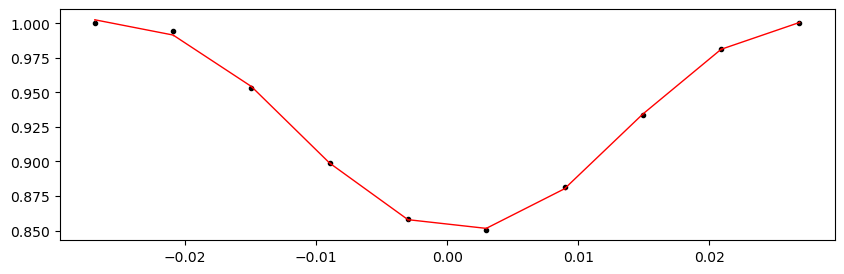

55256.57558106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.01it/s]


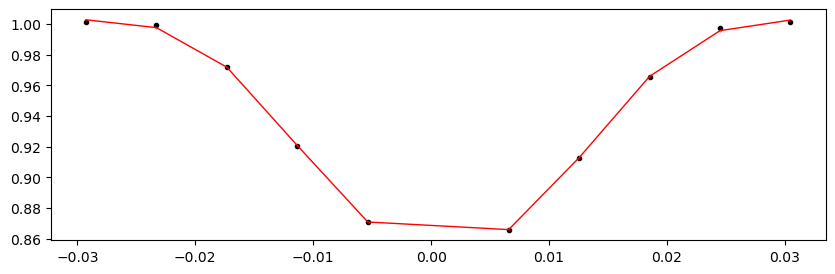

55259.99618106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.35it/s]


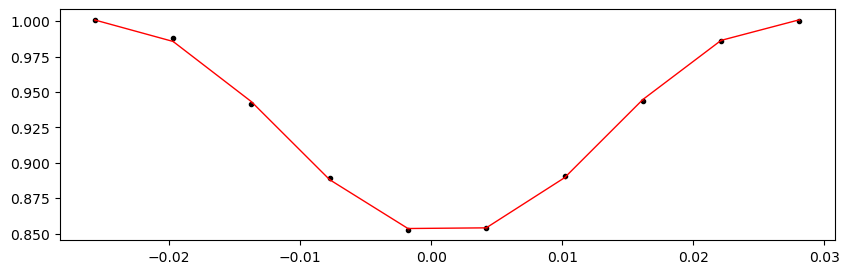

55263.416781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.39it/s]


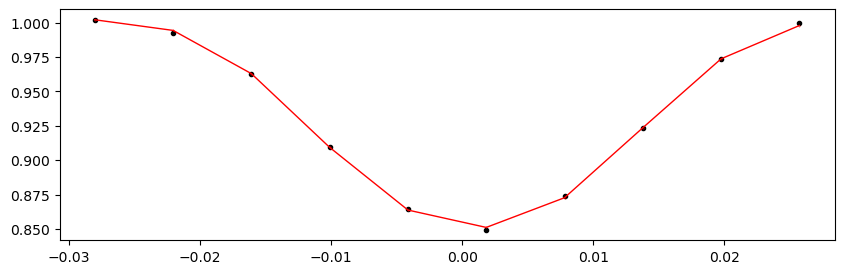

55266.83738106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.37it/s]


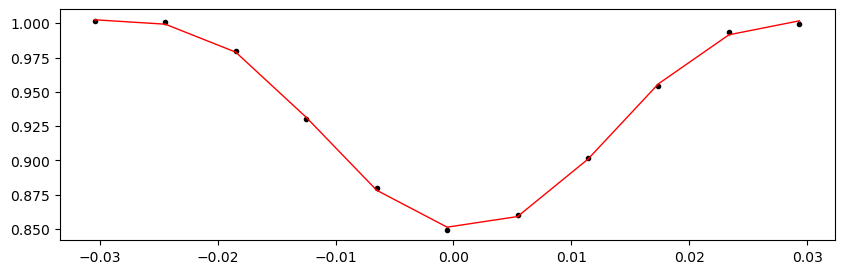

55270.25798106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.43it/s]


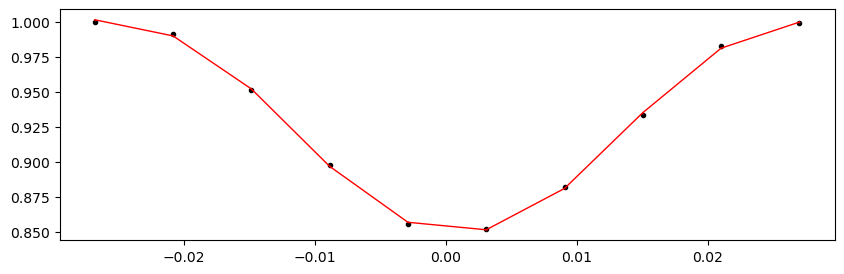

55273.678581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.92it/s]


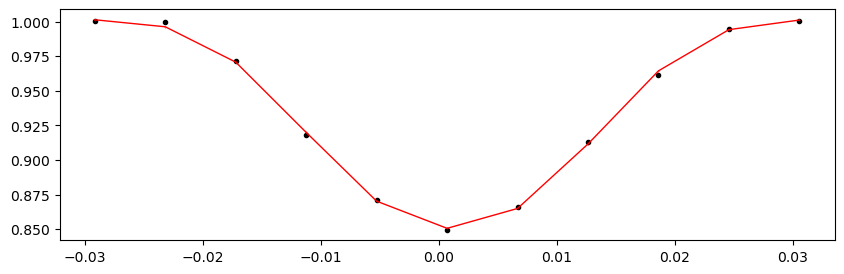

Time 55277.09918106 does not have enough data points: 9
Time 55280.51978106001 does not have enough data points: 9
55283.940381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.65it/s]


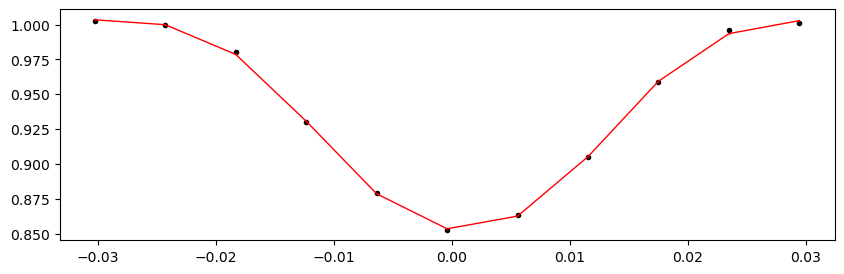

55287.36098106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.93it/s]


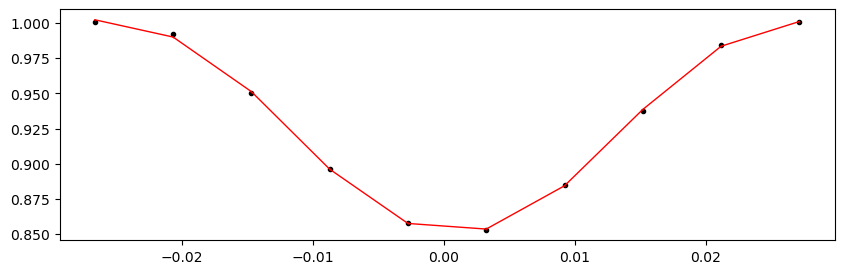

55290.78158106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.35it/s]


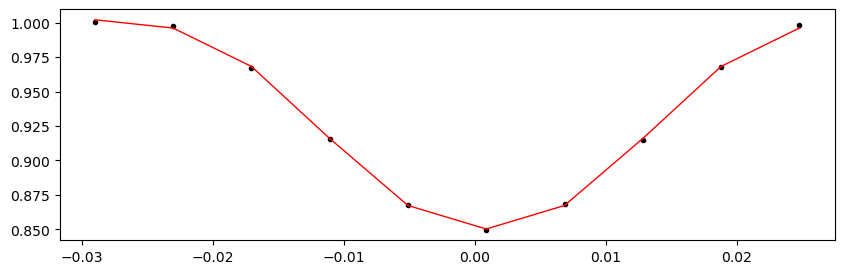

55294.202181060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.50it/s]


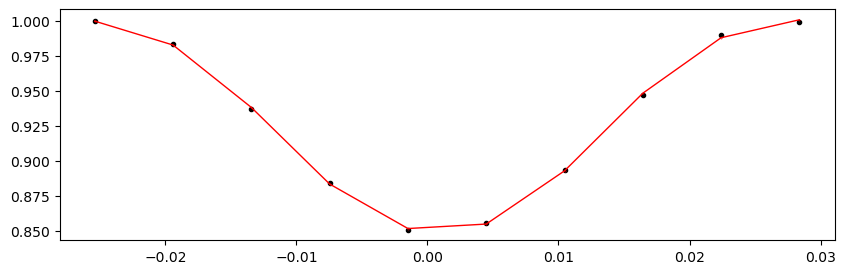

55297.62278106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.69it/s]


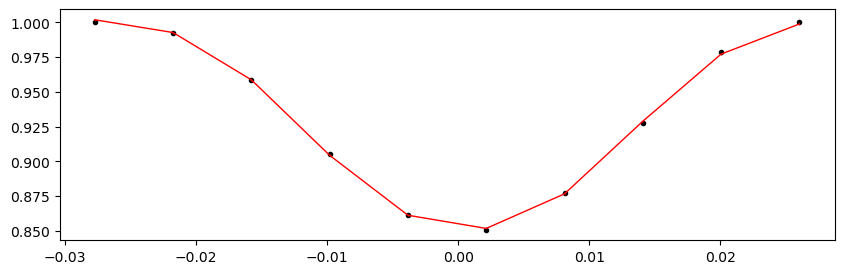

55301.04338106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.32it/s]


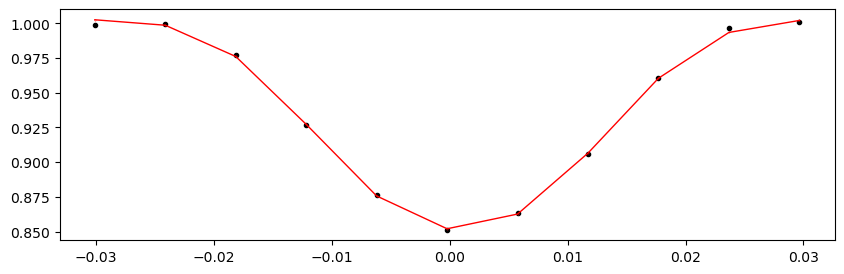

55304.463981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.31it/s]


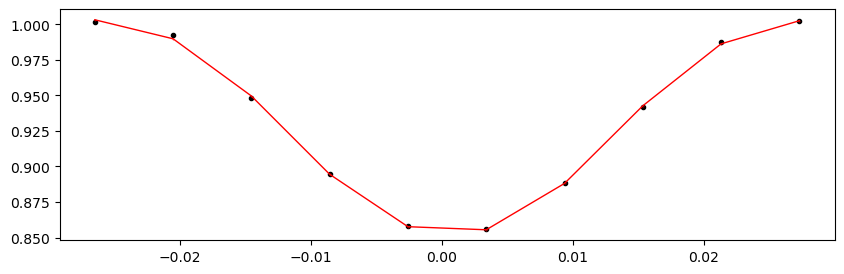

55311.30518106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.64it/s]


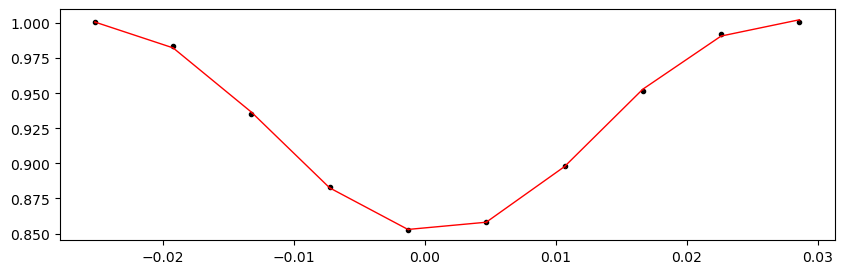

55314.725781060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.40it/s]


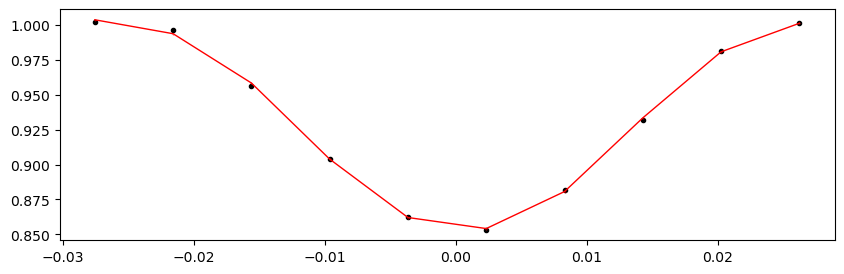

55318.14638106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.97it/s]


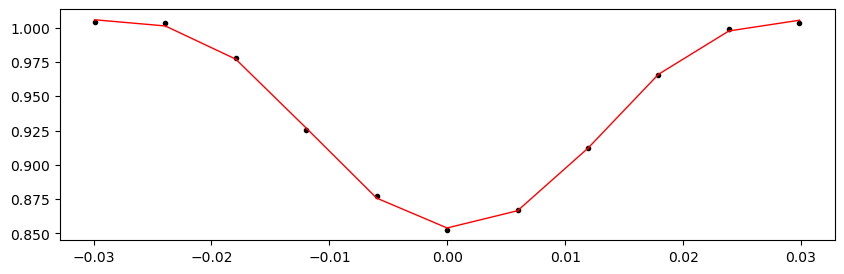

Time 55321.56698106001 does not have enough data points: 9
55324.987581060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.26it/s]


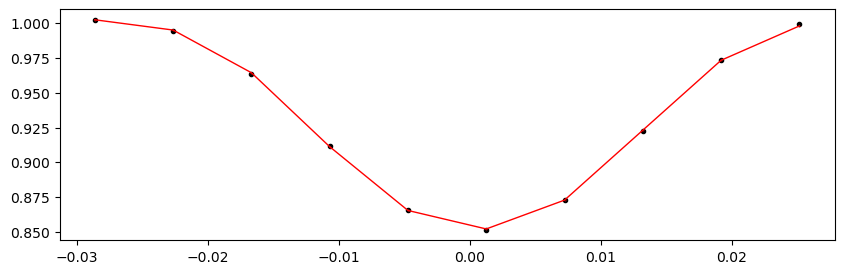

55328.408181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.26it/s]


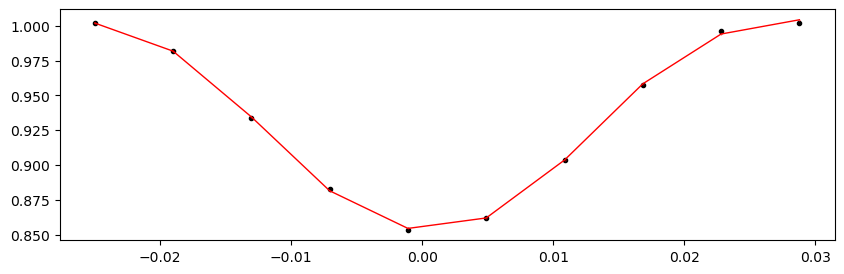

55331.82878106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.56it/s]


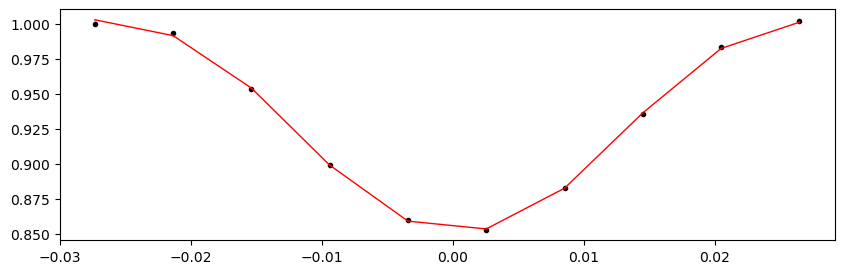

55335.249381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.27it/s]


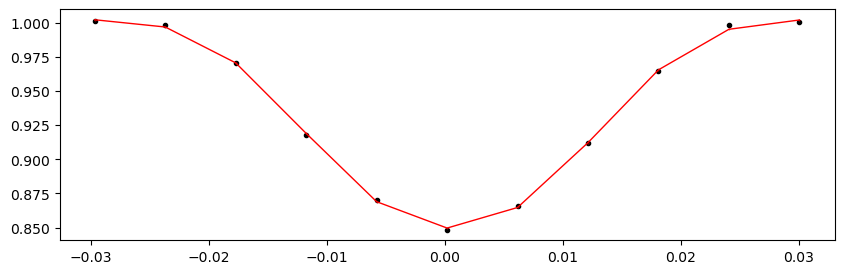

55338.669981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.77it/s]


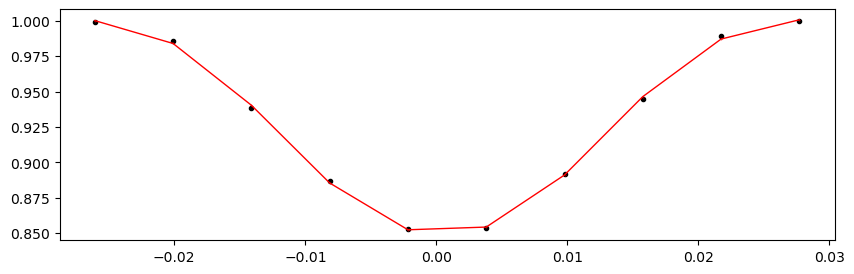

55342.09058106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.88it/s]


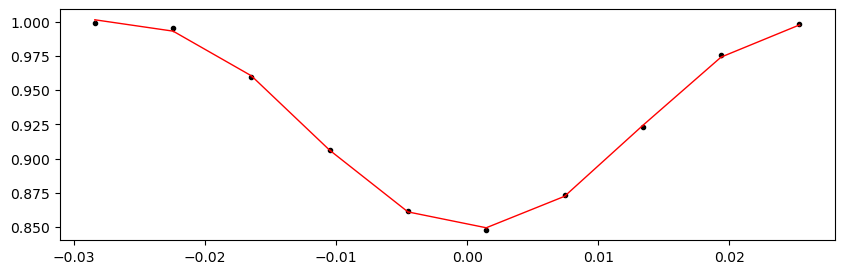

55345.51118106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.10it/s]


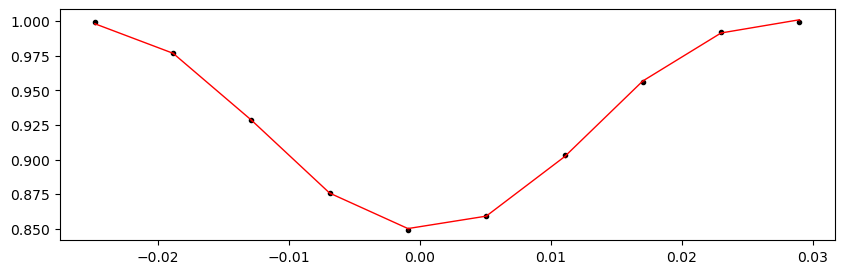

55348.931781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.08it/s]


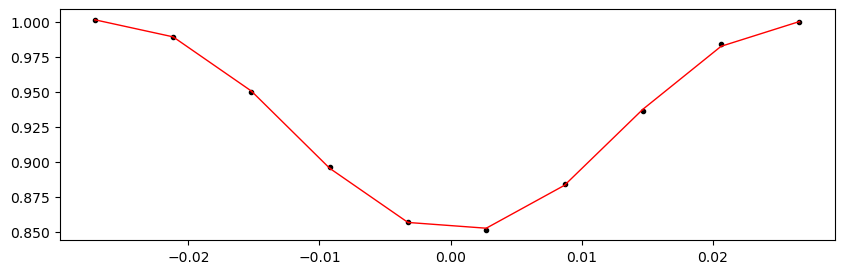

55352.35238106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.86it/s]


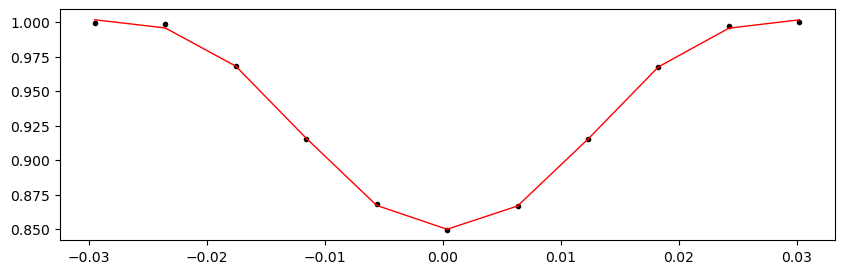

55355.77298106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.93it/s]


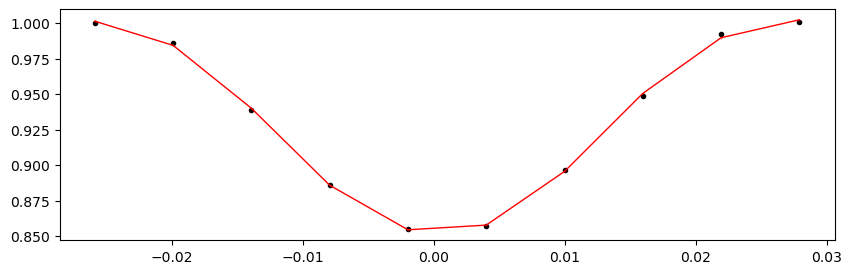

55359.193581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.38it/s]


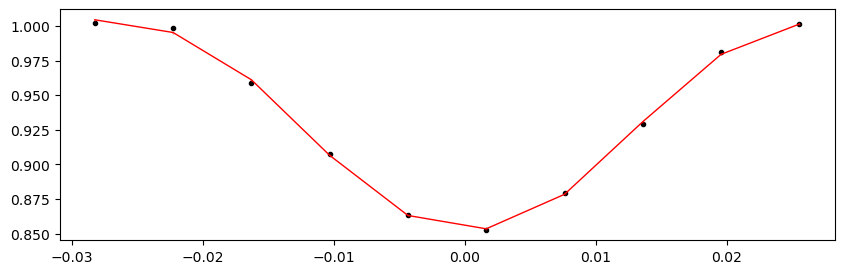

55362.61418106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.41it/s]


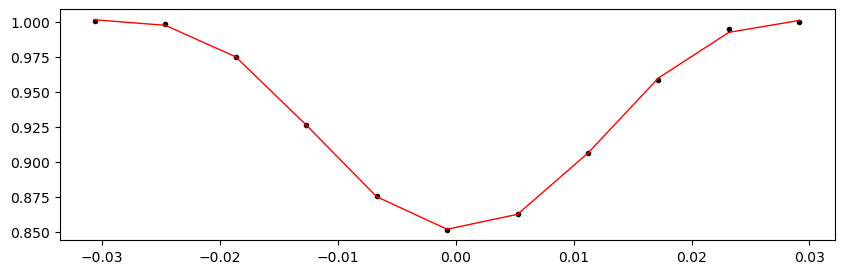

55366.03478106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.29it/s]


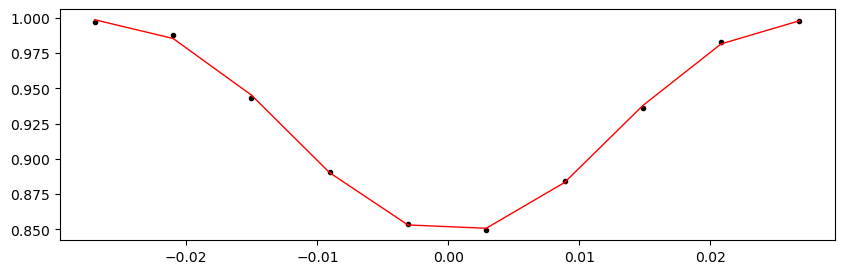

55369.455381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.03it/s]


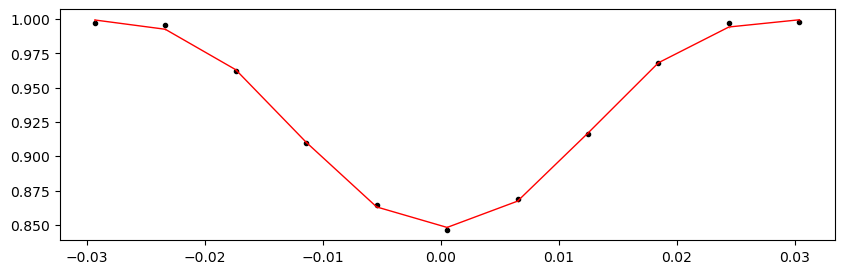

55372.87598106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.88it/s]


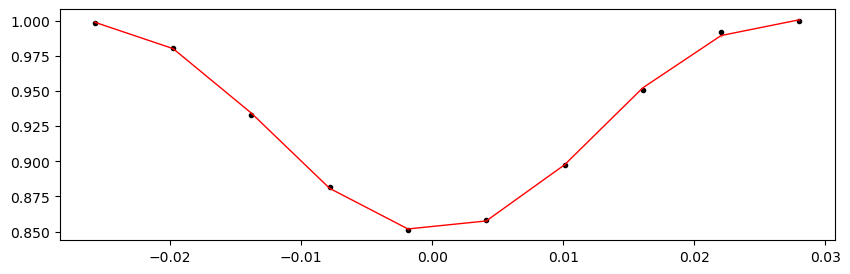

55376.29658106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.17it/s]


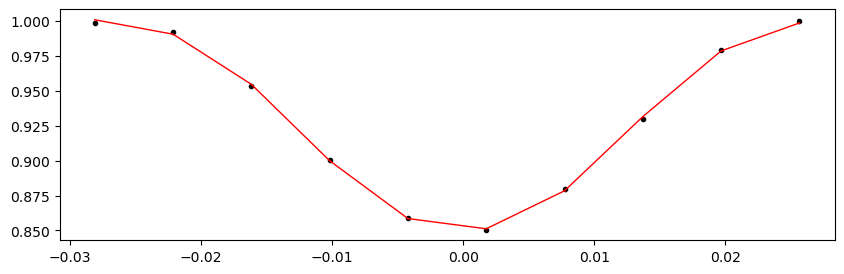

55379.717181060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.07it/s]


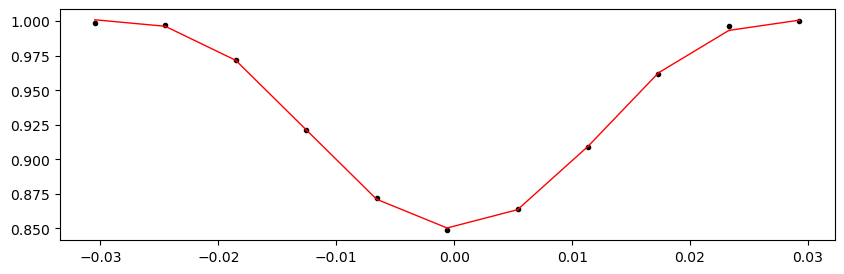

55383.13778106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.84it/s]


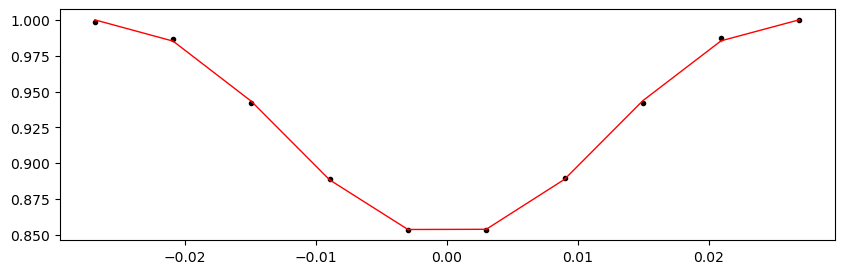

55386.55838106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.61it/s]


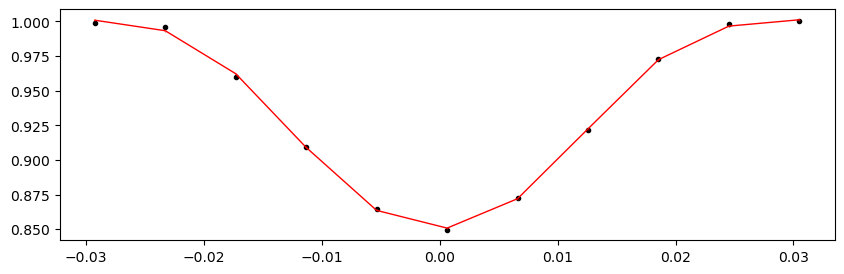

55389.978981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 445.19it/s]


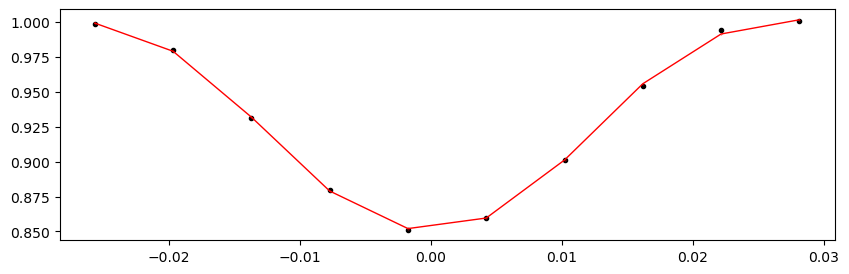

55393.39958106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.58it/s]


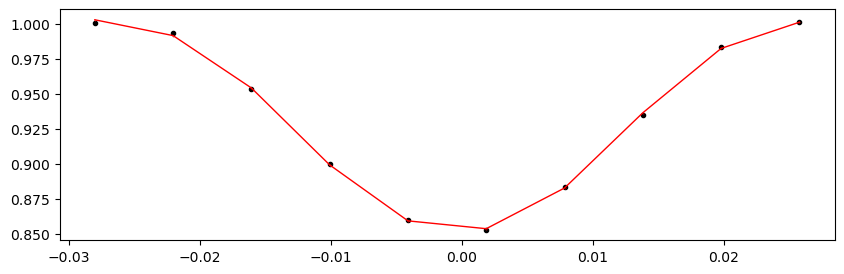

55396.82018106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.60it/s]


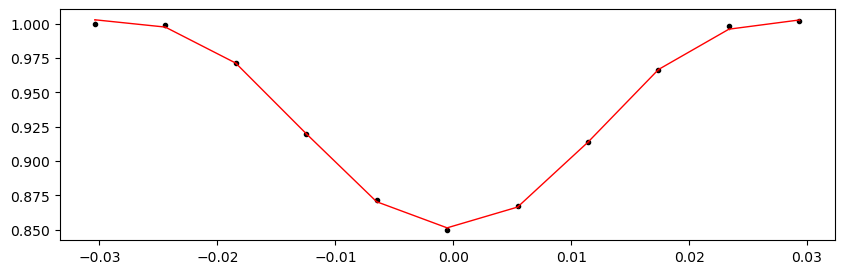

55400.240781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.50it/s]


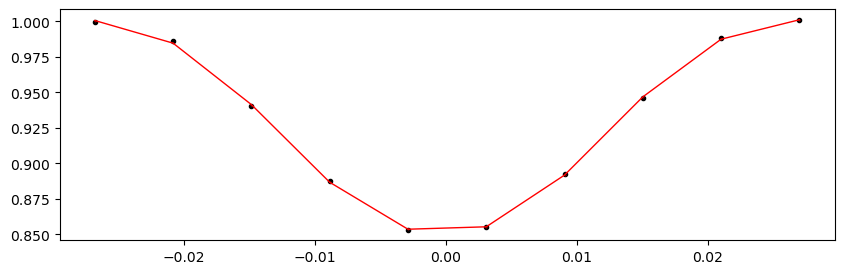

55403.66138106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.71it/s]


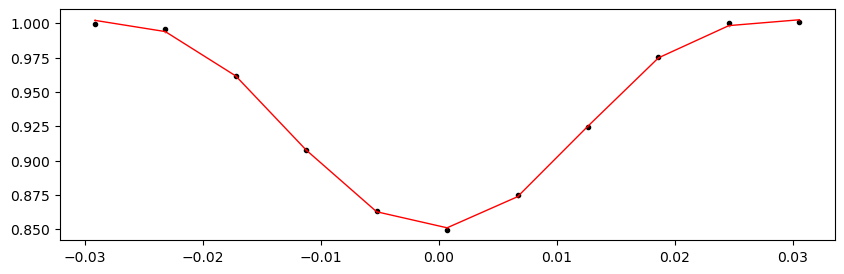

55407.08198106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.33it/s]


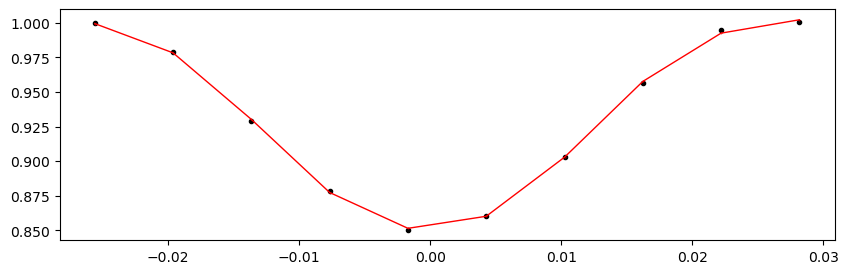

55410.502581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.41it/s]


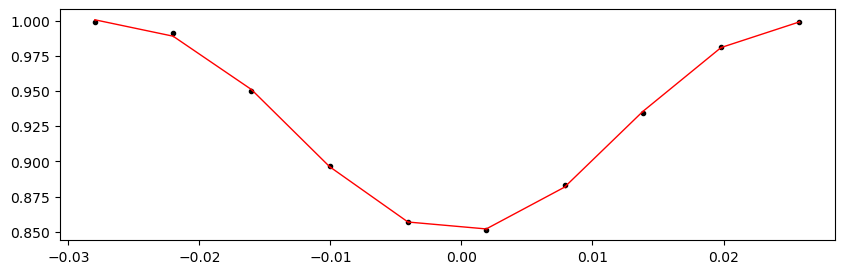

55413.92318106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.83it/s]


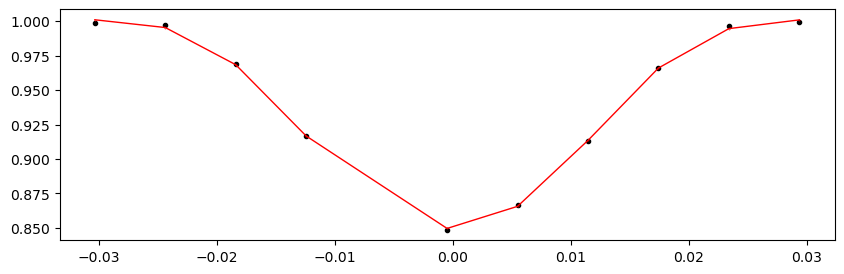

55417.34378106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.48it/s]


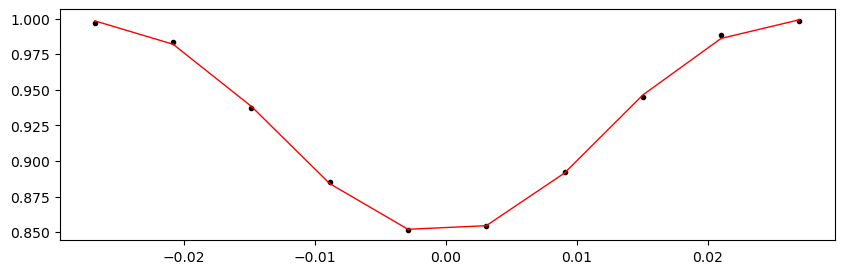

55420.764381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.72it/s]


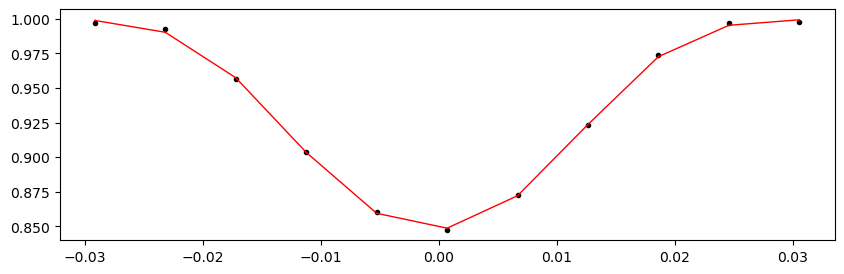

55424.18498106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.89it/s]


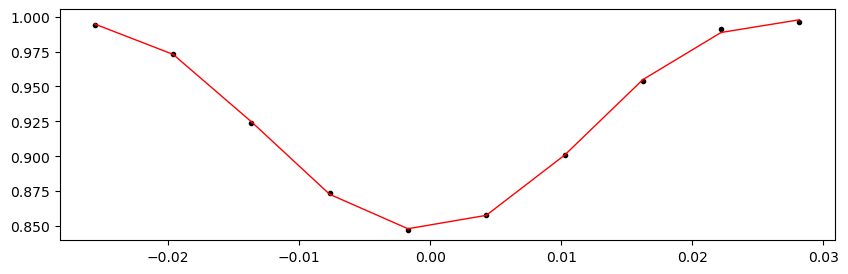

55427.60558106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.50it/s]


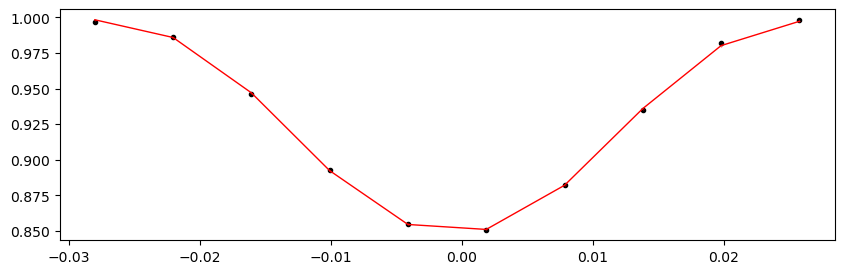

55434.44678106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.33it/s]


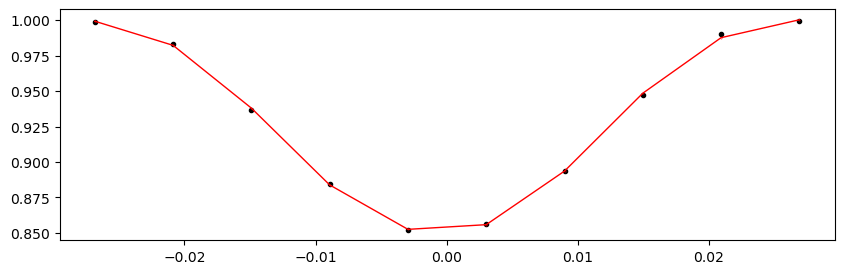

55437.86738106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.56it/s]


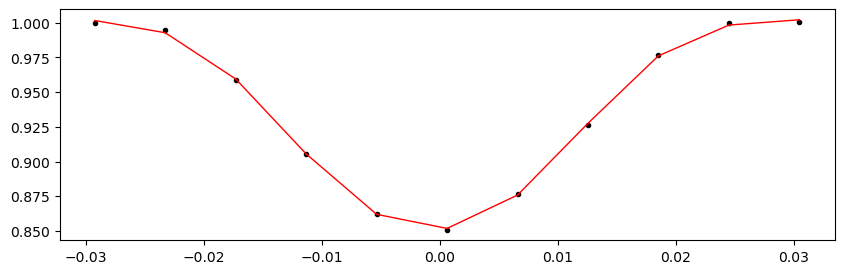

55441.287981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.27it/s]


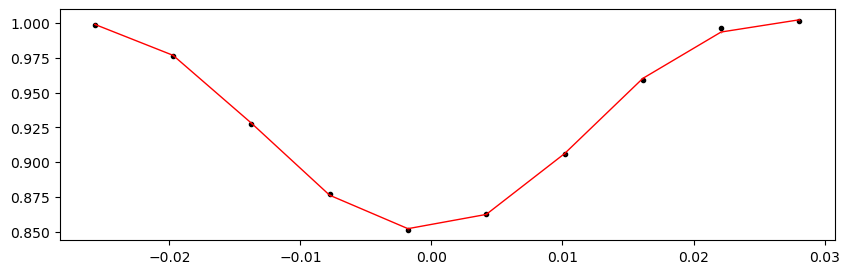

55444.708581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.05it/s]


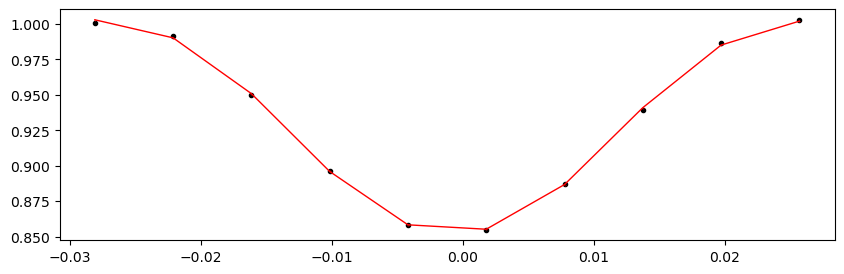

55448.12918106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.36it/s]


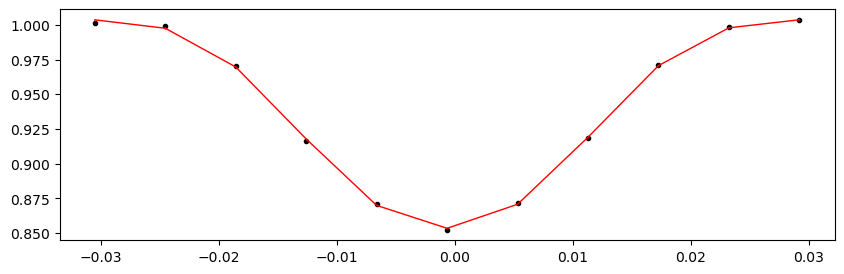

Time 55451.549781060006 does not have enough data points: 9
55454.970381060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.74it/s]


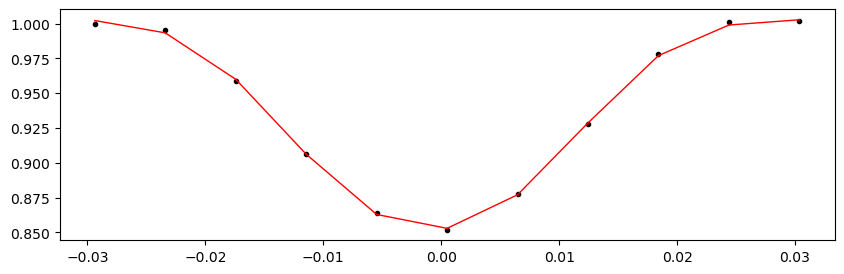

55458.39098106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 446.08it/s]


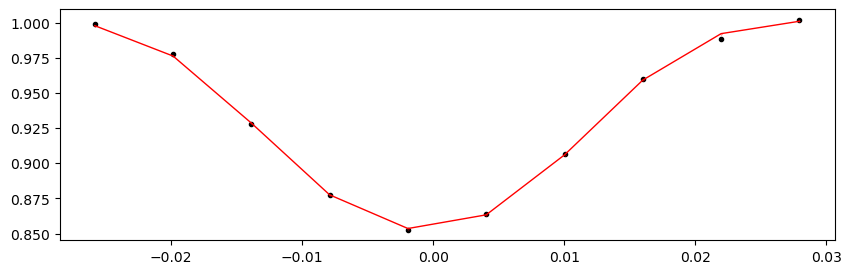

Time 55461.81158106001 does not have enough data points: 4
55465.232181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 431.35it/s]


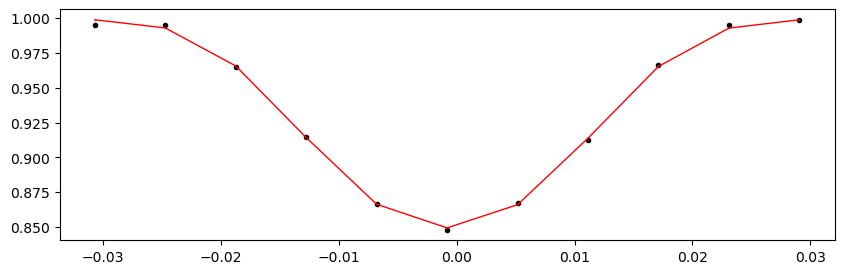

55468.65278106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.73it/s]


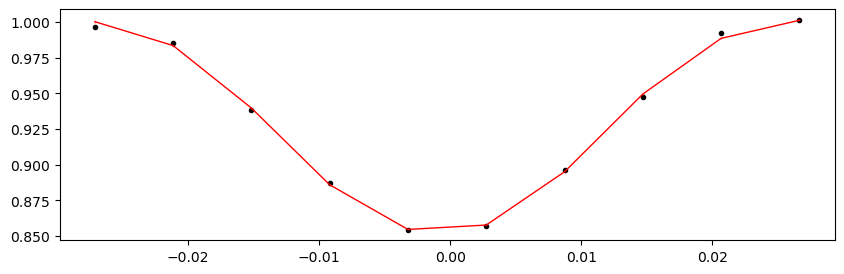

55472.07338106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.92it/s]


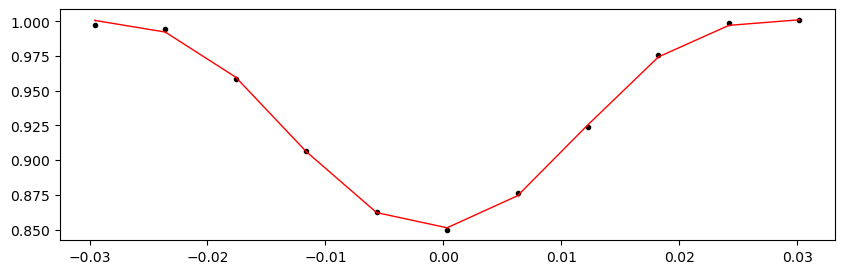

55475.493981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.08it/s]


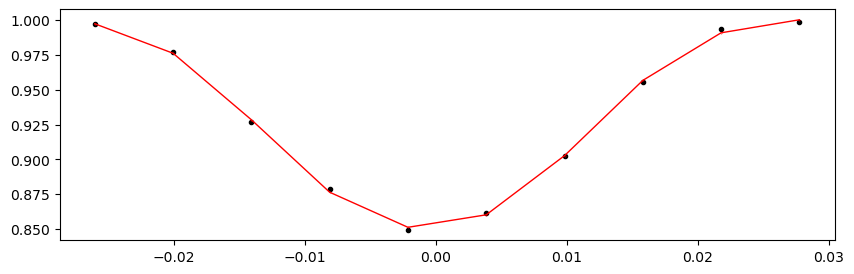

55478.91458106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 434.69it/s]


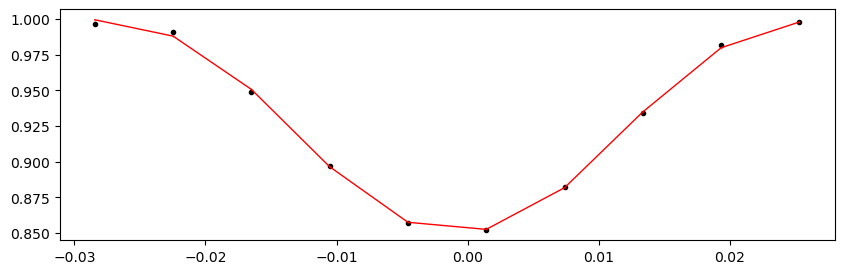

55482.33518106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.07it/s]


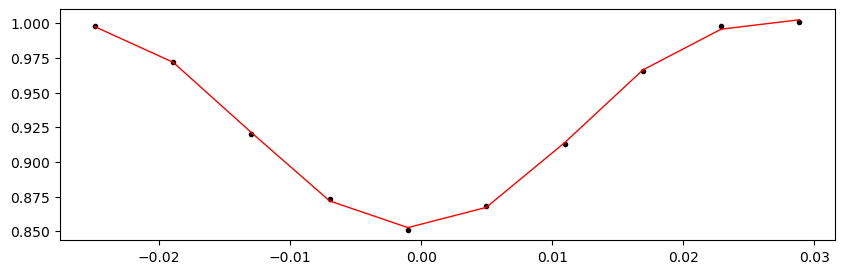

55485.755781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.20it/s]


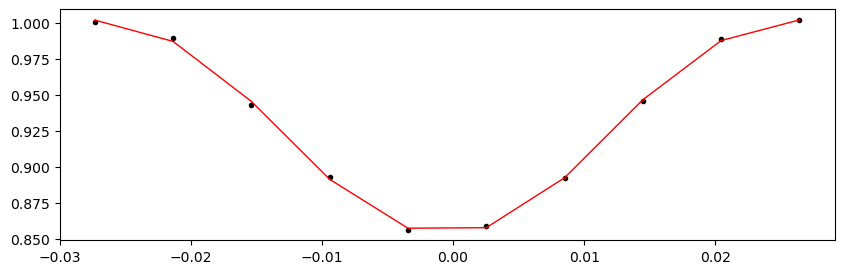

55489.17638106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.44it/s]


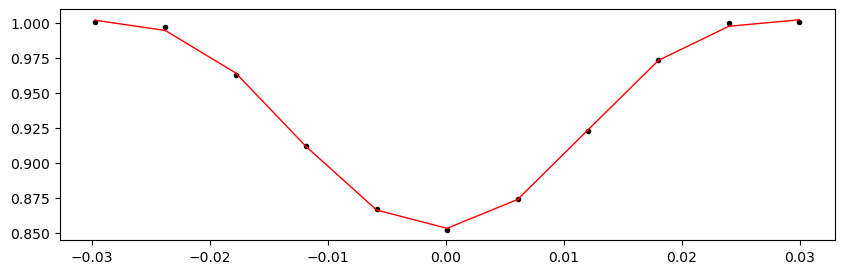

55492.59698106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.89it/s]


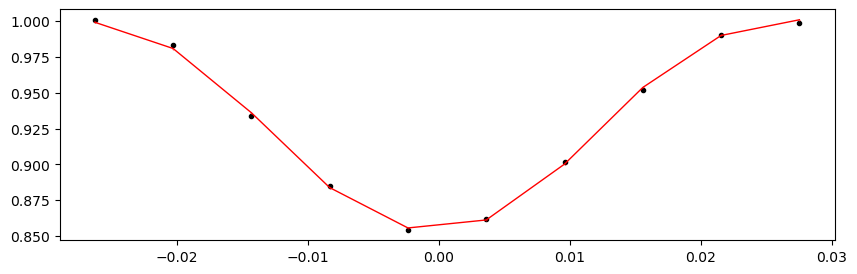

55496.017581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.34it/s]


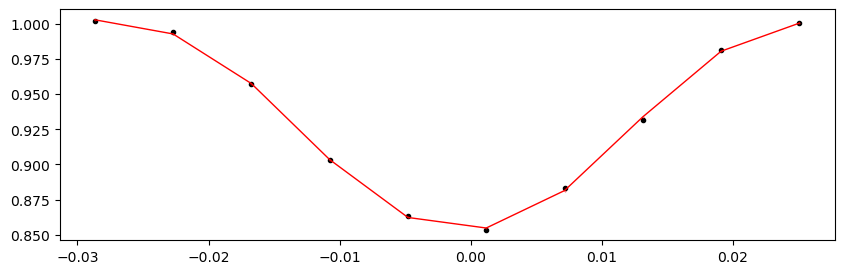

55499.43818106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.40it/s]


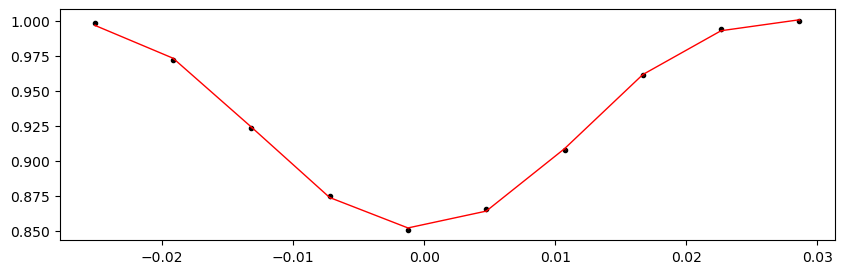

55502.85878106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.73it/s]


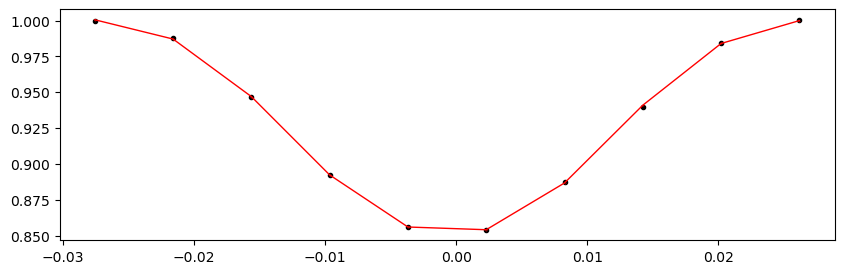

55506.279381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.76it/s]


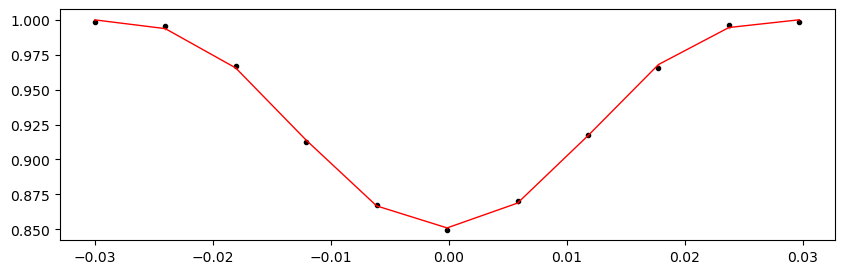

55509.69998106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.89it/s]


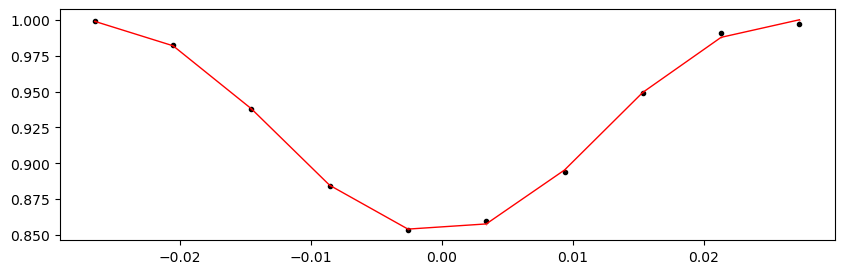

55513.12058106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.75it/s]


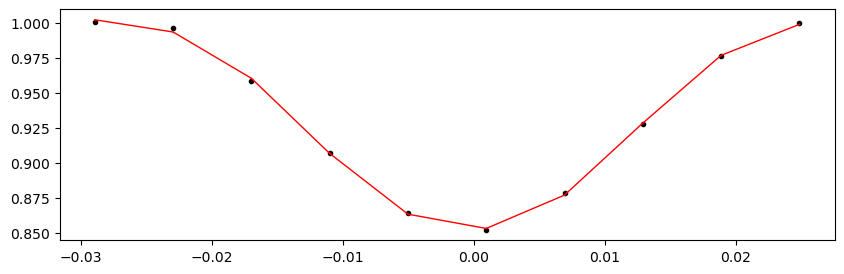

Time 55516.541181060005 does not have enough data points: 9
55519.96178106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.71it/s]


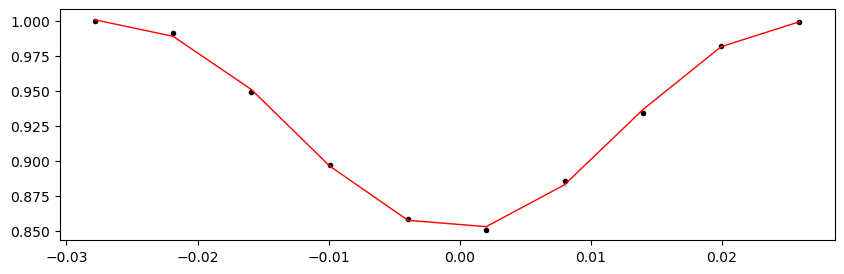

55526.802981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.89it/s]


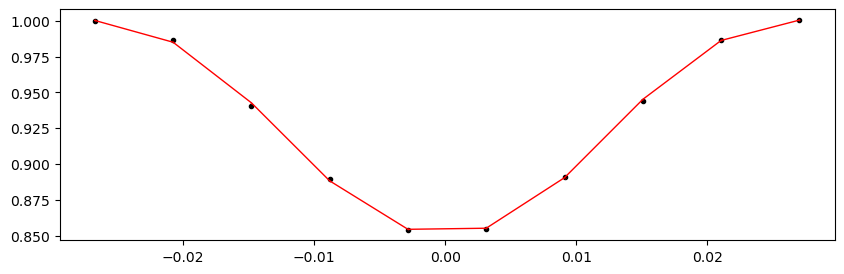

55530.22358106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.65it/s]


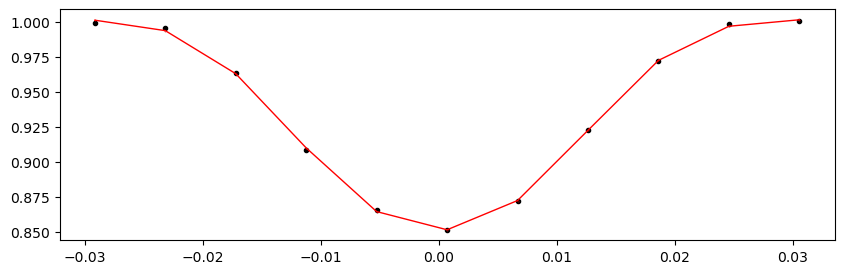

55533.64418106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.10it/s]


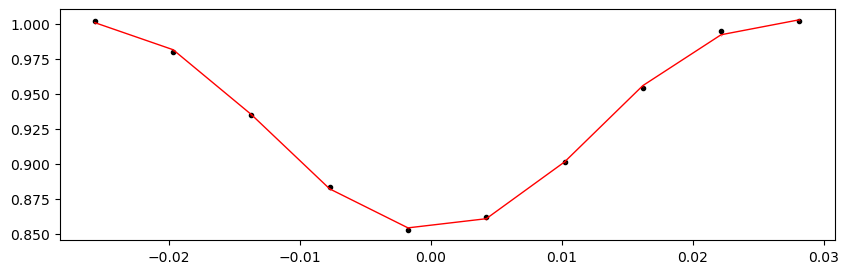

55537.064781060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.44it/s]


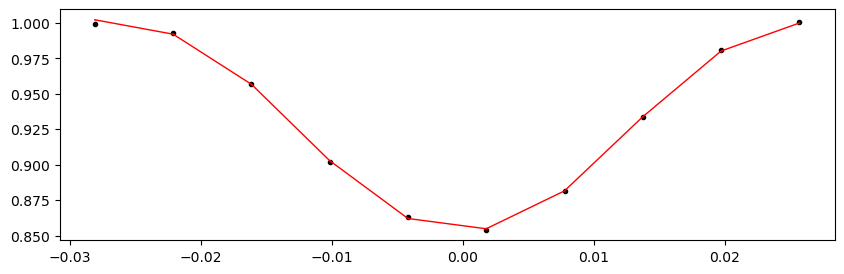

55540.48538106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.00it/s]


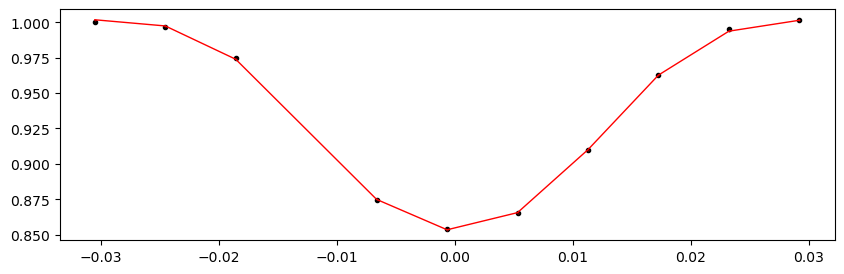

Time 55543.90598106001 does not have enough data points: 4
55547.326581060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.38it/s]


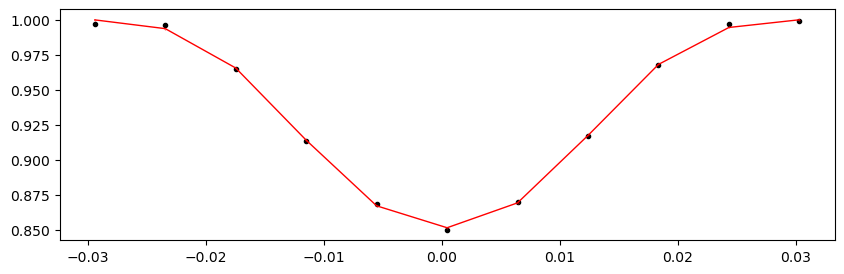

55550.747181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.05it/s]


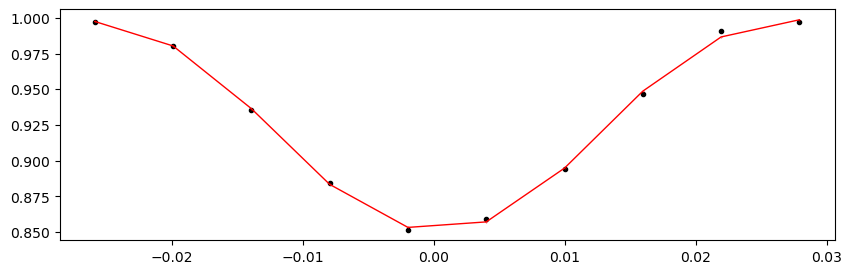

Time 55567.85018106001 does not have enough data points: 4
55571.270781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.61it/s]


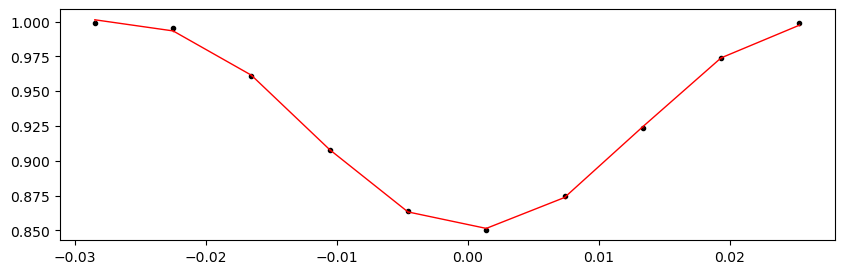

55574.69138106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.16it/s]


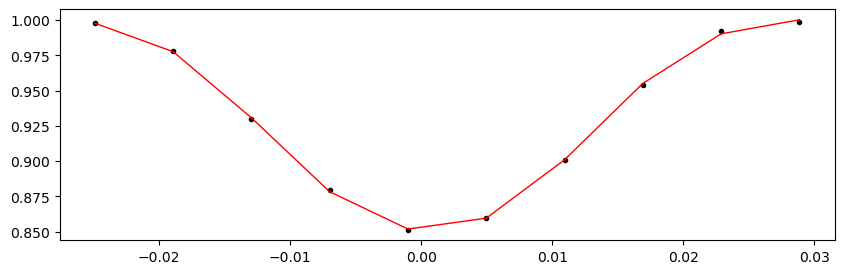

55578.11198106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.66it/s]


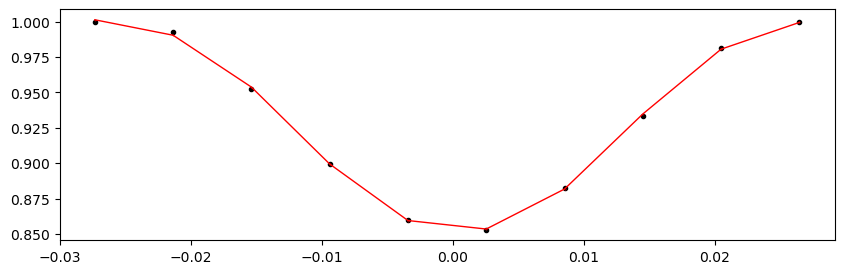

55581.532581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.19it/s]


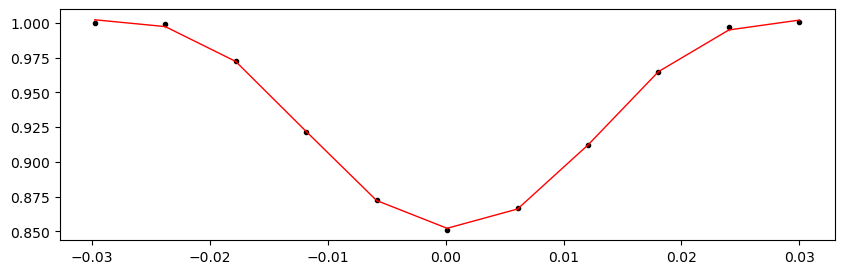

55584.95318106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.67it/s]


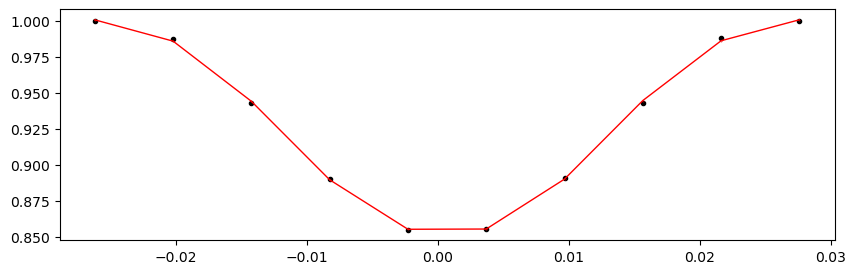

55588.37378106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.44it/s]


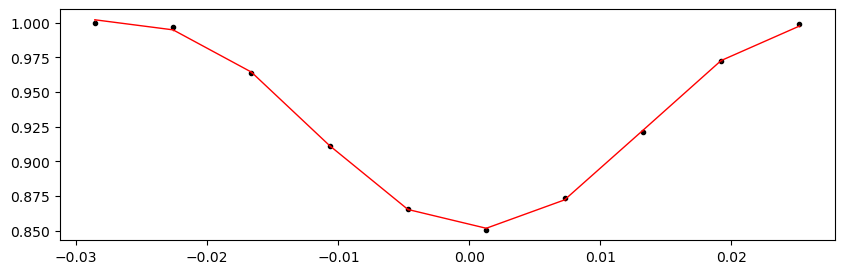

55591.794381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.80it/s]


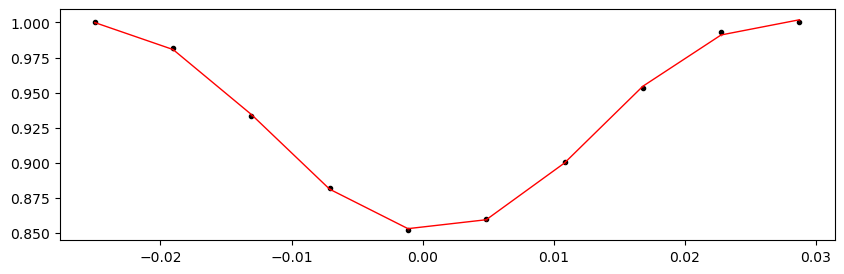

55598.63558106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.11it/s]


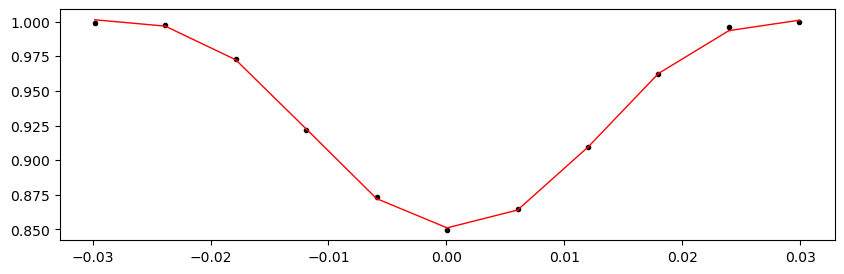

Time 55602.056181060005 does not have enough data points: 9
55605.47678106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.68it/s]


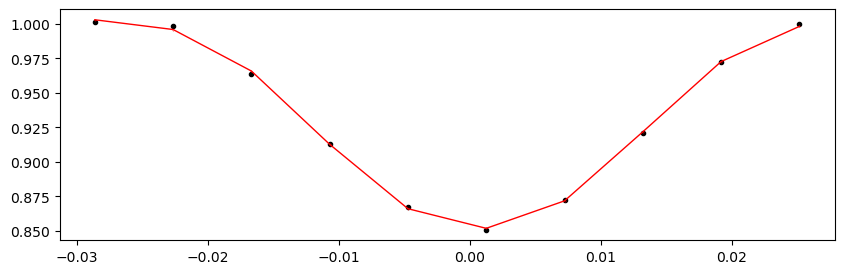

55608.89738106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.35it/s]


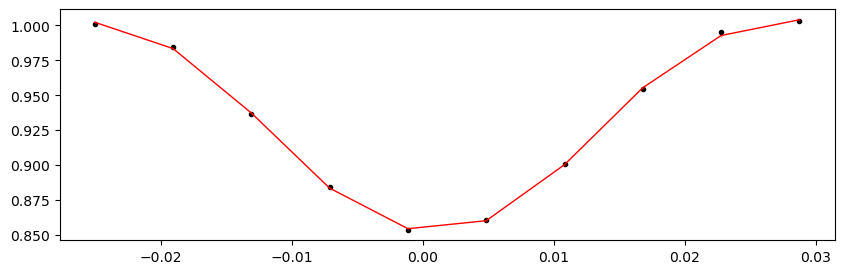

55612.317981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.61it/s]


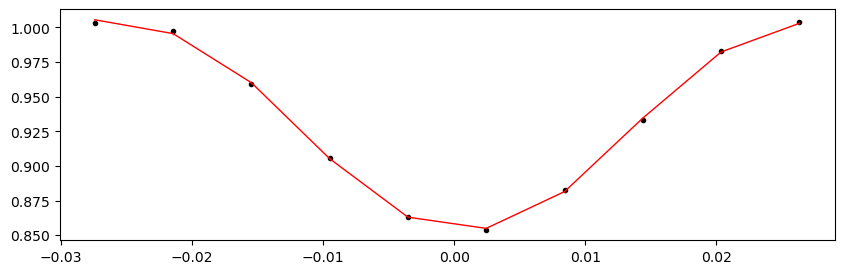

55615.73858106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.41it/s]


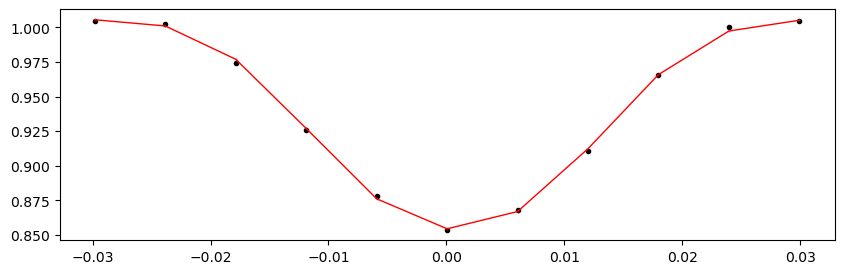

55619.15918106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.48it/s]


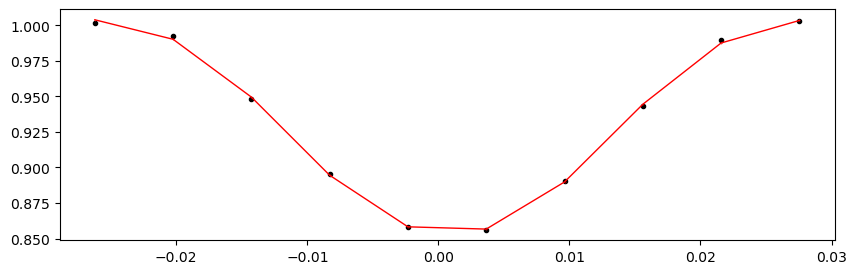

55622.579781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.17it/s]


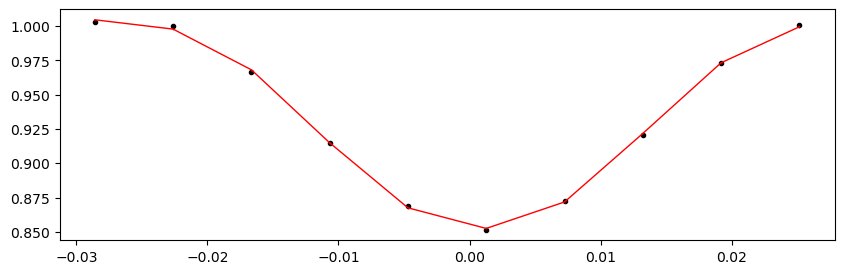

Time 55626.00038106 does not have enough data points: 9
55629.42098106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.55it/s]


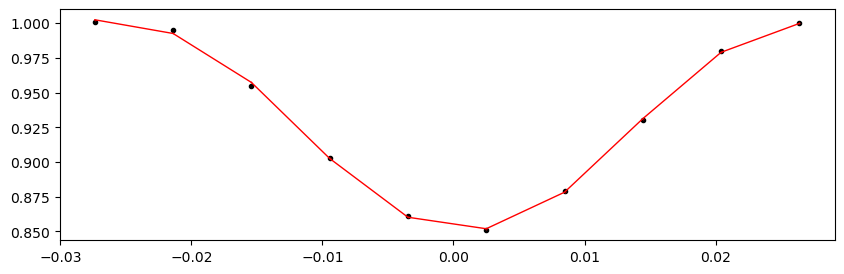

55632.841581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.33it/s]


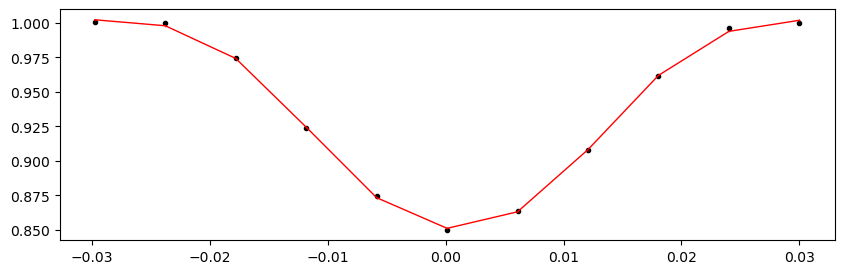

Time 55643.103381060006 does not have enough data points: 9
55646.52398106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.30it/s]


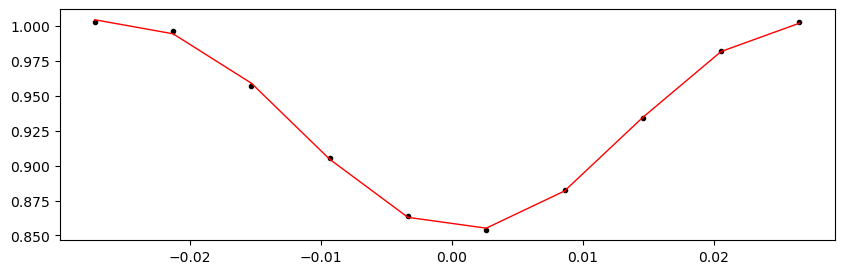

55649.94458106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.60it/s]


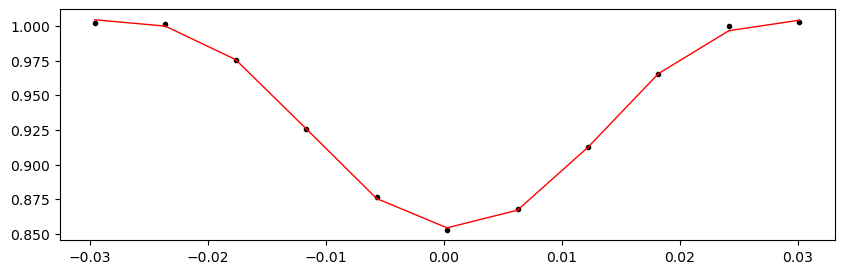

Time 55653.365181060006 does not have enough data points: 9
55656.78578106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.57it/s]


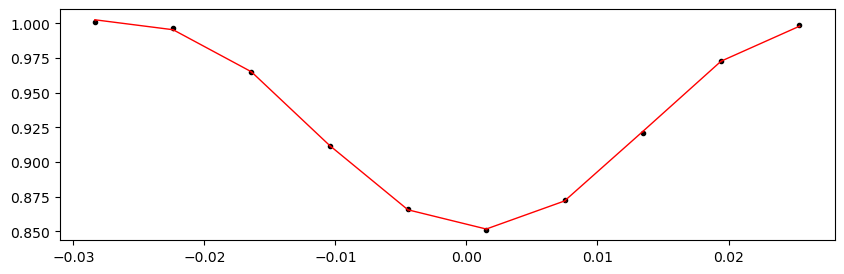

55660.20638106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.73it/s]


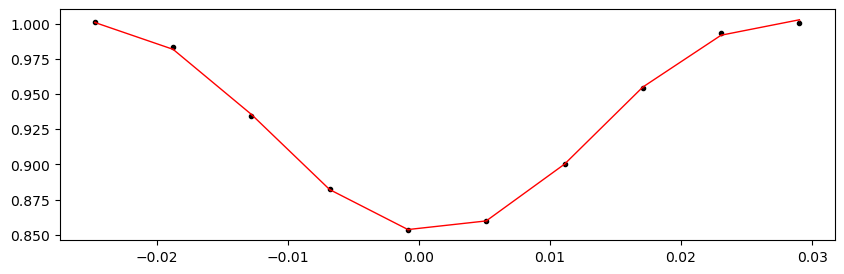

55663.626981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 439.60it/s]


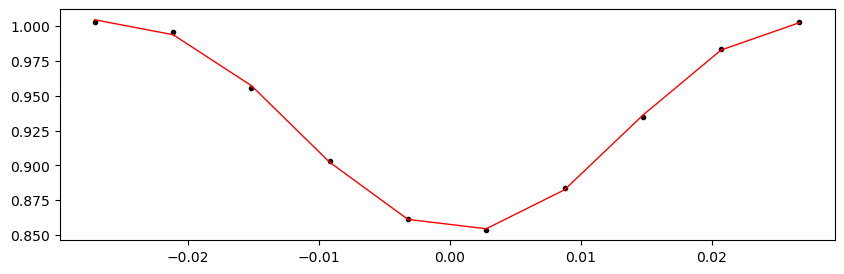

55667.047581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.40it/s]


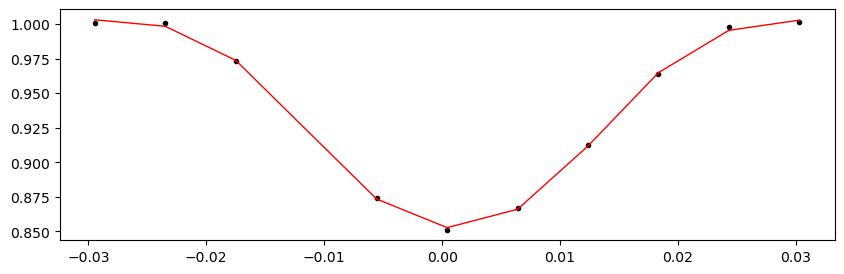

55670.46818106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.75it/s]


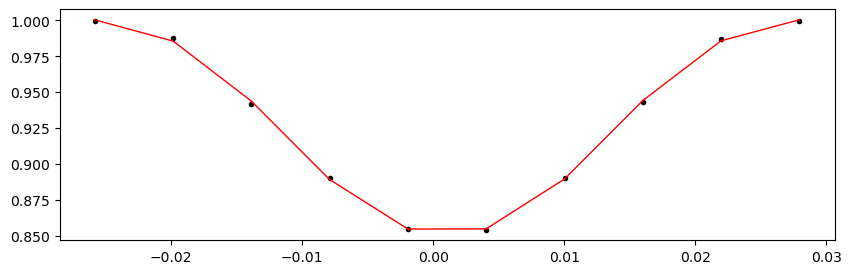

55673.888781060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.81it/s]


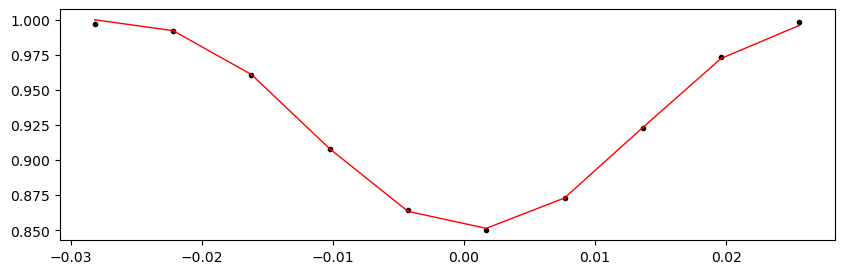

55677.309381060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.03it/s]


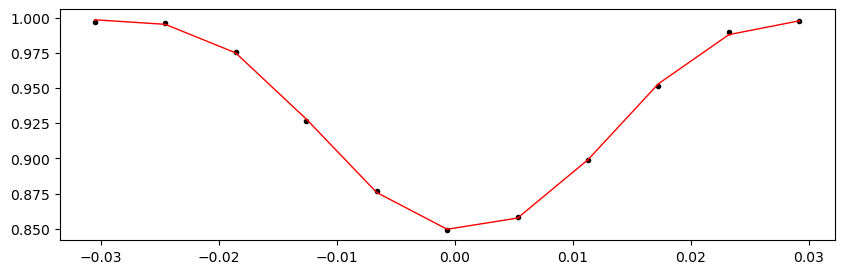

55680.72998106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.13it/s]


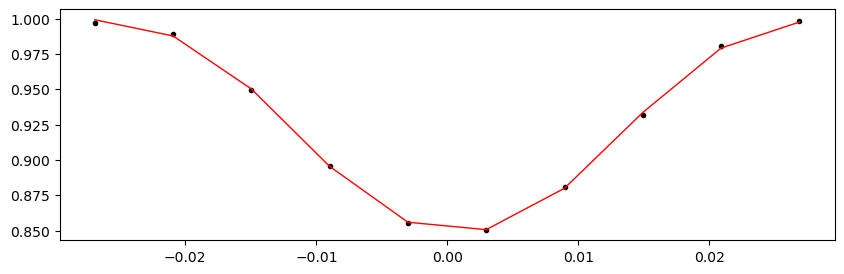

55684.15058106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.88it/s]


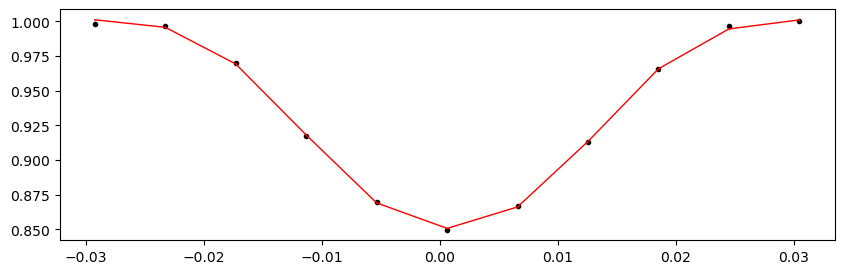

55687.571181060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.84it/s]


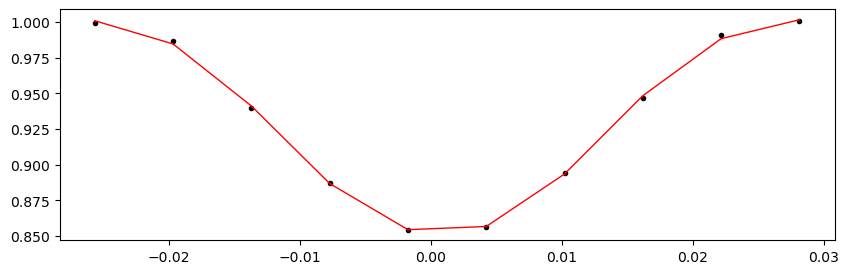

55690.99178106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.56it/s]


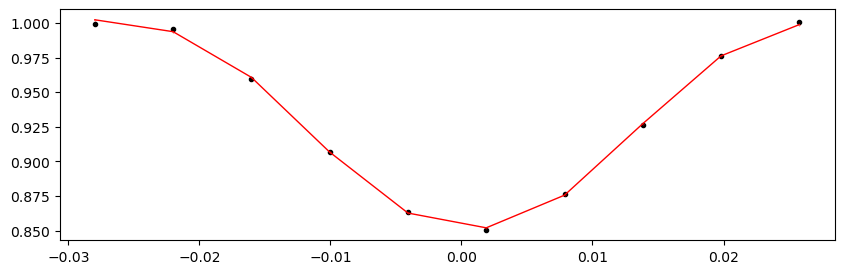

55694.41238106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.02it/s]


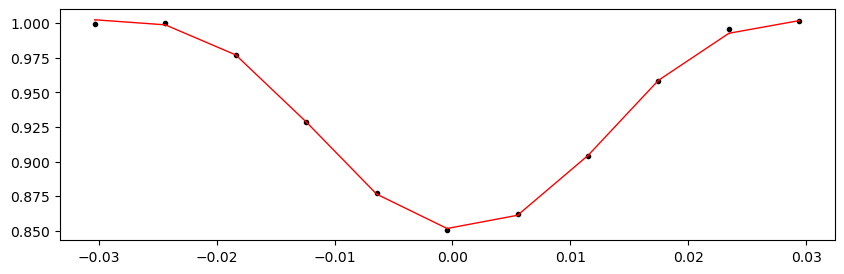

55697.832981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.49it/s]


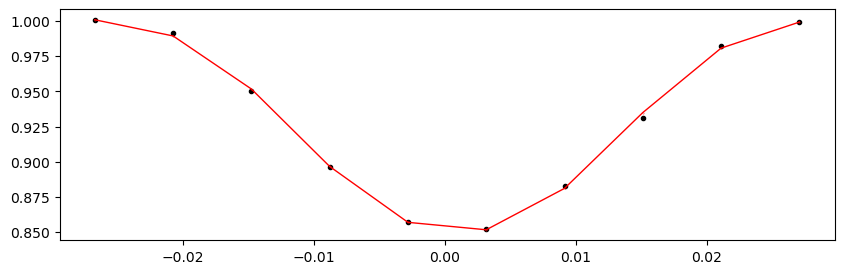

Time 55701.25358106 does not have enough data points: 9
55704.67418106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 445.36it/s]


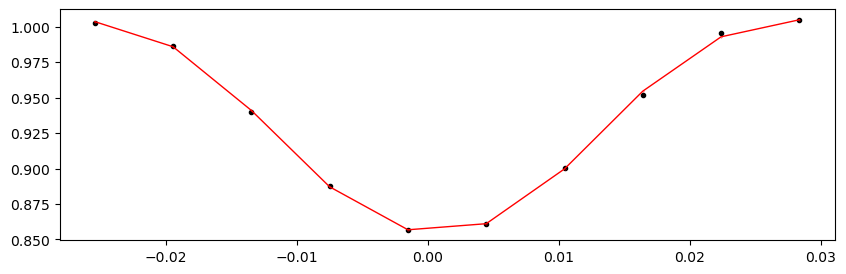

55708.094781060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.73it/s]


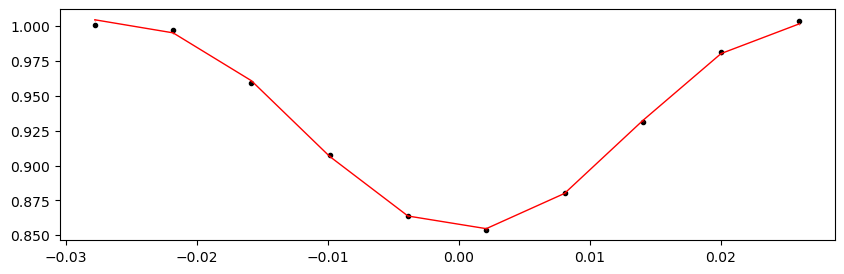

55711.51538106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.45it/s]


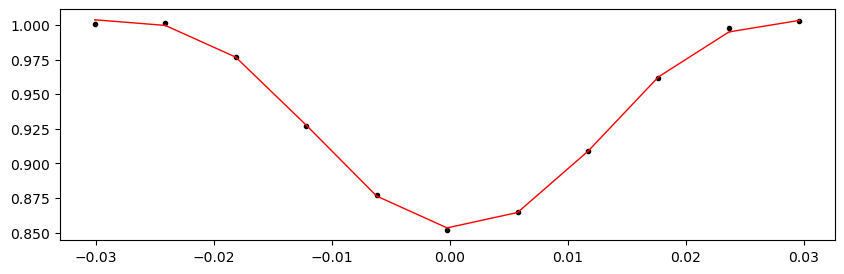

55714.93598106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.91it/s]


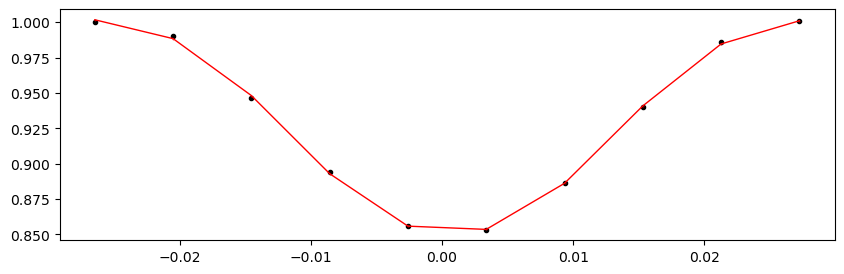

Time 55718.356581060005 does not have enough data points: 9
55721.77718106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.19it/s]


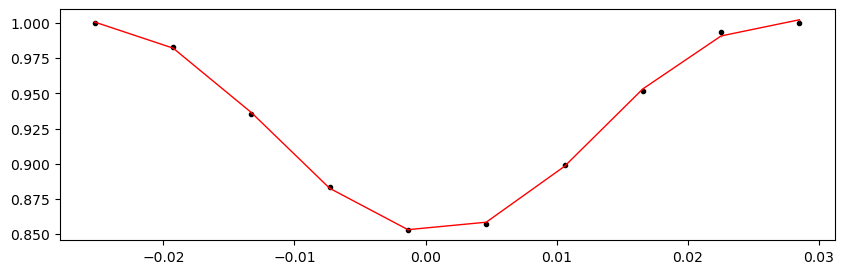

55725.19778106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.74it/s]


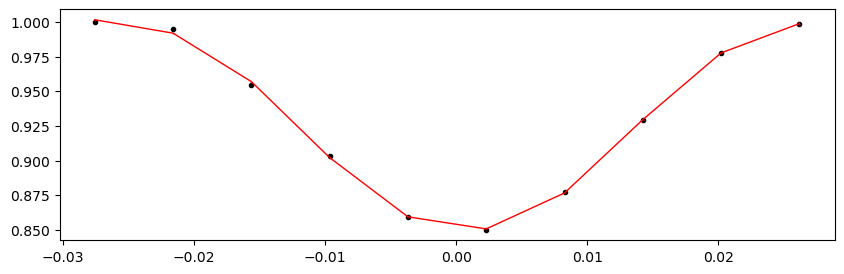

55728.618381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.84it/s]


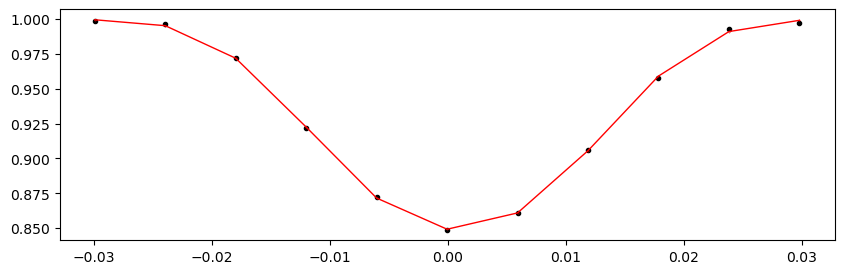

55732.03898106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.32it/s]


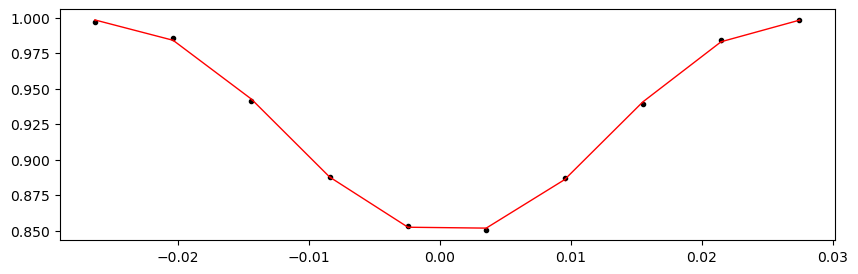

55735.45958106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.73it/s]


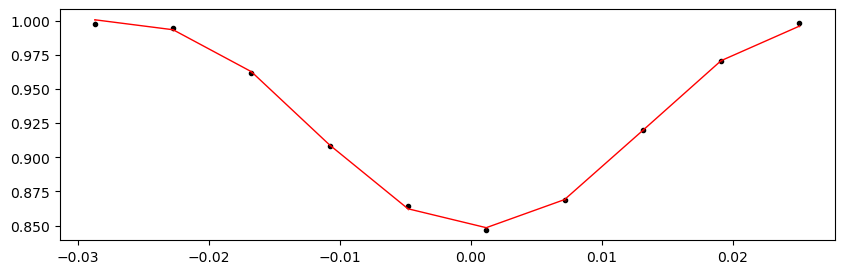

55742.30078106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.59it/s]


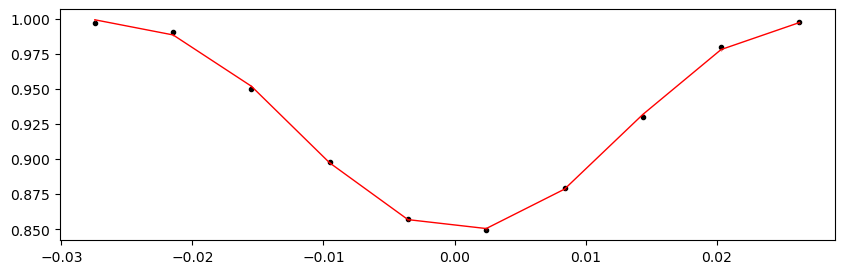

55745.72138106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 437.67it/s]


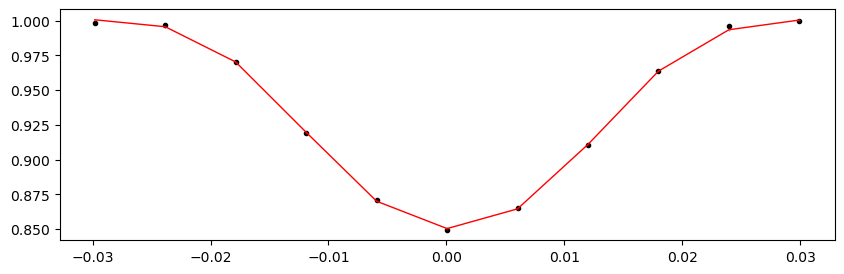

55749.141981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.69it/s]


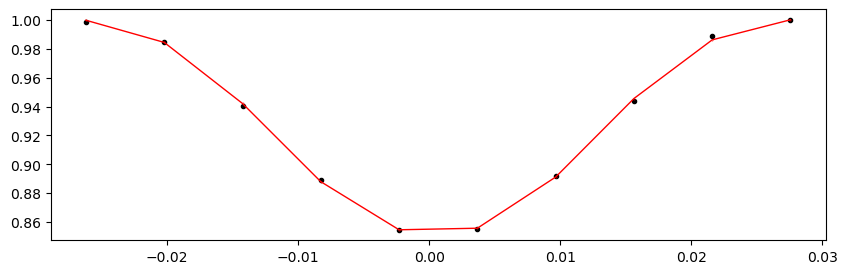

55752.56258106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.67it/s]


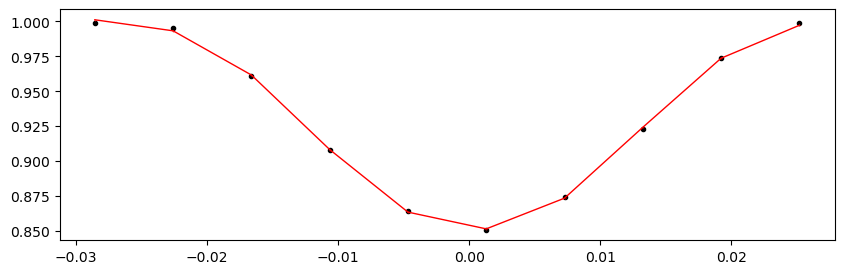

55755.98318106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 444.06it/s]


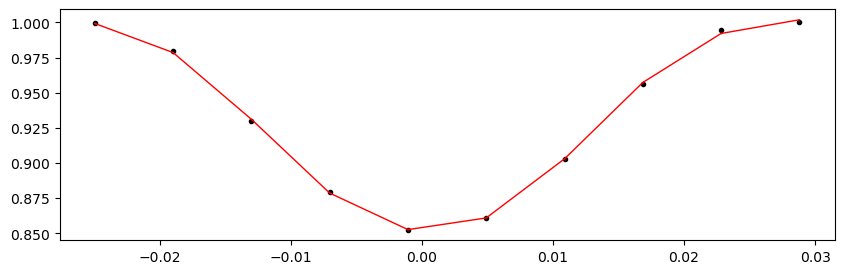

Time 55759.403781060006 does not have enough data points: 9
55762.82438106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.10it/s]


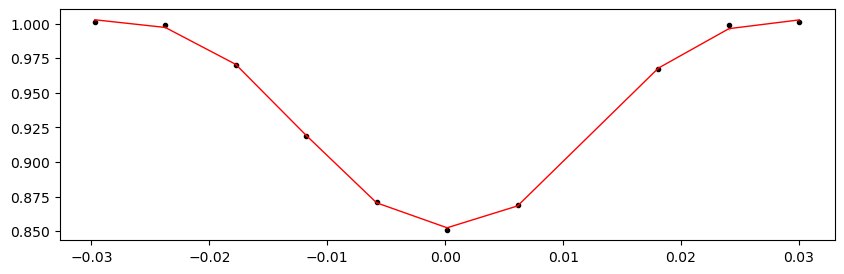

55766.24498106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 440.01it/s]


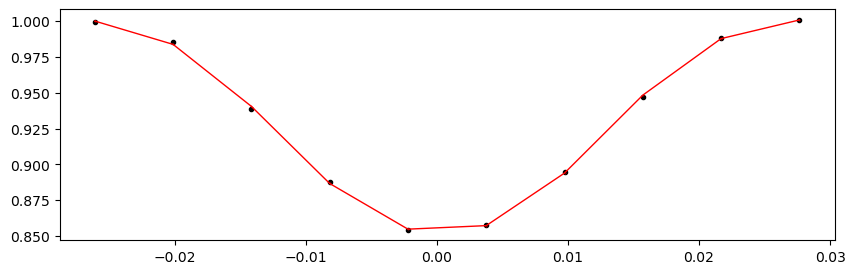

55773.08618106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 438.98it/s]


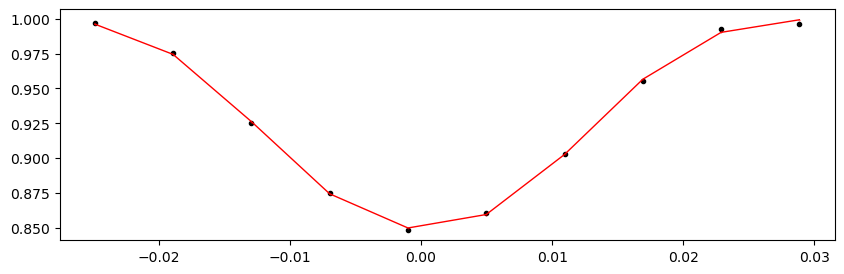

55776.50678106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.72it/s]


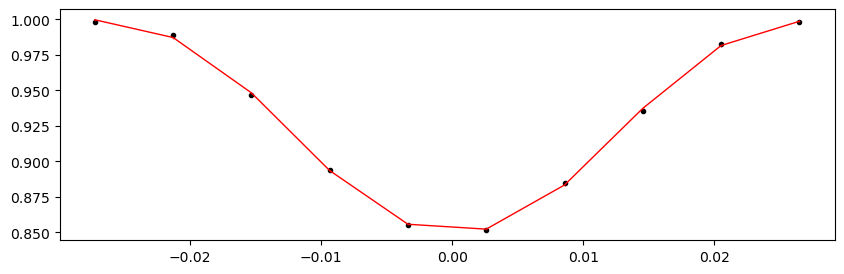

55779.927381060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 441.45it/s]


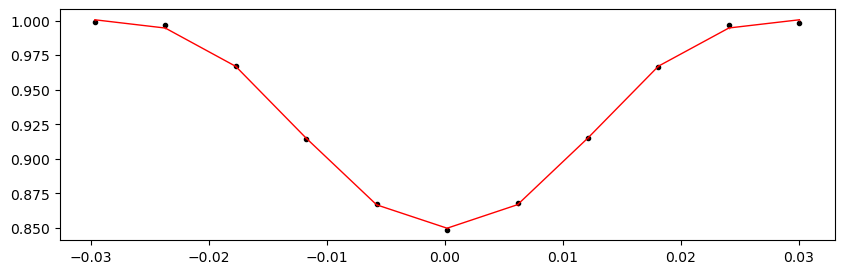

55783.347981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.35it/s]


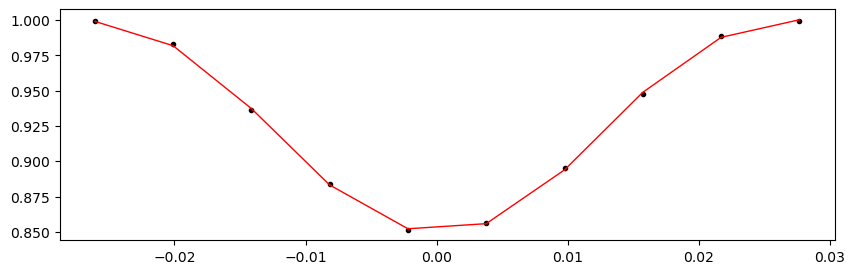

55786.76858106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.60it/s]


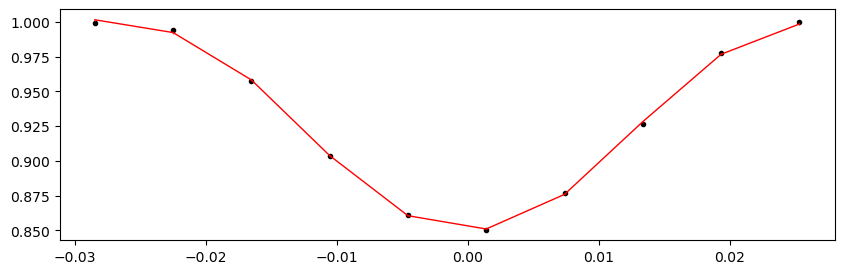

55790.18918106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.23it/s]


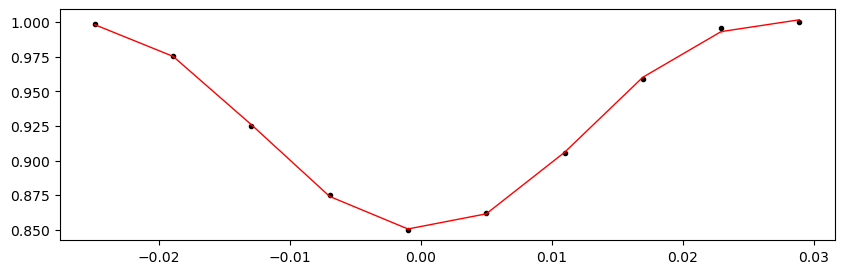

55793.609781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 443.74it/s]


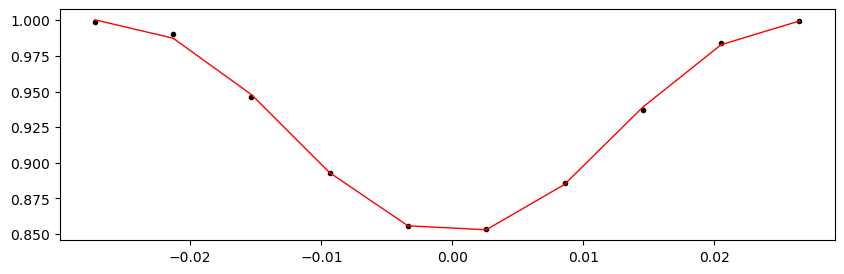

55797.03038106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:22<00:00, 442.18it/s]


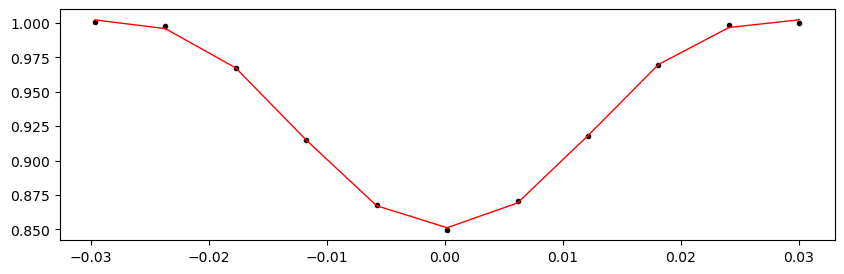

59392.080981060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.20it/s]


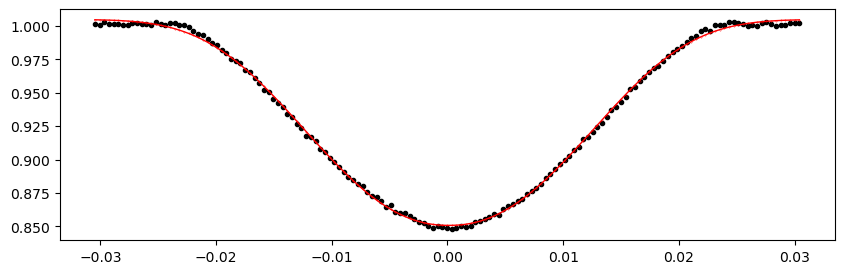

59395.50158106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.05it/s]


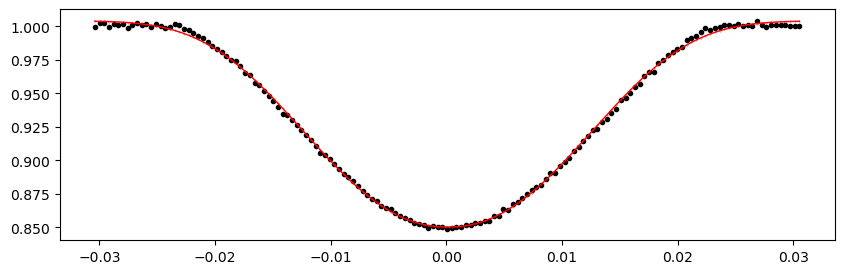

59398.92218106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.52it/s]


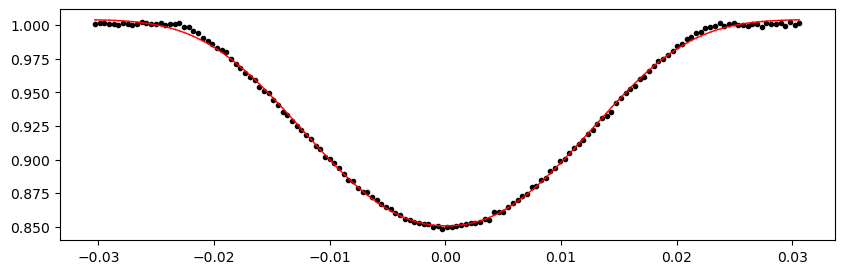

59402.342781060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.81it/s]


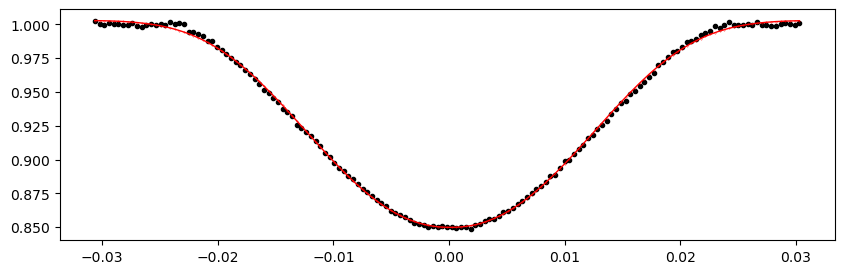

59405.76338106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.63it/s]


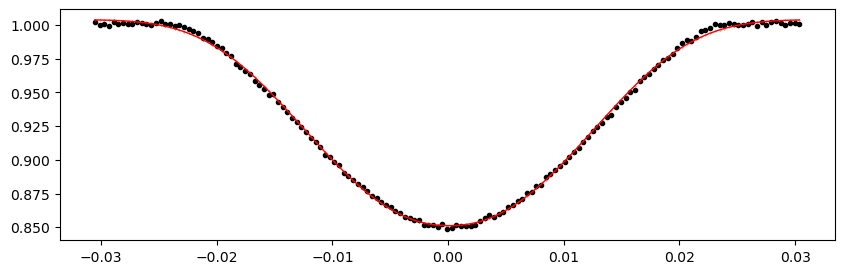

59409.18398106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.85it/s]


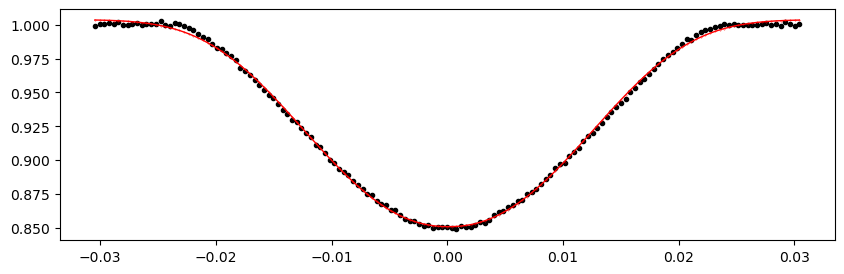

59412.604581060004 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.68it/s]


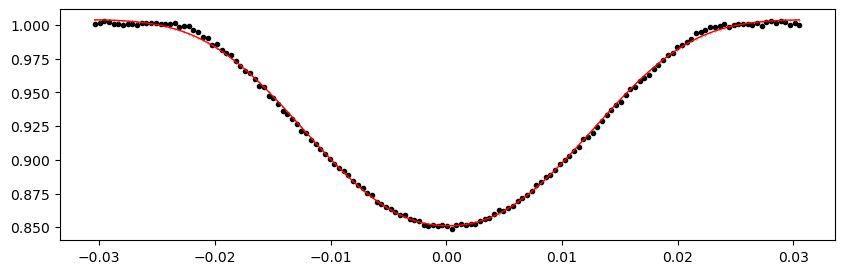

59416.02518106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.85it/s]


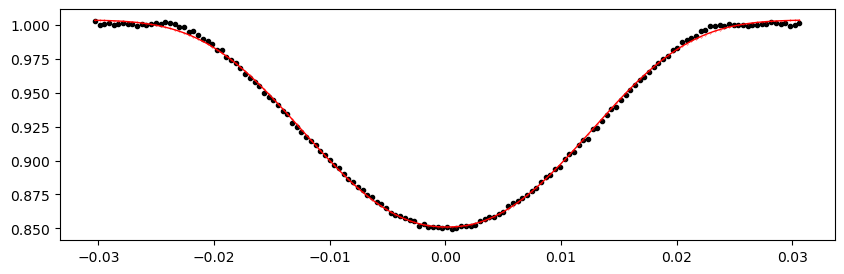

59419.44578106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:21<00:00, 458.21it/s]


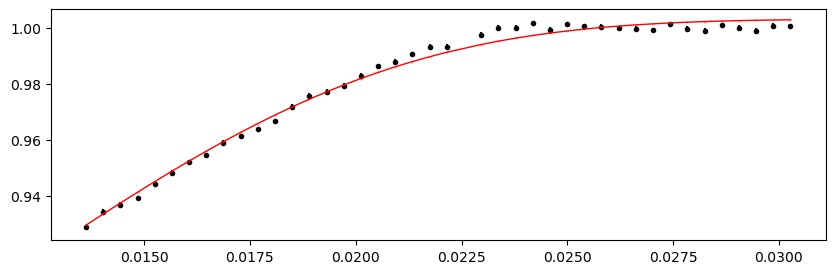

59422.866381060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.37it/s]


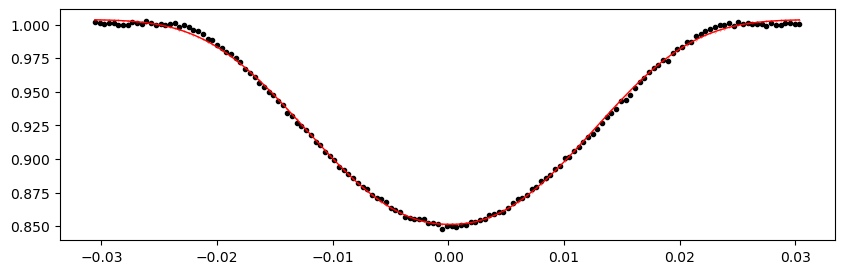

59426.28698106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.32it/s]


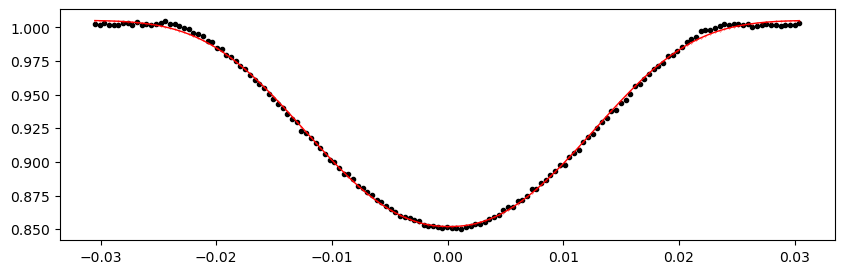

59429.70758106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.59it/s]


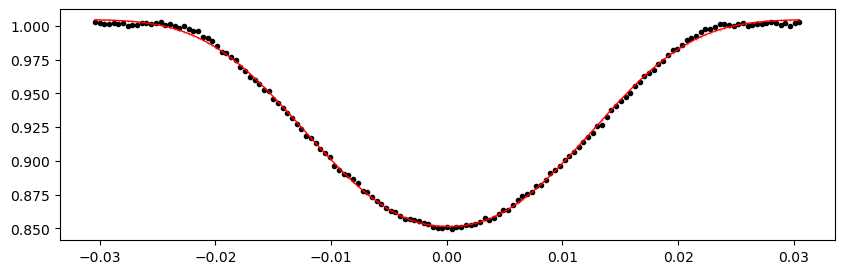

Time 59433.128181060005 does not have enough data points: 9
59436.54878106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.43it/s]


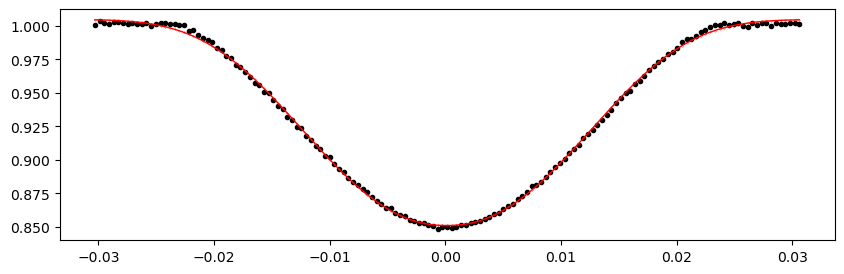

59439.96938106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.56it/s]


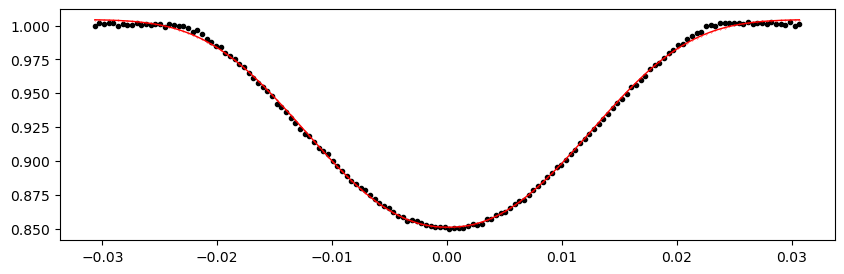

59443.389981060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.15it/s]


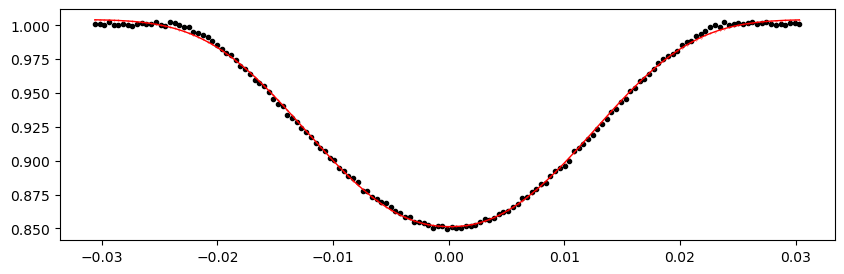

59771.767581060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.69it/s]


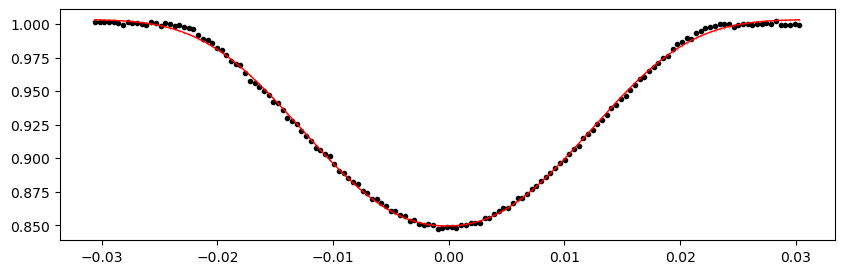

59775.18818106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.14it/s]


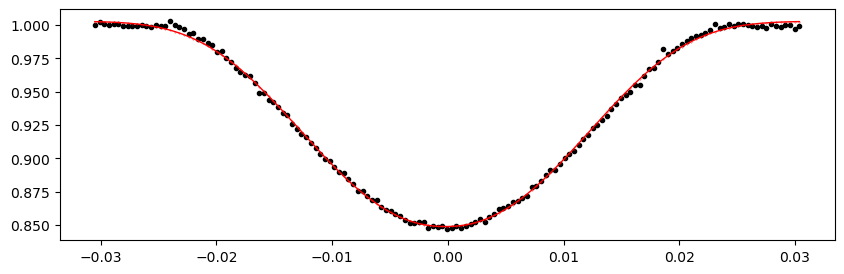

59778.60878106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.85it/s]


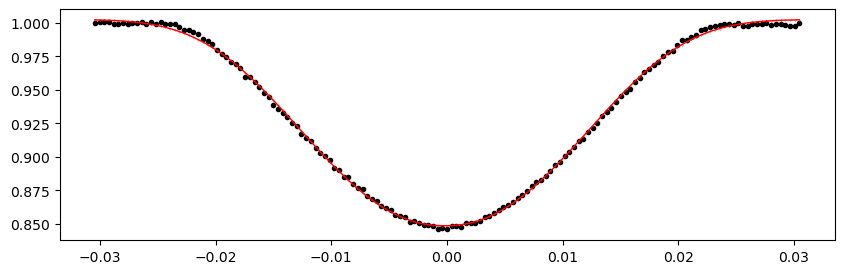

59785.44998106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.51it/s]


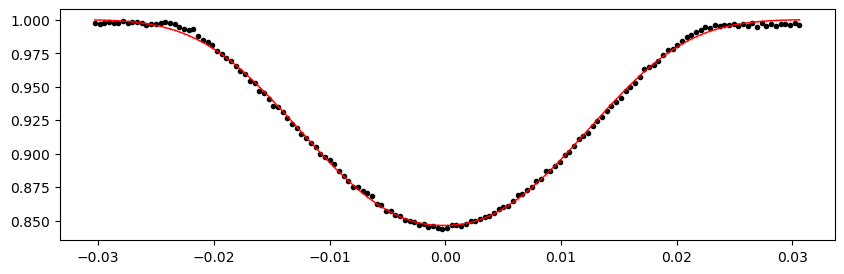

59788.87058106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 350.73it/s]


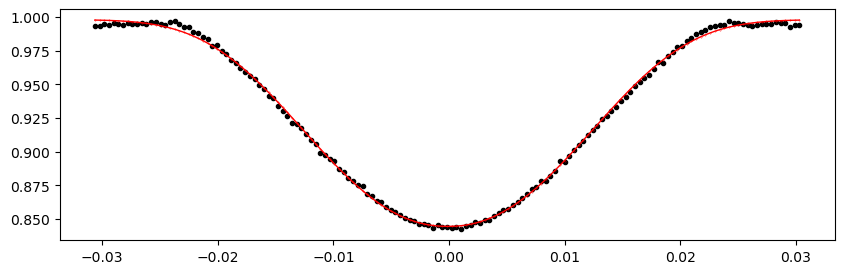

59792.291181060005 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 409.17it/s]


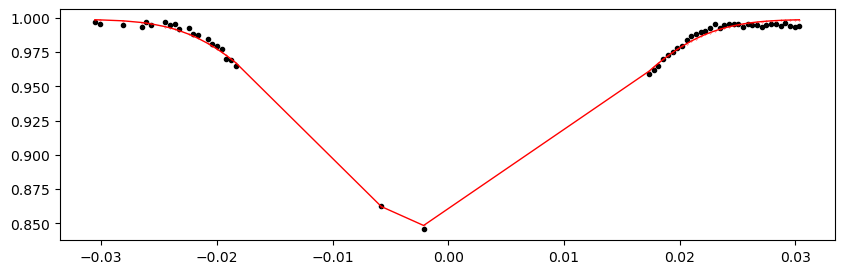

59795.71178106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:18<00:00, 534.18it/s]


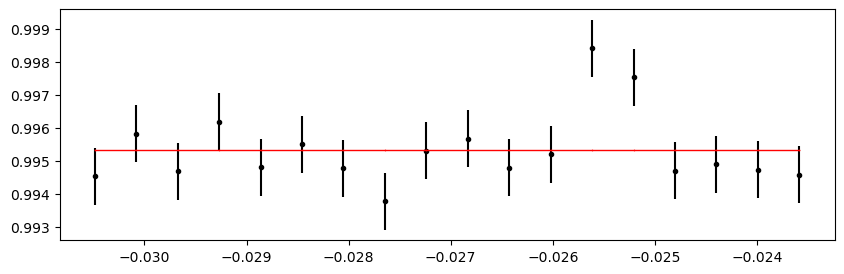

59799.13238106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.99it/s]


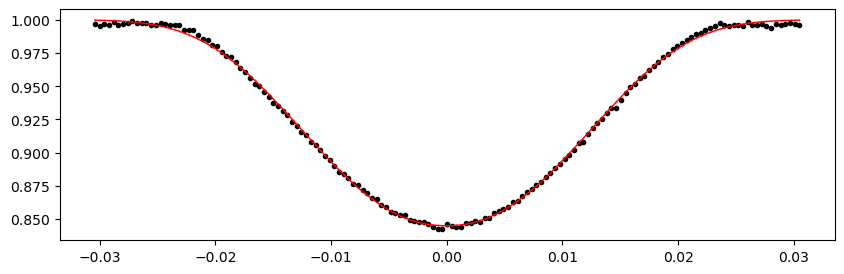

59802.552981060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.32it/s]


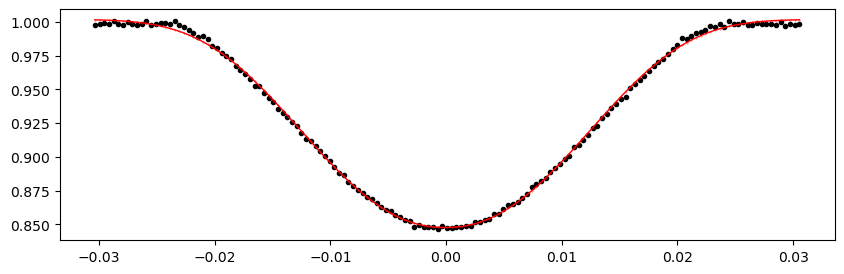

59805.97358106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.05it/s]


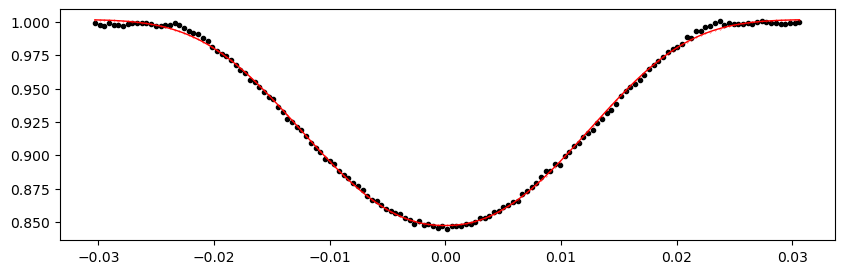

59809.39418106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.70it/s]


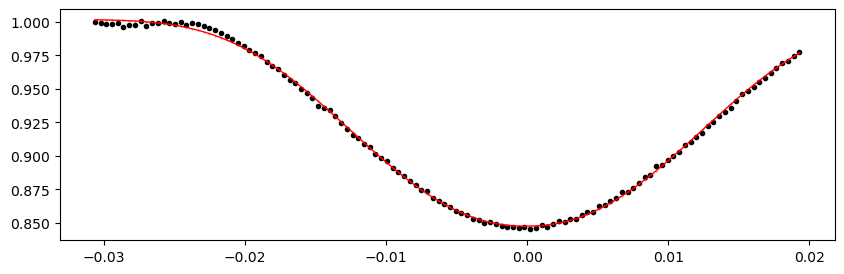

59812.814781060006 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.72it/s]


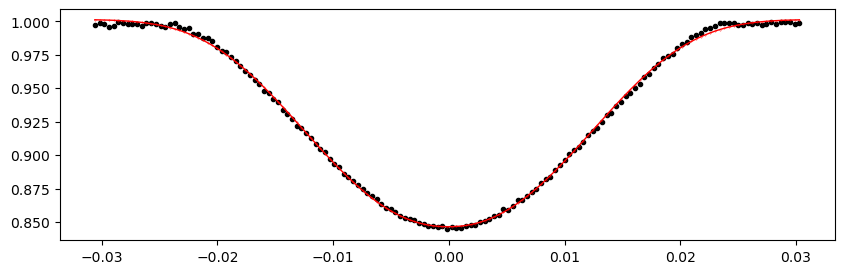

59816.23538106 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 345.82it/s]


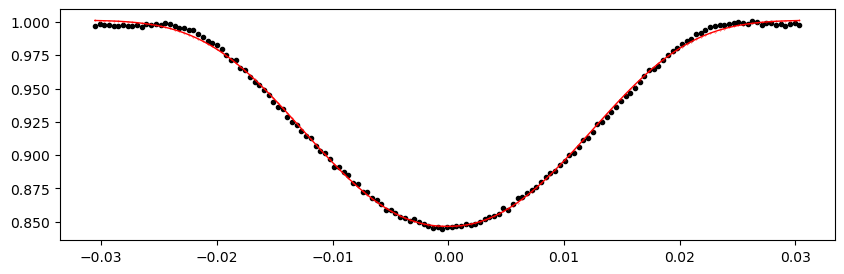

59819.65598106001 1.0020415726999536 -0.15060591856147404 0.05970930768129202


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 348.18it/s]


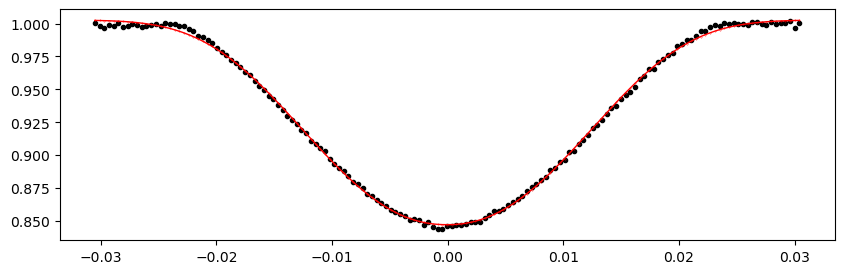

In [63]:
%matplotlib inline

from importlib import reload
reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=9,  # Kepler 30-min cadene data requires a lower min_number_data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"

# -----

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=9,  # Kepler 30-min cadene data requires a lower min_number_data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

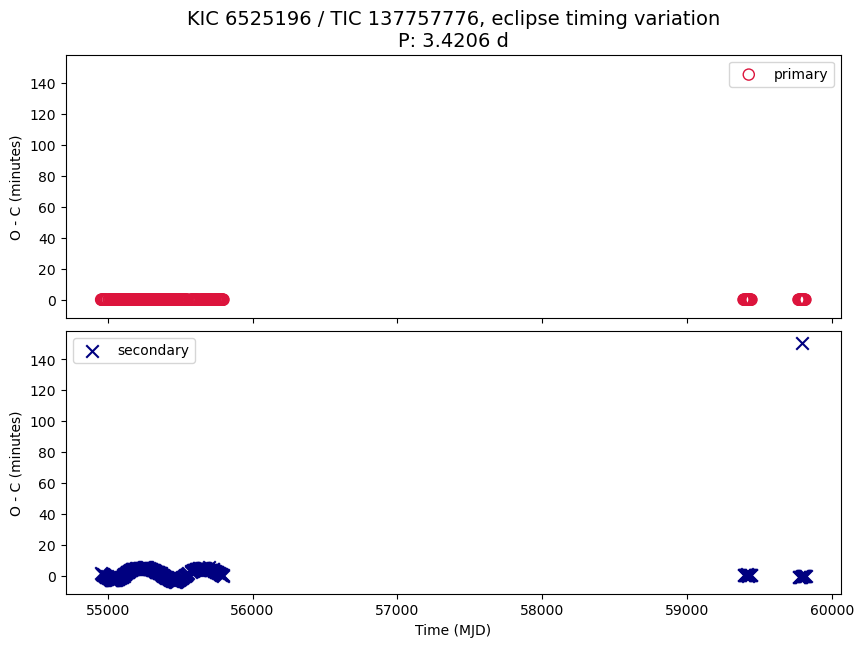

In [83]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True, sharey=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60


axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
# axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
#              lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    # axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
    #              lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

### O-C Plot, Zoom In

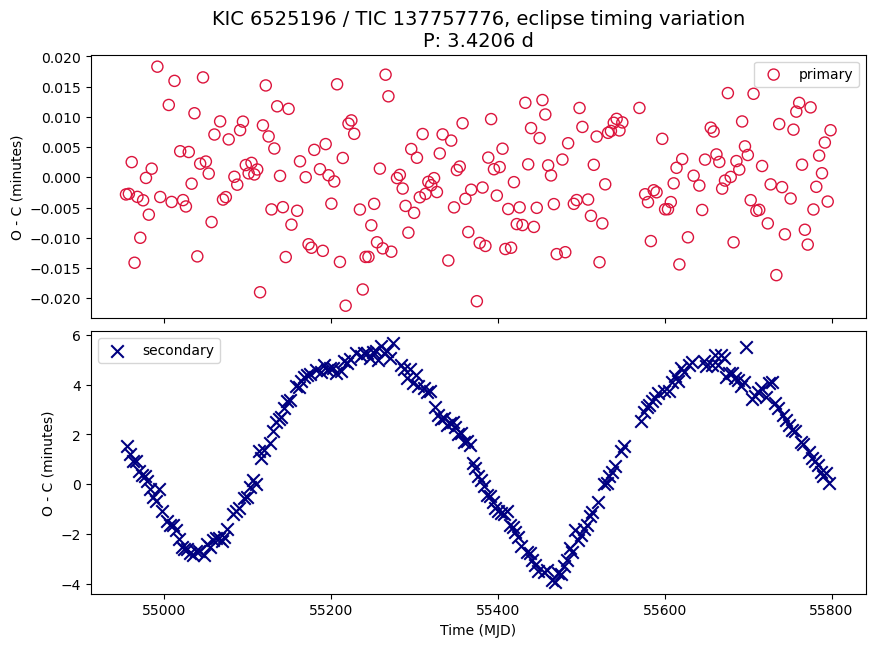

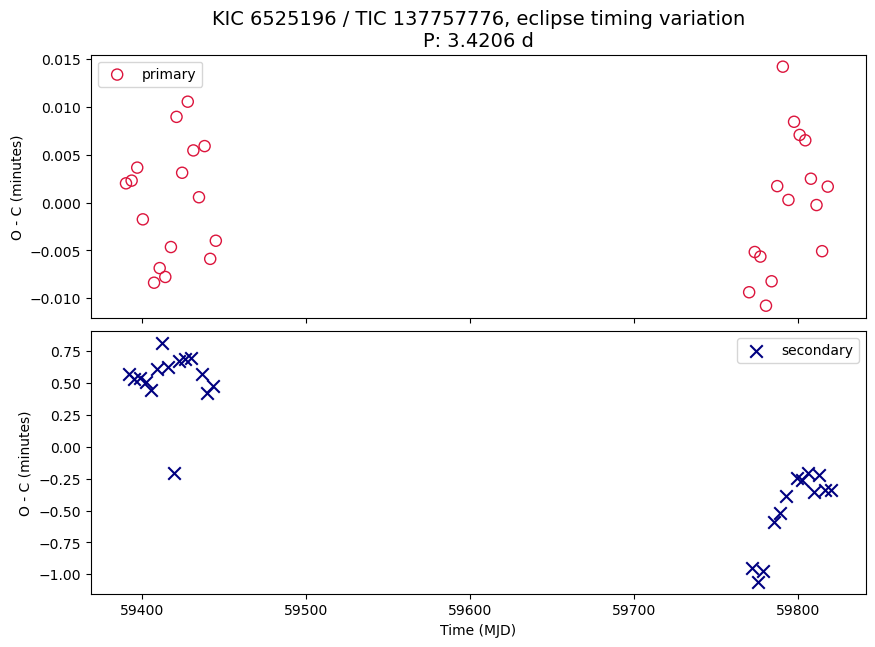

In [82]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] < 55800]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] < 55800]


    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

# ---

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary = in_df_primary[in_df_primary['epoch'] > 59000]

axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'], 
             marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")

if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary = in_df_secondary[in_df_secondary['epoch'] > 59000]
    in_df_secondary = in_df_secondary[in_df_secondary['shift_mins'] < 10]  # exclude a single outlier

    axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
                 marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );

    axs[1].set_xlim(axs[1].get_xlim()[0], axs[1].get_xlim()[0] + (axs[0].get_xlim()[1] - axs[0].get_xlim()[0]))  # same X scale

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid} / TIC {ticid}, eclipse timing variation\nP: {period} d", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()


## make a periodogram 

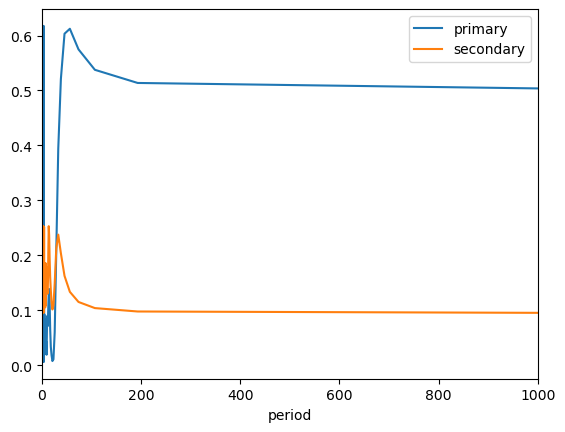

In [70]:
# TESS data roughly has a peak of ~500 days. The period found in Kepler data.
# it's understandably nosier

frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower(minimum_frequency=1 / 1000)  # ensure the max period exceeds ~500 d in the paper

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower(minimum_frequency=1 / 1000)
    plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.xlim(0, 1000)
plt.show()


## Results Summary

In [73]:
# FILL-IN the ETV results / comments
has_etv = "Practice"  # FP, not only it has no ETV, there is no evidence that the orbital period is significantly different from SB period
comments = "Reproducing Kepler ETV in 2013ApJ for secondary eclipises in Kepler data. TESS data might be consistent. ETV failed for primary eclipses."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),  # counting TESS only
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True, 
))

,0
tic,137757776
has_etv,Practice
comments,Reproducing Kepler ETV in 2013ApJ for secondary eclipises in Kepler data. TESS data might be consistent. ETV failed for primary eclipses.
period,3.4206
depth_pct_p,16.63
depth_pct_s,15.06
epoch_p,54953.852139
epoch_s,54955.562781
num_sectors,4
time_span,4870.73



tic,has_etv,comments,period,depth_pct_p,depth_pct_s,epoch_p,epoch_s,num_sectors,time_span,time_start,time_end
137757776,Practice,Reproducing Kepler ETV in 2013ApJ for secondary eclipises in Kepler data. TESS data might be consistent. ETV failed for primary eclipses.,3.4206,16.63,15.06,54953.852139,54955.562781060005,4,4870.73,54953.04,59823.77

